# mtDSB x Age DE analysis (pydeseq2, LRT-free)

In [6]:
import scanpy as sc
import decoupler as dc
import pertpy as pt
sc.set_figure_params(figsize=(3, 3), frameon=False)
import numpy as np
import pandas as pd
import scanpy as sc
from scipy import sparse
import warnings
warnings.filterwarnings("ignore")

def make_pseudobulk(adata, celltype, ct_col="celltype_merged",
                    sample_cols=("mouse_id","genotype","age"),
                    layer="counts"):
    ad = adata[adata.obs[ct_col] == celltype].copy()
    if layer in ad.layers:
        X = ad.layers[layer]
    else:
        X = ad.X
    if sparse.issparse(X):
        X = X.tocsr()

    # define samples as unique combinations of sample_cols
    meta = ad.obs.loc[:, sample_cols].astype(str)
    meta["sample_id"] = meta.apply(lambda r: "_".join(r.values), axis=1)

    # aggregate counts by sample_id
    sample_ids = meta["sample_id"].values
    uniq = pd.Index(np.unique(sample_ids), name="sample_id")
    # map each cell to column index
    col_index = pd.Series(pd.Categorical(sample_ids, categories=uniq)).cat.codes.values

    # build counts: genes x samples
    n_genes = ad.n_vars
    n_samp  = len(uniq)
    M = np.zeros((n_genes, n_samp), dtype=np.int64)
    # fast aggregate with group-by via numpy
    for s in range(n_samp):
        idx = np.where(col_index == s)[0]
        if len(idx)==0: 
            continue
        Xi = X[idx]
        M[:, s] = Xi.sum(axis=0).A.ravel() if sparse.issparse(Xi) else Xi.sum(axis=0)

    # sample metadata frame
    smd = uniq.to_frame(index=False)
    # split back columns
    parts = smd["sample_id"].str.split("_", expand=True)
    for i, c in enumerate(sample_cols):
        smd[c] = parts[i].values
    smd["condition"] = smd["condition"].astype("category")
    # age: keep both categorical and numeric versions handy
    smd["age"] = smd["age"].astype(str)
    smd["age_num"] = pd.to_numeric(smd["age"], errors="coerce")

    # gene names
    genes = ad.var_names.to_list()

    return pd.DataFrame(M, index=genes, columns=smd["sample_id"]), smd.set_index("sample_id")

# =======================
# mtDSB x Age DE analysis (pydeseq2, LRT-free)
# - Per-age simple effects: model vs control
# - Interaction proxy: delta-LFC between ages with z-test
# Requirements: pydeseq2, anndata, numpy, pandas
# Assumes: pb[ct] = (counts_df [genes x samples], meta_df indexed by sample_id with columns "condition","age")
# =======================

import numpy as np
import pandas as pd
from statsmodels.stats.multitest import multipletests
from anndata import AnnData
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

# ---------- helpers ----------
def _align(counts_df, meta_df):
    if not counts_df.columns.equals(meta_df.index):
        common = counts_df.columns.intersection(meta_df.index)
        if len(common) == 0:
            raise ValueError("No overlapping sample IDs between counts_df.columns and meta_df.index")
        counts_df = counts_df.loc[:, common]
        meta_df   = meta_df.loc[common]
    return counts_df, meta_df

def _to_anndata(counts_df, meta_df):
    X = counts_df.T.astype(np.int64)  # samples x genes
    ad = AnnData(X=X.values)
    ad.obs_names = X.index.astype(str)
    ad.var_names = counts_df.index.astype(str)
    ad.obs = meta_df.copy()
    return ad

def _prep_condition(mdf, condition_col="condition", ref_condition="control"):
    mdf = mdf.copy()
    mdf[condition_col] = mdf[condition_col].astype(str).str.strip()
    uniq = list(pd.unique(mdf[condition_col]))
    if ref_condition not in uniq:
        m = [u for u in uniq if u.lower() == ref_condition.lower()]
        if not m:
            raise ValueError(f"Reference '{ref_condition}' not present. Found: {uniq}")
        ref_condition = m[0]
    mdf[condition_col] = pd.Categorical(
        mdf[condition_col],
        categories=[ref_condition] + [u for u in uniq if u != ref_condition],
        ordered=True
    )
    return mdf, ref_condition

def _detect_case(mdf, condition_col="condition", ref_condition="control"):
    cats = list(mdf[condition_col].cat.categories)
    case_levels = [c for c in cats if c != ref_condition]
    if len(case_levels) == 0:
        raise ValueError("No case level found (only control present).")
    return case_levels[0]

def _compute_gene_stats(counts_df, meta_df):
    """
    Compute gene-level stats to judge expression 'meaningfulness'.
    Returns DataFrame indexed by gene with:
      - mean_cpm_all, detect_rate_all
      - mean_cpm_cond_<cond> (per-condition)
      - mean_cpm_age_<age>   (per-age)
    """
    # CPM
    lib = counts_df.sum(axis=0).replace(0, np.nan)
    cpm = counts_df.divide(lib, axis=1) * 1e6

    gs = pd.DataFrame(index=counts_df.index)
    gs["mean_cpm_all"] = cpm.mean(axis=1)
    gs["detect_rate_all"] = (cpm > 0).mean(axis=1)

    if "condition" in meta_df.columns:
        for cond, cols in meta_df.groupby("condition").groups.items():
            cols = list(cols)
            if cols:
                gs[f"mean_cpm_cond_{cond}"] = cpm[cols].mean(axis=1)

    if "age" in meta_df.columns:
        for age, cols in meta_df.groupby("age").groups.items():
            cols = list(cols)
            if cols:
                gs[f"mean_cpm_age_{age}"] = cpm[cols].mean(axis=1)

    return gs

# ---------- DE pieces ----------
def simple_effect_at_age(counts_df, meta_df, age_value,
                         condition_col="condition", ref_condition="control",
                         n_cpus=8):
    counts_df, meta_df = _align(counts_df, meta_df)
    mask = meta_df["age"].astype(str).str.strip() == str(age_value)
    if mask.sum() < 2:
        raise ValueError(f"Not enough samples at age={age_value}")
    cdf = counts_df.loc[:, mask]
    mdf = meta_df.loc[mask].copy()

    mdf, ref_condition = _prep_condition(mdf, condition_col=condition_col, ref_condition=ref_condition)
    case_label = _detect_case(mdf, condition_col=condition_col, ref_condition=ref_condition)

    ad = _to_anndata(cdf, mdf)
    dds = DeseqDataSet(
        adata=ad,
        design_factors=[condition_col],
        refit_cooks=True,
        inference=DefaultInference(n_cpus=n_cpus),
    )
    dds.deseq2()

    st = DeseqStats(dds, contrast=[condition_col, case_label, ref_condition], inference=DefaultInference(n_cpus=n_cpus))
    st.summary()
    res = st.results_df.copy()
    res = res.rename(columns={
        "log2FoldChange": f"log2FC_{case_label}_vs_{ref_condition}",
        "lfcSE":          f"lfcSE_{case_label}_vs_{ref_condition}",
        "pvalue":         f"pvalue_{case_label}_vs_{ref_condition}",
        "padj":           f"padj_{case_label}_vs_{ref_condition}",
    })
    res.attrs = {"contrast": f"{case_label} vs {ref_condition} @ age {age_value}",
                 "age": str(age_value),
                 "case": case_label,
                 "ref": ref_condition}
    return res

def combine_delta_lfc(res_a, res_b):
    lfc_col_a = [c for c in res_a.columns if c.startswith("log2FC_")][0]
    se_col_a  = [c for c in res_a.columns if c.startswith("lfcSE_")][0]
    lfc_col_b = [c for c in res_b.columns if c.startswith("log2FC_")][0]
    se_col_b  = [c for c in res_b.columns if c.startswith("lfcSE_")][0]

    df = pd.DataFrame(index=res_a.index.union(res_b.index))
    df[lfc_col_a] = res_a[lfc_col_a]
    df[se_col_a]  = res_a[se_col_a]
    df[lfc_col_b] = res_b[lfc_col_b]
    df[se_col_b]  = res_b[se_col_b]

    df = df.dropna(subset=[lfc_col_a, se_col_a, lfc_col_b, se_col_b]).copy()

    df["delta_log2FC"] = df[lfc_col_b] - df[lfc_col_a]
    df["se_delta"] = np.sqrt(np.square(df[se_col_a]) + np.square(df[se_col_b]))
    df["se_delta"] = df["se_delta"].replace(0, np.nan)
    df = df.dropna(subset=["se_delta"])
    from scipy.stats import norm
    df["z"] = df["delta_log2FC"] / df["se_delta"]
    df["p_delta"] = 2 * (1 - norm.cdf(np.abs(df["z"])))
    df["q_delta"] = multipletests(df["p_delta"], method="fdr_bh")[1]
    return df

# ---------- main runner with gene stats joined ----------
def run_all(pb, condition_col="condition", outdir=None, n_cpus=8, save_csv=False):
    """
    For each cell type:
      - per-age simple effects (model vs control)
      - pairwise delta-LFC interaction proxy
      - gene_stats computed once and JOINED onto every table
    """
    if save_csv and outdir:
        os.makedirs(outdir, exist_ok=True)

    results = {}
    for ct, (counts_df, meta_df) in pb.items():
        # ensure alignment & compute gene stats once
        counts_df, meta_df = _align(counts_df, meta_df)
        gene_stats = _compute_gene_stats(counts_df, meta_df)

        ages = list(pd.unique(meta_df["age"].astype(str).str.strip()))
        per_age = {}

        # simple effects (join stats)
        for a in ages:
            try:
                res = simple_effect_at_age(counts_df, meta_df, a,
                                           condition_col=condition_col,
                                           ref_condition="control",
                                           n_cpus=n_cpus)
                res = res.join(gene_stats, how="left")
                per_age[a] = res
                if save_csv and outdir:
                    res.to_csv(os.path.join(outdir, f"{ct.replace(' ','_')}_simple_effect_age_{a}.csv"))
            except Exception as e:
                per_age[a] = None
                print(f"[{ct}] simple-effect failed at age={a}: {e}")

        # deltas (join stats)
        deltas = {}
        age_pairs = []
        for i in range(len(ages)):
            for j in range(i+1, len(ages)):
                a, b = ages[i], ages[j]
                if per_age.get(a) is None or per_age.get(b) is None:
                    continue
                dtab = combine_delta_lfc(per_age[a], per_age[b])
                dtab = dtab.join(gene_stats, how="left")
                dtab.attrs = {"age_A": a, "age_B": b,
                              "note": "delta_log2FC = LFC(age_B) - LFC(age_A)"}
                deltas[(a,b)] = dtab
                age_pairs.append((a,b))
                if save_csv and outdir:
                    dtab.to_csv(os.path.join(outdir, f"{ct.replace(' ','_')}_deltaLFC_{a}_vs_{b}.csv"))

        results[ct] = {
            "simple_effects": per_age,
            "deltas": deltas,
            "ages": ages,
            "age_pairs": age_pairs,
            "gene_stats": gene_stats,     # <--- stored for convenience
        }

    return results



## Read data

In [10]:
adata = sc.read_h5ad('../data/mtDNA_DSB_5k_clustered_manual_annotation_with_raw.h5ad')

In [11]:
adata.X = adata.layers['counts']
adata.X = adata.X.astype(int)

In [9]:
glia_classes = [
    # --- Astrocytes ---
    "Telencephalon astrocytes",
    "Olfactory astrocytes",

    # --- Oligodendrocyte lineage ---
    "Mature oligodendrocytes",
    "Oligodendrocytes precursor cells",

    # --- Microglia ---
    "Microglia",
]

In [6]:
adata = adata[adata.obs.cell_class.isin(glia_classes)]

In [12]:
adata

AnnData object with n_obs × n_vars = 980474 × 5101
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'run', 'n_genes_by_counts', 'n_counts', 'n_genes', 'leiden_0.5', 'leiden_1', 'leiden_2', 'cell_class', 'sample_id', 'age', 'sex', 'genotype', 'condition', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'cell_class_colors', 'cell_type_colors', 'leiden', 'leiden_0.5_colors', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

## Perform pseudobulk

In [13]:
celltypes = adata.obs.cell_class.unique()
pb = {}   # dict: celltype -> (count_df, sample_metadata)
for ct in celltypes:
    pb[ct] = make_pseudobulk(adata, celltype=ct, ct_col = 'cell_class', sample_cols = ('sample_id', 'condition', 'age'))

## Perform DGE

In [14]:
results = run_all(pb, condition_col="condition", outdir=None, n_cpus=8, save_csv=False)

Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1182.305468        0.208897  0.145926  1.431532  0.152278   
9630013A20Rik  2105.138848        0.365869  0.269775  1.356202  0.175035   
A1cf              3.589109       -1.841412  1.147881 -1.604184  0.108673   
A2m             342.022173        1.038859  0.294281  3.530157  0.000415   
Aatf           1446.297850        0.127922  0.164387  0.778176  0.436465   
...                    ...             ...       ...       ...       ...   
Zswim9          235.080892       -0.150295  0.196322 -0.765556  0.443941   
Zup1            275.153589        0.054504  0.180005  0.302790  0.762050   
Zyx             691.700478        0.153414  0.237869  0.644950  0.518960   
Zzef1          1178.695495       -0.113610  0.130920 -0.867786  0.385511   
a                 2.834891       -1.652620  1.408721 -1.173135  0.240742   

                   pad

... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   919.619346        0.214450  0.185925  1.153418  0.248739   
9630013A20Rik  2192.784162       -0.193845  0.247698 -0.782584  0.433871   
A1cf              3.004649        1.498837  1.289822  1.162049  0.245215   
A2m             245.129928        0.061922  0.356558  0.173667  0.862127   
Aatf           1473.799822        0.102172  0.179104  0.570458  0.568367   
...                    ...             ...       ...       ...       ...   
Zswim9          210.174044       -0.073389  0.176310 -0.416253  0.677225   
Zup1            247.157990        0.121529  0.165756  0.733183  0.463447   
Zyx             723.786709       -0.123781  0.131590 -0.940655  0.346881   
Zzef1          1079.538590        0.101737  0.133969  0.759409  0.447608   
a                 1.322841        1.713283  1.805735  0.948801  0.342722   

                   pad

... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting LFCs...
... done in 0.18 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1465.717872       -0.036182  0.096641 -0.374402  0.708105   
9630013A20Rik    75.193258        0.253347  0.256949  0.985981  0.324143   
A1cf             11.380239       -0.164208  0.609638 -0.269353  0.787658   
A2m              70.176318        0.619838  0.379092  1.635060  0.102036   
Aatf           2102.297300       -0.077961  0.085311 -0.913845  0.360799   
...                    ...             ...       ...       ...       ...   
Zswim9          573.975143       -0.125414  0.098077 -1.278729  0.200992   
Zup1            555.514079       -0.096476  0.148367 -0.650254  0.515528   
Zyx            1202.603883        0.102578  0.097765  1.049234  0.294070   
Zzef1          2415.792442       -0.164183  0.082389 -1.992784  0.046285   
a                 5.660504       -0.789233  0.852704 -0.925564  0.354672   

                   pad

... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1335.385420        0.103451  0.112848  0.916728  0.359285   
9630013A20Rik    79.752238       -0.472051  0.411468 -1.147235  0.251285   
A1cf              8.155378        0.020186  0.759208  0.026588  0.978788   
A2m              60.196517        0.149403  0.403409  0.370350  0.711122   
Aatf           2053.677042       -0.119579  0.096914 -1.233858  0.217256   
...                    ...             ...       ...       ...       ...   
Zswim9          497.301935       -0.132154  0.105349 -1.254445  0.209680   
Zup1            472.667009        0.109140  0.121919  0.895180  0.370691   
Zyx            1088.156594       -0.197405  0.155764 -1.267335  0.205036   
Zzef1          2420.494766        0.104253  0.101662  1.025488  0.305133   
a                 5.067040       -0.254706  0.972240 -0.261979  0.793338   

                   pad

... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  458.726543        0.043717  0.157367  0.277804  0.781163   
9630013A20Rik   58.143210        0.805619  0.378920  2.126093  0.033495   
A1cf             0.465892        2.114458  3.377608  0.626022  0.531300   
A2m            913.620110        0.609076  0.488737  1.246223  0.212683   
Aatf           404.646964        0.008543  0.136985  0.062361  0.950275   
...                   ...             ...       ...       ...       ...   
Zswim9         103.356819        0.092851  0.224526  0.413545  0.679208   
Zup1           192.720092        0.064185  0.211324  0.303729  0.761335   
Zyx            202.187196        0.025483  0.169321  0.150502  0.880368   
Zzef1          480.752105       -0.155919  0.137148 -1.136866  0.255594   
a                0.934714        0.507886  1.895115  0.267997  0.788701   

                   padj  
2610035D

... done in 0.18 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting LFCs...
... done in 0.19 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  366.166346       -0.032060  0.144170 -0.222374  0.824023   
9630013A20Rik   50.004547       -0.377348  0.372833 -1.012111  0.311485   
A1cf             0.148488       -0.925135  4.425804 -0.209032  0.834423   
A2m            901.890080       -0.005341  0.609735 -0.008759  0.993012   
Aatf           377.912004        0.038021  0.137182  0.277156  0.781661   
...                   ...             ...       ...       ...       ...   
Zswim9          87.944107        0.036430  0.228973  0.159102  0.873589   
Zup1           153.474339        0.210297  0.191834  1.096243  0.272973   
Zyx            161.146542       -0.096533  0.183460 -0.526179  0.598764   
Zzef1          459.487818        0.004159  0.131922  0.031524  0.974852   
a                1.425263       -0.888755  1.733810 -0.512603  0.608229   

                   padj  
2610035D

... done in 0.18 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   88.346424        0.025044  0.255609  0.097979  0.921949   
9630013A20Rik   22.194961        0.703540  0.443516  1.586279  0.112676   
A1cf             0.301259       -0.584005  3.842756 -0.151976  0.879206   
A2m             76.156475        1.426574  0.404897  3.523299  0.000426   
Aatf           276.969594       -0.002774  0.161676 -0.017159  0.986310   
...                   ...             ...       ...       ...       ...   
Zswim9          41.385533       -0.068014  0.350297 -0.194160  0.846050   
Zup1           138.319475        0.013400  0.231520  0.057880  0.953844   
Zyx            212.397938       -0.046439  0.185231 -0.250706  0.802041   
Zzef1          199.107340        0.036175  0.176655  0.204777  0.837746   
a                0.186793        0.377780  4.429672  0.085284  0.932036   

                   padj  
2610035D

... done in 0.18 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.11 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   88.075275       -0.158760  0.221060 -0.718176  0.472649   
9630013A20Rik   28.586829        0.432147  0.456448  0.946762  0.343760   
A1cf             0.808979       -0.538256  2.335140 -0.230503  0.817701   
A2m             44.742138        1.172204  0.367519  3.189507  0.001425   
Aatf           253.191980        0.046901  0.175328  0.267505  0.789080   
...                   ...             ...       ...       ...       ...   
Zswim9          39.656807       -0.301791  0.310463 -0.972066  0.331018   
Zup1           122.251500        0.129822  0.208416  0.622897  0.533352   
Zyx            173.727006       -0.186036  0.194796 -0.955031  0.339562   
Zzef1          182.041303       -0.028916  0.176856 -0.163497  0.870127   
a                0.317751       -0.101906  3.708473 -0.027479  0.978077   

                   padj  
2610035D

... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting LFCs...
... done in 0.18 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  114.010505       -0.126941  0.210425 -0.603260  0.546336   
9630013A20Rik    6.544643        0.838607  0.859615  0.975561  0.329282   
A1cf             0.434829        2.046110  3.666769  0.558014  0.576835   
A2m            775.435670        0.112967  0.187996  0.600898  0.547908   
Aatf           243.713665       -0.097869  0.152272 -0.642723  0.520404   
...                   ...             ...       ...       ...       ...   
Zswim9          61.871834       -0.118874  0.257312 -0.461983  0.644093   
Zup1            83.342920        0.280076  0.274802  1.019192  0.308112   
Zyx            289.678277        0.213246  0.158322  1.346916  0.178007   
Zzef1          213.255073        0.014248  0.160334  0.088863  0.929191   
a               30.076170        0.393697  0.398857  0.987063  0.323612   

                   padj  
2610035D

... done in 0.17 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.12 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  119.176085       -0.282158  0.217952 -1.294586  0.195463   
9630013A20Rik    8.404943       -0.355996  0.670104 -0.531255  0.595242   
A1cf             0.123214       -1.136998  4.431519 -0.256571  0.797510   
A2m            898.422312       -0.065555  0.248629 -0.263666  0.792037   
Aatf           246.919290       -0.032728  0.150064 -0.218091  0.827358   
...                   ...             ...       ...       ...       ...   
Zswim9          70.615180       -0.088777  0.247517 -0.358671  0.719841   
Zup1            89.579356        0.161563  0.221238  0.730268  0.465226   
Zyx            232.925077        0.119585  0.145346  0.822757  0.410646   
Zzef1          240.572954       -0.045084  0.144111 -0.312841  0.754401   
a               35.504573       -0.027757  0.382026 -0.072657  0.942079   

                   padj  
2610035D

... done in 0.18 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   625.908779       -0.175008  0.120315 -1.454585  0.145784   
9630013A20Rik    38.244920        0.579651  0.400232  1.448288  0.147536   
A1cf              5.252248       -0.149879  0.904293 -0.165741  0.868360   
A2m              43.646901        1.278792  0.344833  3.708442  0.000209   
Aatf            897.477565       -0.120832  0.093377 -1.294031  0.195655   
...                    ...             ...       ...       ...       ...   
Zswim9          262.206101       -0.115617  0.137429 -0.841284  0.400189   
Zup1            258.677597       -0.102383  0.147025 -0.696369  0.486198   
Zyx             461.993392        0.149659  0.142950  1.046933  0.295130   
Zzef1          1071.757659       -0.087428  0.089353 -0.978457  0.327848   
a                 2.156105       -0.838894  1.603099 -0.523295  0.600769   

                   pad

Fitting dispersions...
... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   674.173717        0.104166  0.130679  0.797107  0.425389   
9630013A20Rik    34.053490       -0.041787  0.463629 -0.090131  0.928183   
A1cf              4.890429        0.351077  0.889639  0.394628  0.693117   
A2m              30.787018        0.199185  0.379303  0.525135  0.599489   
Aatf           1034.643107       -0.004293  0.100177 -0.042855  0.965818   
...                    ...             ...       ...       ...       ...   
Zswim9          265.486290        0.090701  0.154479  0.587141  0.557109   
Zup1            263.760425        0.122931  0.140491  0.875014  0.381566   
Zyx             465.420997       -0.059812  0.114094 -0.524235  0.600115   
Zzef1          1257.329874        0.090664  0.109229  0.830036  0.406518   
a                 3.345184       -0.807480  1.095596 -0.737023  0.461108   

                   pad

... done in 0.13 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting LFCs...
... done in 0.14 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  13.622990        0.345282  0.542514  0.636449  0.524484   
9630013A20Rik   8.725071        0.702157  0.648036  1.083515  0.278580   
A1cf            0.058127        1.064452  4.488596  0.237146  0.812544   
A2m             4.510041        0.591718  0.913390  0.647826  0.517097   
Aatf           20.191038       -0.344397  0.444609 -0.774607  0.438572   
...                  ...             ...       ...       ...       ...   
Zswim9          3.775590        0.436727  0.913104  0.478288  0.632445   
Zup1            5.125466       -0.107447  0.863240 -0.124470  0.900943   
Zyx            11.142001        0.484409  0.574045  0.843853  0.398752   
Zzef1          17.733222       -0.312155  0.456224 -0.684215  0.493839   
a               0.000000             NaN       NaN       NaN       NaN   

                  padj  
2610035D17Rik  0.9997

Fitting dispersions...
... done in 0.13 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  10.791808       -0.067340  0.568911 -0.118366  0.905777   
9630013A20Rik   9.785283        0.993507  0.595681  1.667850  0.095346   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             5.182887       -0.548457  0.863459 -0.635186  0.525307   
Aatf           21.105548        0.080435  0.408973  0.196676  0.844081   
...                  ...             ...       ...       ...       ...   
Zswim9          2.575380       -1.498085  1.225036 -1.222891  0.221371   
Zup1            4.632882       -0.544277  0.857868 -0.634454  0.525785   
Zyx            12.094280       -0.140080  0.527443 -0.265583  0.790560   
Zzef1          12.678504        0.338633  0.516546  0.655572  0.512100   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.20 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   882.913162       -0.095992  0.135275 -0.709607  0.477948   
9630013A20Rik    30.177355        0.212005  0.420981  0.503598  0.614544   
A1cf              6.071475       -0.162837  0.793264 -0.205275  0.837357   
A2m              21.003648        0.148885  0.520918  0.285812  0.775022   
Aatf           1138.696791       -0.036176  0.107827 -0.335498  0.737250   
...                    ...             ...       ...       ...       ...   
Zswim9          273.990405       -0.239774  0.147382 -1.626883  0.103762   
Zup1            260.423017       -0.284800  0.182325 -1.562045  0.118277   
Zyx             708.175793       -0.182826  0.184833 -0.989144  0.322592   
Zzef1          1170.624366       -0.109796  0.105202 -1.043671  0.296638   
a                 4.006052       -0.408005  1.019233 -0.400306  0.688931   

                   pad

... done in 0.20 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   921.704264        0.006692  0.136884  0.048888  0.961009   
9630013A20Rik    30.967383       -0.517927  0.494517 -1.047339  0.294943   
A1cf              6.393623        0.127483  0.725313  0.175763  0.860480   
A2m              20.196964        0.338073  0.579509  0.583378  0.559639   
Aatf           1304.576907       -0.039134  0.097421 -0.401703  0.687903   
...                    ...             ...       ...       ...       ...   
Zswim9          284.495233       -0.116333  0.146154 -0.795963  0.426054   
Zup1            256.790122        0.124255  0.147763  0.840907  0.400400   
Zyx             787.504622        0.079799  0.169900  0.469685  0.638580   
Zzef1          1367.271956        0.074816  0.100143  0.747090  0.455009   
a                 2.309878        1.455644  1.243036  1.171039  0.241583   

                  padj

... done in 0.17 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting LFCs...
... done in 0.19 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  354.806497       -0.032777  0.130757 -0.250675  0.802065   
9630013A20Rik  188.273415        0.175163  0.200713  0.872706  0.382823   
A1cf             0.297327        1.541976  3.726999  0.413731  0.679071   
A2m             35.509465        1.063168  0.410053  2.592760  0.009521   
Aatf           241.691633       -0.001442  0.144042 -0.010014  0.992010   
...                   ...             ...       ...       ...       ...   
Zswim9          52.405484        0.004298  0.268525  0.016004  0.987231   
Zup1            71.941261       -0.184185  0.232327 -0.792782  0.427905   
Zyx            136.928137       -0.047332  0.175527 -0.269659  0.787423   
Zzef1          251.462344        0.001120  0.140842  0.007954  0.993654   
a                0.344825       -0.278215  3.428098 -0.081157  0.935317   

                   padj  
2610035D

Fitting dispersions...
... done in 0.17 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  313.107001        0.144041  0.128263  1.123014  0.261432   
9630013A20Rik  179.594990        0.391925  0.166861  2.348805  0.018834   
A1cf             0.357486       -1.937256  3.558575 -0.544391  0.586173   
A2m             21.687597        0.604579  0.468622  1.290121  0.197008   
Aatf           278.509710       -0.131626  0.132423 -0.993981  0.320232   
...                   ...             ...       ...       ...       ...   
Zswim9          54.851815        0.024384  0.274102  0.088961  0.929113   
Zup1            77.311811        0.313902  0.225088  1.394571  0.163145   
Zyx            134.898023       -0.175531  0.183089 -0.958719  0.337700   
Zzef1          276.506830        0.158756  0.136250  1.165184  0.243945   
a                0.131617        0.969656  4.427862  0.218990  0.826658   

                   padj  
2610035D

Fitting dispersions...
... done in 0.16 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  129.849068       -0.015793  0.205709 -0.076774  0.938804   
9630013A20Rik   33.978767        0.565943  0.389174  1.454217  0.145886   
A1cf             0.176314       -1.220526  4.428865 -0.275584  0.782867   
A2m            116.186169        1.188302  0.574166  2.069613  0.038489   
Aatf           195.095257        0.026679  0.162808  0.163869  0.869834   
...                   ...             ...       ...       ...       ...   
Zswim9          64.638147       -0.145668  0.257979 -0.564652  0.572310   
Zup1            67.489800       -0.041806  0.265877 -0.157239  0.875057   
Zyx            201.151120        0.137771  0.156859  0.878313  0.379774   
Zzef1          276.129039        0.000135  0.155473  0.000868  0.999308   
a                0.548457       -2.704555  2.972166 -0.909961  0.362843   

                   padj  
2610035D

Fitting dispersions...
... done in 0.17 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting LFCs...
... done in 0.19 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  132.073519       -0.444653  0.206880 -2.149331  0.031608   
9630013A20Rik   33.847715        0.086736  0.413449  0.209788  0.833833   
A1cf             0.489755       -0.878273  3.022278 -0.290600  0.771358   
A2m             71.938186        0.638735  0.383431  1.665842  0.095745   
Aatf           189.623352        0.081262  0.164659  0.493518  0.621646   
...                   ...             ...       ...       ...       ...   
Zswim9          52.649607       -0.196789  0.276642 -0.711352  0.476866   
Zup1            77.318607        0.000765  0.254843  0.003001  0.997605   
Zyx            147.943127        0.140576  0.179226  0.784352  0.432833   
Zzef1          279.188893        0.032116  0.154068  0.208456  0.834873   
a                0.860067       -0.614926  2.098136 -0.293082  0.769460   

                   padj  
2610035D

Fitting dispersions...
... done in 0.17 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  124.781060       -0.067104  0.190820 -0.351660  0.725093   
9630013A20Rik   10.035301        0.982854  0.626665  1.568389  0.116790   
A1cf             0.337922       -2.096091  4.054487 -0.516981  0.605170   
A2m            130.483385        0.793948  0.315950  2.512896  0.011974   
Aatf           189.450037        0.002973  0.158220  0.018793  0.985006   
...                   ...             ...       ...       ...       ...   
Zswim9          55.458927       -0.226651  0.284349 -0.797088  0.425400   
Zup1            67.958911       -0.161130  0.262192 -0.614549  0.538853   
Zyx            239.462577        0.018402  0.153687  0.119738  0.904691   
Zzef1          206.303921       -0.020736  0.162059 -0.127954  0.898186   
a                7.778971       -0.326119  0.744199 -0.438215  0.661231   

                   padj  
2610035D

Fitting dispersions...
... done in 0.17 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  127.958384       -0.293688  0.201888 -1.454707  0.145750   
9630013A20Rik   16.771092       -0.147325  0.585829 -0.251482  0.801441   
A1cf             0.529607       -1.013551  2.907376 -0.348614  0.727379   
A2m             90.594211        0.437975  0.266866  1.641178  0.100760   
Aatf           207.937547        0.141948  0.159339  0.890854  0.373007   
...                   ...             ...       ...       ...       ...   
Zswim9          54.631599       -0.182443  0.287240 -0.635158  0.525325   
Zup1            62.831484        0.375117  0.278886  1.345055  0.178607   
Zyx            223.522645       -0.031575  0.175534 -0.179882  0.857245   
Zzef1          234.679416        0.064894  0.148116  0.438127  0.661294   
a               12.216749       -0.592972  0.579466 -1.023308  0.306162   

                  padj  
2610035D1

... done in 0.15 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.17 seconds.

Fitting LFCs...
... done in 0.18 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  10.589642        0.208046  0.615205  0.338173  0.735233   
9630013A20Rik   0.589698        0.706130  2.681292  0.263354  0.792277   
A1cf            0.208263       -1.264087  4.436293 -0.284942  0.775688   
A2m            42.505745       -1.492290  0.541015 -2.758313  0.005810   
Aatf           24.505696        0.245710  0.406399  0.604604  0.545442   
...                  ...             ...       ...       ...       ...   
Zswim9          5.448763       -0.170398  0.843091 -0.202111  0.839830   
Zup1           12.949716       -0.310937  0.549315 -0.566045  0.571363   
Zyx            73.512620        1.074082  0.372757  2.881456  0.003958   
Zzef1          30.225327        0.131939  0.391104  0.337349  0.735854   
a               0.887325       -0.561644  1.996070 -0.281375  0.778423   

                   padj  
2610035D17Rik  0.999

... done in 0.15 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  19.073946       -0.015598  0.508615 -0.030668  0.975535   
9630013A20Rik   1.467008        1.094410  1.747788  0.626169  0.531204   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            74.374827       -0.086958  0.344098 -0.252713  0.800490   
Aatf           36.363578        0.300021  0.341101  0.879566  0.379094   
...                  ...             ...       ...       ...       ...   
Zswim9          8.385887        0.811650  0.723828  1.121330  0.262147   
Zup1           18.392863        0.029576  0.462337  0.063971  0.948994   
Zyx            66.805999       -0.164090  0.317152 -0.517387  0.604886   
Zzef1          46.410834       -0.036832  0.309505 -0.119004  0.905272   
a               0.821754       -0.654807  2.185498 -0.299615  0.764471   

                   padj  
2610035D17Rik  0.999

... done in 0.15 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  39.380856       -1.289820  0.339646 -3.797539  0.000146   
9630013A20Rik   3.622264        0.975231  0.975624  0.999596  0.317506   
A1cf            0.212230       -0.631356  4.037012 -0.156392  0.875724   
A2m            36.574235       -1.230063  0.477597 -2.575527  0.010009   
Aatf           34.739247        0.160843  0.337749  0.476219  0.633918   
...                  ...             ...       ...       ...       ...   
Zswim9          9.490838       -1.414389  0.682585 -2.072107  0.038255   
Zup1           15.627676       -0.259491  0.499656 -0.519339  0.603525   
Zyx            11.085017        0.142486  0.592630  0.240430  0.809997   
Zzef1          26.973063       -0.227592  0.392570 -0.579747  0.562085   
a               0.090025        0.220689  4.432147  0.049793  0.960287   

                   padj  
2610035D17Rik  0.001

... done in 0.16 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.24 seconds.

Fitting LFCs...
... done in 0.20 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  26.942312       -0.195063  0.566229 -0.344494  0.730474   
9630013A20Rik   3.367458       -1.089374  1.432200 -0.760630  0.446878   
A1cf            0.037041        0.439295  4.509872  0.097407  0.922403   
A2m            37.042785        1.337550  1.675653  0.798226       NaN   
Aatf           35.375577       -0.030548  0.458876 -0.066572  0.946923   
...                  ...             ...       ...       ...       ...   
Zswim9          7.692713        0.651074  0.836225  0.778587  0.436223   
Zup1           12.984986       -0.048338  0.673120 -0.071812  0.942751   
Zyx             8.882150       -0.021535  0.795283 -0.027079  0.978397   
Zzef1          35.275644       -0.033161  0.454806 -0.072912  0.941876   
a               0.037041        0.439295  4.509872  0.097407  0.922403   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.16 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.14 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  187.631753       -0.008578  0.175949 -0.048754  0.961115   
9630013A20Rik    3.501752        0.308948  1.061329  0.291095  0.770978   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            272.055991        0.090573  0.215187  0.420905  0.673824   
Aatf           152.904101       -0.056080  0.179278 -0.312810  0.754425   
...                   ...             ...       ...       ...       ...   
Zswim9          40.933190       -0.080136  0.316736 -0.253006  0.800263   
Zup1            42.136669        0.187611  0.356947  0.525598  0.599168   
Zyx             45.050058        0.206728  0.309282  0.668412  0.503871   
Zzef1           83.400446        0.238002  0.236093  1.008087  0.313413   
a                0.249388       -0.387527  4.045335 -0.095796  0.923683   

                   padj  
2610035D

... done in 0.16 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  162.458671       -0.106576  0.182305 -0.584604  0.558814   
9630013A20Rik    3.687670       -0.322119  1.052879 -0.305941  0.759649   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            254.542858       -0.622715  0.169800 -3.667341  0.000245   
Aatf           122.942399        0.110715  0.209053  0.529603  0.596387   
...                   ...             ...       ...       ...       ...   
Zswim9          35.555473        0.235305  0.336457  0.699361  0.484327   
Zup1            34.012762        0.292952  0.385822  0.759293  0.447677   
Zyx             31.870595       -0.515308  0.359090 -1.435039  0.151276   
Zzef1           81.889933       -0.031757  0.234142 -0.135631  0.892113   
a                0.153754        1.306516  4.423640  0.295349  0.767728   

                   padj  
2610035D

... done in 0.15 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.20 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  123.465245        0.012215  0.210366  0.058067  0.953695   
9630013A20Rik   15.673295        1.015189  0.713427  1.422975  0.154743   
A1cf             0.627927        2.580760  3.068110  0.841156  0.400260   
A2m            286.759222        0.446608  0.384735  1.160819  0.245715   
Aatf           120.447493       -0.068357  0.199394 -0.342826  0.731729   
...                   ...             ...       ...       ...       ...   
Zswim9          36.929331       -0.048485  0.335419 -0.144550  0.885066   
Zup1            40.885350        0.120458  0.324968  0.370678  0.710877   
Zyx             54.910202       -0.083411  0.296528 -0.281291  0.778487   
Zzef1          138.407533       -0.207930  0.197912 -1.050619  0.293434   
a                0.103108       -1.118268  4.454916 -0.251019  0.801800   

                   padj  
2610035D

Fitting dispersions...
... done in 0.17 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting LFCs...
... done in 0.14 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  108.047515       -0.019622  0.215369 -0.091108  0.927406   
9630013A20Rik   13.432869       -0.353301  0.639798 -0.552207  0.580807   
A1cf             0.156531        1.193702  4.421621  0.269969  0.787184   
A2m            191.314763        0.186043  0.173517  1.072192  0.283634   
Aatf           109.104280        0.010942  0.202679  0.053988  0.956945   
...                   ...             ...       ...       ...       ...   
Zswim9          31.214026        0.286504  0.363655  0.787845  0.430787   
Zup1            37.204475        0.407168  0.331381  1.228702  0.219183   
Zyx             46.743122       -0.193220  0.292276 -0.661088  0.508556   
Zzef1          125.243100       -0.038700  0.205189 -0.188608  0.850400   
a                0.202259       -0.944456  4.445190 -0.212467  0.831743   

                   padj  
2610035D

Fitting dispersions...
... done in 0.16 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik    93.557595       -0.005428  0.249347 -0.021770  0.982631   
9630013A20Rik     3.201564       -0.297542  1.206065 -0.246705  0.805137   
A1cf              0.371337        0.355105  3.597966  0.098696  0.921380   
A2m            3346.821949       -0.352902  0.761832 -0.463228  0.643201   
Aatf            132.111850        0.002165  0.191903  0.011283  0.990998   
...                    ...             ...       ...       ...       ...   
Zswim9           53.521058        0.001856  0.317795  0.005839  0.995341   
Zup1             55.847924        0.169774  0.284950  0.595803  0.551307   
Zyx              68.205388       -0.148230  0.257270 -0.576167  0.564503   
Zzef1           209.122070        0.221105  0.178698  1.237309  0.215972   
a                 0.217202        1.349198  4.401600  0.306524  0.759205   

                  padj

Fitting dispersions...
... done in 0.17 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting LFCs...
... done in 0.19 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   117.723331       -0.033488  0.224264 -0.149323  0.881299   
9630013A20Rik     5.658910        0.623880  0.824351  0.756814  0.449161   
A1cf              0.000000             NaN       NaN       NaN       NaN   
A2m            3669.158213       -0.292102  0.586933 -0.497676  0.618713   
Aatf            169.214807       -0.052938  0.202117 -0.261919  0.793384   
...                    ...             ...       ...       ...       ...   
Zswim9           55.963745       -0.244273  0.298197 -0.819167  0.412691   
Zup1             49.125109       -0.156088  0.329095 -0.474296  0.635289   
Zyx              72.835041       -0.335690  0.269486 -1.245668  0.212886   
Zzef1           246.736191       -0.007243  0.155107 -0.046696  0.962755   
a                 1.062855        0.512313  1.850810  0.276804  0.781930   

                   pad

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  12.423566        0.021352  0.576563  0.037033  0.970459   
9630013A20Rik   2.046472       -0.305449  1.443507 -0.211602  0.832417   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            12.501250       -0.625913  0.705072 -0.887730  0.374686   
Aatf           17.061670       -0.009792  0.480998 -0.020358  0.983758   
...                  ...             ...       ...       ...       ...   
Zswim9          2.873517        0.205902  1.200527  0.171509  0.863823   
Zup1            4.185306        0.719931  0.981666  0.733377  0.463329   
Zyx             9.361862        0.610701  0.631344  0.967303  0.333393   
Zzef1          10.999525        0.388037  0.571309  0.679206  0.497007   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.998

... done in 0.18 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting LFCs...
... done in 0.16 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  31.945027       -0.452003  0.747600 -0.604605  0.545441   
9630013A20Rik   0.733050        1.043727  2.070004  0.504215  0.614110   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            16.556865       -0.280088  0.879834 -0.318342  0.750225   
Aatf           46.779161        0.005590  0.486101  0.011499  0.990825   
...                  ...             ...       ...       ...       ...   
Zswim9          7.943318       -0.528981  0.848722 -0.623268  0.533109   
Zup1           11.601791        0.263617  0.843629  0.312480  0.754676   
Zyx            17.001072        0.313329  0.714324  0.438637  0.660924   
Zzef1          33.180480       -0.482976  0.519601 -0.929514  0.352623   
a               0.151122        0.178266  2.372443  0.075140  0.940103   

                   padj  
2610035D17Rik  0.997

... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  701.769418       -0.030117  0.128117 -0.235077  0.814149   
9630013A20Rik   53.164461        0.754273  0.437938  1.722330  0.085010   
A1cf             7.128024       -1.494484  0.863381 -1.730967  0.083458   
A2m            244.723495        0.241872  0.477434  0.506609  0.612429   
Aatf           940.436080       -0.040972  0.136602 -0.299937  0.764225   
...                   ...             ...       ...       ...       ...   
Zswim9         314.811836        0.000357  0.136654  0.002615  0.997914   
Zup1           253.077933        0.072327  0.244533  0.295776  0.767401   
Zyx            322.606865        0.312937  0.296832  1.054258  0.291765   
Zzef1          989.960303       -0.046392  0.141377 -0.328142  0.742805   
a                3.781311        0.608582  1.118616  0.544049  0.586408   

                   padj  
2610035D

... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.24 seconds.

Fitting LFCs...
... done in 0.14 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   631.193052        0.079327  0.129042  0.614738  0.538728   
9630013A20Rik    50.691673       -0.831080  0.641379 -1.295771  0.195054   
A1cf              5.178562        1.435158  1.022351  1.403781  0.160384   
A2m             158.670745        0.603347  0.486995  1.238918  0.215376   
Aatf            995.856961       -0.012485  0.190233 -0.065628  0.947674   
...                    ...             ...       ...       ...       ...   
Zswim9          266.848320       -0.035722  0.172101 -0.207565  0.835569   
Zup1            233.996519        0.102935  0.188558  0.545906  0.585130   
Zyx             288.816601       -0.271290  0.270959 -1.001220  0.316720   
Zzef1          1008.881991        0.043734  0.107157  0.408131  0.683178   
a                 1.932382       -0.222689  1.415468 -0.157325  0.874989   

                   pad

... done in 0.18 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   411.503575       -0.133353  0.188954 -0.705743  0.480348   
9630013A20Rik    51.188247        0.416654  0.396306  1.051343  0.293101   
A1cf              0.079560        0.572618  4.450717  0.128657  0.897629   
A2m            1541.485582        1.322683  0.642878  2.057438  0.039644   
Aatf            300.349754        0.092888  0.166805  0.556867  0.577618   
...                    ...             ...       ...       ...       ...   
Zswim9           98.905086       -0.022812  0.232677 -0.098043  0.921898   
Zup1            148.917616        0.073714  0.265802  0.277327  0.781529   
Zyx             188.738718        0.163536  0.255826  0.639245  0.522664   
Zzef1           365.409002       -0.136122  0.150355 -0.905335  0.365288   
a                 0.860713       -1.001060  2.034822 -0.491964  0.622745   

                   pad

... done in 0.18 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.20 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  297.615705        0.146153  0.145171  1.006763  0.314049   
9630013A20Rik   24.582750        0.084309  0.429730  0.196190  0.844461   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            734.017821        0.678906  0.473108  1.434991  0.151290   
Aatf           269.309163        0.158944  0.167180  0.950736  0.341739   
...                   ...             ...       ...       ...       ...   
Zswim9          68.830959       -0.290135  0.241918 -1.199312  0.230407   
Zup1           109.258887        0.038648  0.218423  0.176942  0.859554   
Zyx            128.378709       -0.048261  0.212205 -0.227427  0.820092   
Zzef1          316.284782       -0.015262  0.180454 -0.084578  0.932597   
a                0.497704       -0.945239  2.866733 -0.329727  0.741606   

                   padj  
2610035D

Fitting dispersions...
... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting LFCs...
... done in 0.14 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  190.589236       -0.112100  0.170430 -0.657747  0.510701   
9630013A20Rik   16.509136        0.274164  0.535045  0.512414  0.608361   
A1cf             1.893259        0.391248  1.483329  0.263763  0.791962   
A2m              6.835083        0.651330  0.792226  0.822153  0.410990   
Aatf           434.457024       -0.045516  0.127728 -0.356348  0.721580   
...                   ...             ...       ...       ...       ...   
Zswim9         126.948987       -0.032193  0.189930 -0.169500  0.865404   
Zup1           122.884816       -0.048809  0.227866 -0.214202  0.830390   
Zyx             64.390565        0.013206  0.252963  0.052204  0.958366   
Zzef1          533.371684       -0.043972  0.109800 -0.400476  0.688806   
a                0.619331        1.052131  2.613005  0.402652  0.687204   

                   padj  
2610035D

Fitting dispersions...
... done in 0.18 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.22 seconds.

Fitting LFCs...
... done in 0.15 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  228.850758        0.080972  0.180165  0.449430  0.653121   
9630013A20Rik   24.087056       -0.112133  0.490264 -0.228719  0.819087   
A1cf             1.626755       -0.603076  1.838765 -0.327979  0.742928   
A2m              8.544257        0.293912  0.750278  0.391738  0.695252   
Aatf           561.638004       -0.051459  0.113008 -0.455360  0.648850   
...                   ...             ...       ...       ...       ...   
Zswim9         148.783311       -0.017413  0.189803 -0.091741  0.926904   
Zup1           124.182191       -0.113720  0.192184 -0.591728  0.554033   
Zyx             84.153579       -0.096626  0.219172 -0.440869  0.659308   
Zzef1          712.031955        0.063506  0.119041  0.533477  0.593703   
a                0.610243        0.814708  2.986389  0.272807  0.785002   

                  padj  
2610035D1

... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  255.812516        0.265798  0.206152  1.289331  0.197283   
9630013A20Rik   42.856291        0.187440  0.501438  0.373806  0.708549   
A1cf             5.318083        0.093442  0.885151  0.105566  0.915927   
A2m            184.961965        1.408088  0.382340  3.682813  0.000231   
Aatf           695.608440       -0.140754  0.126197 -1.115352  0.264700   
...                   ...             ...       ...       ...       ...   
Zswim9         192.569990       -0.152099  0.203122 -0.748807  0.453973   
Zup1           197.627667       -0.161665  0.183808 -0.879530  0.379114   
Zyx            838.199131        0.079964  0.165015  0.484588  0.627969   
Zzef1          721.613342       -0.040937  0.110003 -0.372147  0.709783   
a                2.051732        2.391820  1.506639  1.587521  0.112395   

                   padj  
2610035D

Fitting dispersions...
... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  249.080927       -0.052946  0.172560 -0.306826  0.758976   
9630013A20Rik   27.996196       -0.100989  0.439753 -0.229650  0.818363   
A1cf             3.480790        0.068592  1.198556  0.057229  0.954363   
A2m             85.480482        0.623660  0.261334  2.386446  0.017012   
Aatf           904.544042       -0.026249  0.143897 -0.182415  0.855257   
...                   ...             ...       ...       ...       ...   
Zswim9         218.304661       -0.092953  0.205754 -0.451767  0.651437   
Zup1           217.002468        0.008328  0.157189  0.052984  0.957745   
Zyx            863.335222       -0.021879  0.150810 -0.145075  0.884652   
Zzef1          906.322945        0.044289  0.158743  0.278998  0.780246   
a                1.885639        1.693124  1.619633  1.045375  0.295849   

                   padj  
2610035D

... done in 0.15 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.17 seconds.

Fitting LFCs...
... done in 0.15 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  27.305432        0.469080  0.385394  1.217144  0.223549   
9630013A20Rik   3.094115        0.256100  1.087462  0.235502  0.813819   
A1cf            0.029888       -0.039170  4.523360 -0.008660  0.993091   
A2m             3.855648        1.852891  1.189605  1.557568  0.119336   
Aatf           40.028402        0.172153  0.322437  0.533911  0.593403   
...                  ...             ...       ...       ...       ...   
Zswim9         13.598835       -0.332942  0.523201 -0.636357  0.524544   
Zup1           10.569476        0.977108  0.638289  1.530823  0.125813   
Zyx            14.859233        0.238795  0.505607  0.472294  0.636717   
Zzef1          54.621011        0.031962  0.270217  0.118282  0.905845   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.14 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting LFCs...
... done in 0.14 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  24.043608       -0.391467  0.410715 -0.953135  0.340521   
9630013A20Rik   2.312057        0.100257  1.378619  0.072723  0.942027   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             3.495790       -1.781402  1.132140 -1.573482  0.115607   
Aatf           32.698531       -0.010643  0.384601 -0.027672  0.977924   
...                  ...             ...       ...       ...       ...   
Zswim9         10.376036        0.799177  0.605507  1.319847  0.186886   
Zup1           10.082237        0.451142  0.615549  0.732910  0.463613   
Zyx             9.565914       -0.129761  0.622305 -0.208516  0.834826   
Zzef1          43.970354        0.097987  0.344960  0.284053  0.776370   
a               0.203162       -0.351164  4.431609 -0.079241  0.936841   

                   padj  
2610035D17Rik  0.999

... done in 0.18 seconds.



In [15]:
import numpy as np
import matplotlib.pyplot as plt

def plot_lfc_across_ages_grid(
    results,
    ct,
    genes,
    q=0.05,
    ncols=4,
    figsize=(16, 9),
    sharey=True,
    fontsize_base=13
):
    """
    Plot log2FC across ages for multiple genes in subplots for a given cell type.
    Red dots = padj < q, grey = non-significant.
    Shared y-axis and increased text sizes for clarity.
    """
    ages = results[ct]["ages"]
    try:
        ages = sorted(ages, key=lambda x: float(x))
    except Exception:
        ages = sorted(ages)

    n_genes = len(genes)
    nrows = int(np.ceil(n_genes / ncols))

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=figsize,
        sharex=True,
        sharey=sharey,
        constrained_layout=True
    )
    axes = np.ravel(axes)

    for i, gene in enumerate(genes):
        ax = axes[i]
        lfc, padj = [], []

        for a in ages:
            res = results[ct]["simple_effects"].get(a)
            if res is not None and gene in res.index:
                lfc_col = next(c for c in res.columns if c.startswith("log2FC_"))
                padj_col = next(c for c in res.columns if c.startswith("padj_"))
                lfc.append(res.loc[gene, lfc_col])
                padj.append(res.loc[gene, padj_col])
            else:
                lfc.append(np.nan)
                padj.append(np.nan)

        sig_mask = np.array(padj) < q
        ax.plot(ages, lfc, lw=1.5, c="black", zorder=2)
        ax.scatter(
            ages, lfc,
            c=["red" if s else "grey" for s in sig_mask],
            s=60, zorder=3
        )
        ax.axhline(0, ls="--", c="0.4", lw=1.0, zorder=1)

        # larger fonts for readability
        ax.set_title(gene, fontsize=fontsize_base, pad=6)
        ax.tick_params(axis='x', labelrotation=45, labelsize=fontsize_base - 2)
        ax.tick_params(axis='y', labelsize=fontsize_base - 2)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    # remove unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # global labels — offset + larger text
    fig.suptitle(f"{ct}: log₂FC (mtDSB vs control) across ages",
                 fontsize=fontsize_base + 3, y=1.05, fontweight="bold")
    fig.text(0.5, -0.03, "Age (weeks)", ha="center", fontsize=fontsize_base + 1)
    fig.text(-0.04, 0.5, "log₂FC", va="center", rotation="vertical", fontsize=fontsize_base + 1)

    plt.subplots_adjust(bottom=0.12, left=0.10, right=0.98, top=0.93, wspace=0.25, hspace=0.35)
    plt.show()

In [16]:
results.keys()

dict_keys(['Mature oligodendrocytes', 'Excitatory neurons', 'Telencephalon astrocytes', 'Microglia', 'Vascular leptomeningeal cells', 'Inhibitory neurons', 'Mature oligodendrocytes (mic)', 'Excitatory neurons (cortex)', 'Oligodendrocytes precursor cells', 'Pericytes', 'Vascular endothelial cells', 'Endothelial cells', 'Neural progenitors', 'Ependymal cells', 'Cholinergic neurons', 'Chorid plexus epithelial cells', 'Unknown', 'Neurons', 'Olfactory astrocytes', 'Striatal neurons', 'Excitatory neurons (thalamus)', 'D1 medium spiny neurons (striatum)'])

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import math

def plot_expression_by_condition_grid(
    pb,
    ct,
    genes,
    norm=True,                 # CPM-normalize per sample
    q=None,                    # optional: highlight sig ages (not used here; keep for parity)
    ncols=4,                   # number of subplot columns
    sharey=True,               # share y-axis across genes for magnitude comparison
    figsize_per_panel=(4.0, 3.2),
    fontsize_base=13,
    suppress_warnings=True
):
    """
    Multi-panel plot of mean expression (pseudobulk) across ages for each condition.

    pb: dict-like, pb[ct] = (counts_df [genes x samples], meta_df [samples x meta])
    ct: cell class key present in pb
    genes: list of gene symbols to plot
    norm: if True, CPM-normalize per-sample library size before group averaging
    sharey: if True, use shared y-axis across all gene subplots
    """

    if suppress_warnings:
        warnings.filterwarnings("ignore")

    counts_df, meta_df = pb[ct]
    # keep only genes that exist
    genes_present = [g for g in genes if g in counts_df.index]
    missing = sorted(set(genes) - set(genes_present))
    if missing:
        print(f"Skipping missing genes ({len(missing)}): {', '.join(missing[:8])}" + ("..." if len(missing)>8 else ""))

    if len(genes_present) == 0:
        print("No requested genes found in counts_df.")
        return

    # Build long table for requested genes
    # sample-wise counts and metadata
    dat = counts_df.loc[genes_present].T  # samples x genes
    df = dat.stack().reset_index()
    df.columns = ["sample", "gene", "counts"]

    # attach meta
    meta = meta_df.copy()
    meta = meta.loc[df["sample"].unique()]  # ensure order/coverage
    # basic hygiene
    meta = meta.assign(
        age=meta["age"].astype(str).str.strip(),
        condition=meta["condition"].astype(str).str.strip()
    )
    df = df.merge(meta[["age", "condition"]], left_on="sample", right_index=True, how="left")

    # CPM normalize if requested
    if norm:
        lib_sizes = counts_df.sum(axis=0)  # per-sample library size
        df["cpm"] = df.apply(lambda r: (r["counts"] / lib_sizes.loc[r["sample"]]) * 1e6, axis=1)
        val_col = "cpm"
    else:
        val_col = "counts"

    # aggregate mean ± sem per condition × age × gene
    agg = (
        df.groupby(["gene", "condition", "age"], observed=True)[val_col]
          .agg(mean="mean", sem=lambda x: x.std(ddof=1)/np.sqrt(len(x)) if len(x)>1 else 0.0)
          .reset_index()
    )

    # sort ages numerically if possible
    try:
        age_order = sorted(agg["age"].unique(), key=lambda x: float(x))
    except Exception:
        age_order = sorted(agg["age"].unique())

    # figure layout
    n = len(genes_present)
    nrows = math.ceil(n / ncols)
    fig_w = max(ncols * figsize_per_panel[0], 6.0)
    fig_h = max(nrows * figsize_per_panel[1], 3.5)

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(fig_w, fig_h),
        sharex=True,
        sharey=sharey,
        constrained_layout=True
    )
    axes = np.ravel(axes)

    # If sharey=True, compute global y-limits from all panels for consistency
    ymins, ymaxs = [], []
    if sharey:
        for g in genes_present:
            sub = agg[agg["gene"] == g]
            if sub.empty:
                continue
            ymins.append((sub["mean"] - sub["sem"]).min())
            ymaxs.append((sub["mean"] + sub["sem"]).max())
        if ymins and ymaxs:
            y_min = 0 if norm else min(0, np.nanmin(ymins))
            y_max = np.nanmax(ymaxs) * 1.08
        else:
            y_min, y_max = None, None

    # per-plot drawing
    for i, g in enumerate(genes_present):
        ax = axes[i]
        sub = agg[agg["gene"] == g].copy()
        if sub.empty:
            ax.set_visible(False)
            continue

        # draw each condition line with error bars
        for cond, grp in sub.groupby("condition", observed=True):
            grp = grp.set_index("age").reindex(age_order).reset_index()
            ax.errorbar(
                grp["age"], grp["mean"], yerr=grp["sem"],
                marker="o", capsize=4, lw=2.0, markersize=6, label=str(cond)
            )

        ax.axhline(0, ls="--", color="0.7", lw=1)  # helpful baseline (works for CPM too)
        ax.set_title(g, fontsize=fontsize_base, pad=6)
        ax.tick_params(axis="x", labelrotation=45, labelsize=fontsize_base-2)
        ax.tick_params(axis="y", labelsize=fontsize_base-2)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

        # set shared y limits if requested
        if sharey and (y_min is not None) and (y_max is not None):
            ax.set_ylim(y_min, y_max)

        # lightweight legend per first subplot only
        if i == 0:
            ax.legend(frameon=False, fontsize=fontsize_base-2, title="Condition", title_fontsize=fontsize_base-2)
        else:
            ax.legend().remove()

    # hide unused panels
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)

    # global labels offset away from plots
    units = "CPM" if norm else "counts"
    fig.suptitle(f"{ct}: mean {units} across ages by condition",
                 fontsize=fontsize_base+3, y=1.04, fontweight="bold")
    fig.text(0.5, -0.035, "Age (weeks)", ha="center", fontsize=fontsize_base+1)
    fig.text(-0.035, 0.5, f"Mean {units}", va="center", rotation="vertical", fontsize=fontsize_base+1)

    # extra margins so labels never overlap
    plt.subplots_adjust(bottom=0.14, left=0.11, right=0.99, top=0.93, wspace=0.25, hspace=0.35)
    plt.show()

In [18]:
import numpy as np
import pandas as pd

def pick_top_per_age(
    res21, res60,
    lfc_col="log2FC_mtDSB_vs_control",
    padj_col="padj_mtDSB_vs_control",  # can also be "pvalue_mtDSB_vs_control"
    q=0.05,
    top_n_each=20,
    alpha_lfc=1.0,     # weight for |LFC|
    beta_p=0.0,        # weight for -log10(p); set 0 for pure LFC
    force_lfc_min=0.0, # require |LFC| >= this (0 disables)
    require_sig=False, # if True, require p<q for that age
    age_specific=False,# if True, drop genes significant in both ages
    max_labels=None    # optional cap on size of union 'picks'
):
    """
    Rank genes per age by a linear score:
        score_age = alpha_lfc * |LFC_age| + beta_p * (-log10(p_age))
    Then take top_n_each per age and return their union (+ ordering preserved).
    """

    # build combined table
    genes = res21.index.intersection(res60.index)
    A = res21.loc[genes, [lfc_col, padj_col]].rename(columns={lfc_col:"lfc21", padj_col:"p21"})
    B = res60.loc[genes, [lfc_col, padj_col]].rename(columns={lfc_col:"lfc60", padj_col:"p60"})
    df = A.join(B)
    # clean
    df = df.replace([np.inf, -np.inf], np.nan)
    df = df.dropna(subset=["lfc21","lfc60"])  # keep rows with both LFCs

    # choose p-values/FDRs; clip to avoid -log10(0)
    p21 = df["p21"].astype(float).clip(lower=1e-300)
    p60 = df["p60"].astype(float).clip(lower=1e-300)

    # basic masks
    sig21 = p21 < q
    sig60 = p60 < q
    lfc_ok_21 = df["lfc21"].abs() >= float(force_lfc_min)
    lfc_ok_60 = df["lfc60"].abs() >= float(force_lfc_min)

    # pools for ranking
    if require_sig:
        pool21 = df.loc[sig21 & lfc_ok_21].copy()
        pool60 = df.loc[sig60 & lfc_ok_60].copy()
    else:
        pool21 = df.loc[lfc_ok_21].copy()
        pool60 = df.loc[lfc_ok_60].copy()

    # fallbacks if empty
    if pool21.empty:
        pool21 = df.copy()
    if pool60.empty:
        pool60 = df.copy()

    # scores
    s21 = alpha_lfc * pool21["lfc21"].abs() + beta_p * (-np.log10(p21.loc[pool21.index]))
    s60 = alpha_lfc * pool60["lfc60"].abs() + beta_p * (-np.log10(p60.loc[pool60.index]))

    top21_idx = s21.sort_values(ascending=False).head(top_n_each).index
    top60_idx = s60.sort_values(ascending=False).head(top_n_each).index

    if age_specific:
        # keep genes uniquely significant in that age (by q)
        top21_idx = [g for g in top21_idx if (g in df.index) and (sig21.loc[g] and not sig60.loc[g])]
        top60_idx = [g for g in top60_idx if (g in df.index) and (sig60.loc[g] and not sig21.loc[g])]

    # union with order preserved: first 21, then add any new from 60
    picks_ordered = list(dict.fromkeys(list(top21_idx) + list(top60_idx)))

    if max_labels is not None and len(picks_ordered) > max_labels:
        # prioritize by max score across ages
        sc_all = pd.Series(0.0, index=df.index)
        sc_all.loc[pool21.index] = np.maximum(sc_all.loc[pool21.index], s21)
        sc_all.loc[pool60.index] = np.maximum(sc_all.loc[pool60.index], s60)
        picks_ordered = list(
            pd.Index(picks_ordered)
              .to_series()
              .loc[pd.Index(picks_ordered)]
              .sort_values(key=lambda idx: sc_all.loc[idx].values, ascending=False)
              .head(max_labels)
              .index
        )

    return picks_ordered, list(top21_idx), list(top60_idx)

# --- helper: filter genes by mean expression (CPM) but always keep 'forced'
def apply_expr_filter(res21, res60, expr_series, min_cpm=0.5, forced=None):
    """
    Keep genes with mean expression >= min_cpm (based on expr_series),
    intersected with genes present in both res tables.
    Always keep 'forced' genes if provided.
    """
    if expr_series is None:
        # nothing to filter on
        keep = res21.index.intersection(res60.index)
        return res21.loc[keep], res60.loc[keep], None

    # ensure alignment
    common = res21.index.intersection(res60.index).intersection(expr_series.index)
    if len(common) == 0:
        raise ValueError("No overlapping genes among res21, res60, and expr_series.")

    # main gate
    keep = set(expr_series.loc[common][expr_series.loc[common] >= min_cpm].index)

    # always-keep
    if forced:
        keep |= set([g for g in forced if g in common])

    keep = sorted(keep)
    # pass back a filtered expression series too (nice for point sizes)
    return res21.loc[keep], res60.loc[keep], expr_series.loc[keep]

In [19]:
from IPython.display import display, HTML
import pandas as pd
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from adjustText import adjust_text

# --- Keep vector text editable for Illustrator ---
mpl.rcParams['svg.fonttype'] = 'none'   # text stays as text
mpl.rcParams['pdf.fonttype'] = 42       # embed fonts in PDF
mpl.rcParams['text.usetex'] = False

# --- Output directory ---
outdir = "../results/figures"
os.makedirs(outdir, exist_ok=True)


def _display_top_table(res, top, cell, age, head=20):
    """Display a nicely formatted subset of DE results."""
    if res is None or not isinstance(res, pd.DataFrame) or len(top) == 0:
        display(HTML(f"<h4 style='color:gray;margin:0.6em 0;'>⚠️ {cell} — {age}: no data</h4>"))
        return
    idx = res.index.intersection(pd.Index(top))
    if len(idx) == 0:
        display(HTML(f"<h4 style='color:gray;margin:0.6em 0;'>⚠️ {cell} — {age}: none of the requested genes found</h4>"))
        return

    sub = res.loc[idx].copy()
    num_cols = sub.select_dtypes(include="number").columns
    sub[num_cols] = sub[num_cols].round(3)

    display(HTML(f"<h3 style='color:#2a4d69;margin:0.6em 0 0.2em 0;'>{cell} — Top {len(idx)} genes at {age}</h3>"))
    display(sub.head(head))


def compare_lfc_scatter_colored_labels(
    res_early, res_late,
    lfc_col="log2FC_mtDSB_vs_control",
    padj_col="pvalue_mtDSB_vs_control",
    title=None,
    highlight_genes=None,
    expr=None,
    size_min=20, size_max=180,
    use_log_expr=True,
    q=0.05,
    figsize=(8, 8),
    fontsize=12,
    top_n_delta=15,
    save_base=None,
    save_formats=("png", "svg", "pdf"),
    dpi=300,
    xlim=None, ylim=None,   # 👈 NEW optional args
    symmetric_axes=True     # 👈 NEW toggle to enforce symmetric limits
):
    """ΔLFC scatter with colorbar and size legend (now with adjustable axes)."""
    genes = res_early.index.intersection(res_late.index)
    df = (
        res_early.loc[genes, [lfc_col, padj_col]]
        .rename(columns={lfc_col: "lfc_21w", padj_col: "padj_21w"})
        .join(
            res_late.loc[genes, [lfc_col, padj_col]]
            .rename(columns={lfc_col: "lfc_60w", padj_col: "padj_60w"})
        )
        .replace([np.inf, -np.inf], np.nan)
        .dropna(subset=["lfc_21w", "lfc_60w"])
    )

    df["deltaLFC"] = df["lfc_60w"] - df["lfc_21w"]
    df["sig"] = (df["padj_21w"] < q) | (df["padj_60w"] < q)

    # --- Scale size by expression if provided ---
    if expr is not None:
        df["expr"] = expr.reindex(df.index).fillna(0)
        if use_log_expr:
            df["size"] = np.interp(np.log1p(df["expr"]),
                                   (np.log1p(df["expr"]).min(), np.log1p(df["expr"]).max()),
                                   (size_min, size_max))
        else:
            df["size"] = np.interp(df["expr"], 
                                   (df["expr"].min(), df["expr"].max()),
                                   (size_min, size_max))
    else:
        df["size"] = size_min

    # --- Plot ---
    fig, ax = plt.subplots(figsize=figsize, dpi=150)
    sc = ax.scatter(df["lfc_21w"], df["lfc_60w"],
                    c=df["deltaLFC"], s=df["size"],
                    cmap="coolwarm", alpha=0.7,
                    edgecolor="none")

    # outline for significant
    ax.scatter(df.loc[df["sig"], "lfc_21w"],
               df.loc[df["sig"], "lfc_60w"],
               c=df.loc[df["sig"], "deltaLFC"],
               cmap="coolwarm", s=df.loc[df["sig"], "size"] * 1.1,
               edgecolor="black", linewidth=0.3, alpha=0.9, zorder=3)

    # --- Axis limits ---
    if xlim is None or ylim is None:
        lim_auto = np.nanmax(np.abs(df[["lfc_21w", "lfc_60w"]])) * 1.05
        if symmetric_axes:
            xlim = xlim or (-lim_auto, lim_auto)
            ylim = ylim or (-lim_auto, lim_auto)
        else:
            xlim = xlim or (df["lfc_21w"].min() - 0.5, df["lfc_21w"].max() + 0.5)
            ylim = ylim or (df["lfc_60w"].min() - 0.5, df["lfc_60w"].max() + 0.5)

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    # diagonal + reference lines
    ax.axhline(0, color="k", ls="--", lw=1)
    ax.axvline(0, color="k", ls="--", lw=1)
    ax.plot([xlim[0], xlim[1]], [ylim[0], ylim[1]], color="k", ls=":", lw=1)

    ax.set_xlabel("log₂FC (21 weeks)", fontsize=fontsize)
    ax.set_ylabel("log₂FC (60 weeks)", fontsize=fontsize)
    ax.set_title(title or "ΔLFC comparison", fontsize=fontsize + 2)

    # --- Colorbar (ΔLFC legend) ---
    cb = fig.colorbar(sc, ax=ax)
    cb.set_label("Δ log₂FC (60 w – 21 w)", fontsize=fontsize - 1)

    # --- Size legend (expression proxy) ---
    if expr is not None:
        handles = []
        for val in np.percentile(df["expr"], [25, 50, 90]):
            handles.append(plt.scatter([], [], s=np.interp(np.log1p(val),
                                                           (np.log1p(df["expr"]).min(), np.log1p(df["expr"]).max()),
                                                           (size_min, size_max)),
                                       color="grey", alpha=0.5))
        labels = [f"{v:.1f}" for v in np.percentile(df["expr"], [25, 50, 90])]
        legend = ax.legend(handles, labels, title="Mean CPM", 
                           loc="lower right", frameon=False, fontsize=fontsize - 2)
        ax.add_artist(legend)

    # --- Label top genes ---
    picks = set(highlight_genes or [])
    picks.update(df["deltaLFC"].abs().sort_values(ascending=False).head(top_n_delta).index)
    texts = []
    for g in picks:
        if g not in df.index:
            continue
        x, y = df.at[g, "lfc_21w"], df.at[g, "lfc_60w"]
        texts.append(ax.text(x, y, g, fontsize=fontsize - 3, ha="center", va="center"))
    adjust_text(texts, ax=ax, expand_points=(1.2, 1.3),
                arrowprops=dict(arrowstyle="-", lw=0.7, color="0.4", alpha=0.8))

    plt.tight_layout()

    # --- Save ---
    if save_base:
        for fmt in save_formats:
            fig.savefig(f"{save_base}.{fmt}", dpi=dpi, bbox_inches="tight")
        print(f"💾 Saved: {save_base}.{{{', '.join(save_formats)}}}")

    plt.show()
    return df

## Compare LFC across age and cell type

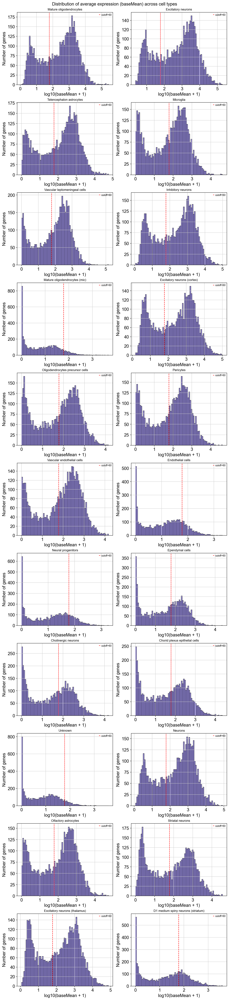

In [20]:
import matplotlib.pyplot as plt
import numpy as np

cutoff = 60
cells = list(results.keys())
n = len(cells)

# Choose grid layout
ncols = 2
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows), constrained_layout=True)

for ax, cell in zip(axes.flat, cells):
    df_hist = results[cell]['simple_effects'].get('60')
    if df_hist is None or 'baseMean' not in df_hist.columns:
        ax.set_visible(False)
        continue

    # Plot histogram
    ax.hist(np.log10(df_hist['baseMean'] + 1), bins=80, color='slateblue', edgecolor='black', alpha=0.7)
    ax.axvline(np.log10(cutoff), color='red', linestyle='--', lw=1.2, label=f'cutoff={cutoff}')
    ax.set_title(cell, fontsize=10)
    ax.set_xlabel('log10(baseMean + 1)')
    ax.set_ylabel('Number of genes')
    ax.legend(fontsize=8)

# Hide any unused axes
for i in range(len(cells), nrows * ncols):
    axes.flat[i].set_visible(False)

plt.suptitle("Distribution of average expression (baseMean) across cell types", fontsize=14)
plt.show()

2025-10-28 10:01:24 | [WARNING] Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.
2025-10-28 10:01:26 | [INFO] maxp pruned
2025-10-28 10:01:26 | [INFO] LTSH dropped
2025-10-28 10:01:26 | [INFO] cmap pruned
2025-10-28 10:01:26 | [INFO] kern dropped
2025-10-28 10:01:26 | [INFO] post pruned
2025-10-28 10:01:26 | [INFO] PCLT dropped
2025-10-28 10:01:26 | [INFO] JSTF dropped
2025-10-28 10:01:26 | [INFO] DSIG dropped
2025-10-28 10:01:26 | [INFO] GPOS pruned
2025-10-28 10:01:26 | [INFO] GSUB pruned
2025-10-28 10:01:26 | [INFO] glyf pruned
2025-10-28 10:01:26 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:26 | [INFO] Added gid0 to subset
2025-10-28 10:01:26 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:26 | [INFO] Closing glyph list over 'GSUB': 70 glyphs before
2025-10-28 10:01:26 | [INFO] Glyph names: ['.notdef', '.n

💾 Saved: ../results/figures/Mature_oligodendrocytes_21w_vs_60w.{png, svg, pdf}


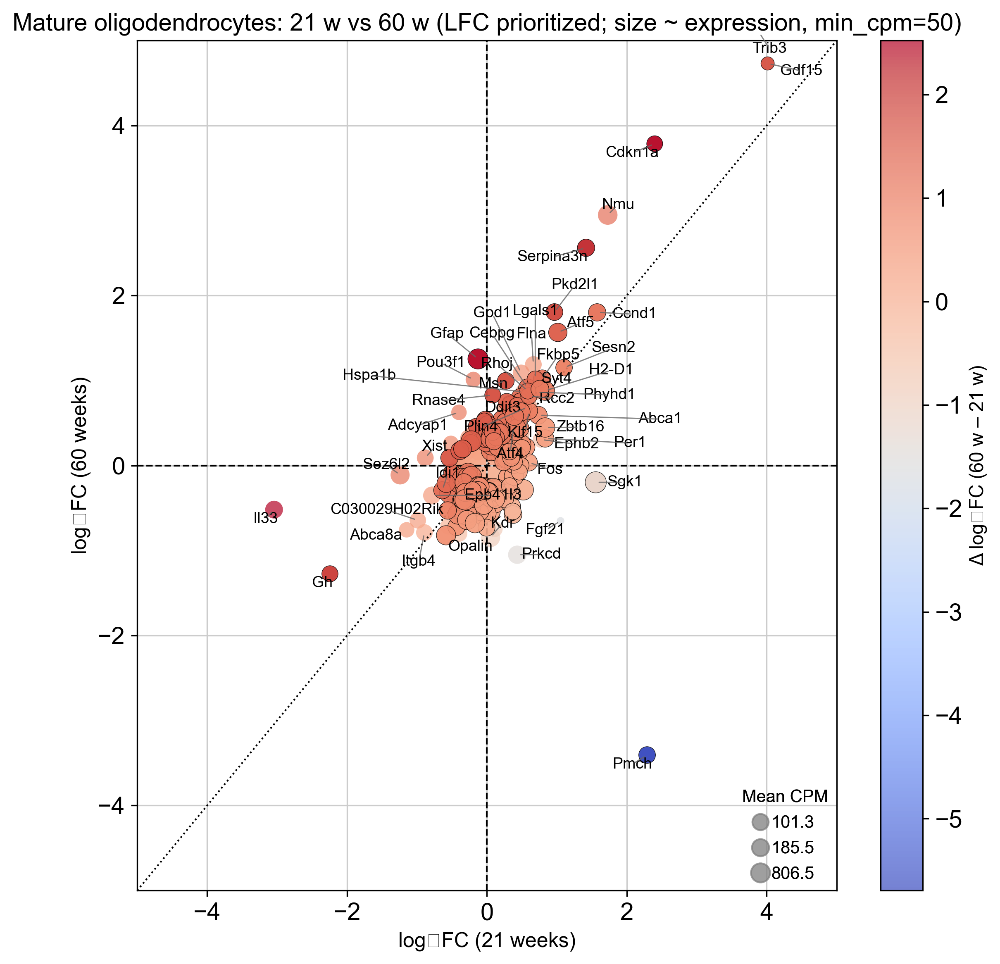

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Abca1,1385.648,0.734,0.518,1.419,0.156,1.000,181.867,1.0,137.824,225.910,165.622,198.111
Abca8a,641.448,-1.147,0.993,-1.155,0.248,1.000,58.603,1.0,77.323,39.884,74.368,42.838
Atf5,1946.011,1.014,0.690,1.469,0.142,1.000,274.071,1.0,151.888,396.255,233.967,314.176
C030029H02Rik,1544.828,-0.988,0.570,-1.732,0.083,1.000,116.433,1.0,149.823,83.043,180.403,52.463
Cdkn1a,300.632,2.398,1.017,2.357,0.018,1.000,52.241,1.0,10.018,94.465,36.529,67.953
Epb41l3,3654.460,-0.785,0.504,-1.556,0.120,1.000,311.145,1.0,374.301,247.990,426.858,195.432
Ephb2,650.923,0.772,0.651,1.187,0.235,1.000,107.249,1.0,87.511,126.988,78.032,136.466
Fgf21,4.115,1.052,1.031,1.020,0.308,1.000,0.470,1.0,0.431,0.510,0.489,0.452
Fkbp5,1091.824,0.791,0.308,2.565,0.010,1.000,143.926,1.0,97.925,189.927,129.033,158.819
Flna,997.920,0.664,0.342,1.939,0.053,1.000,138.303,1.0,91.242,185.364,119.168,157.438


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Atf5,2941.006,1.566,0.532,2.941,0.003,0.212,274.071,1.0,151.888,396.255,233.967,314.176
Ccnd1,1269.982,1.802,0.650,2.770,0.006,0.290,133.410,1.0,60.809,206.011,130.688,136.131
Cdkn1a,628.630,3.785,1.186,3.192,0.001,0.142,52.241,1.0,10.018,94.465,36.529,67.953
Cebpg,1936.309,0.913,0.298,3.065,0.002,0.170,178.622,1.0,128.445,228.798,151.148,206.095
Ddit3,1920.128,0.799,0.236,3.382,0.001,0.098,179.605,1.0,135.742,223.468,155.313,203.896
Fkbp5,1510.062,1.022,0.306,3.342,0.001,0.106,143.926,1.0,97.925,189.927,129.033,158.819
Flna,1465.044,1.189,0.625,1.901,0.057,0.748,138.303,1.0,91.242,185.364,119.168,157.438
Gdf15,107.994,4.730,1.450,3.263,0.001,0.128,11.420,1.0,1.050,21.789,11.603,11.236
Gfap,10401.411,1.254,0.277,4.535,0.000,0.006,1009.587,1.0,784.291,1234.883,908.238,1110.936
Gh,35.313,-1.274,0.638,-1.997,0.046,0.685,61.430,1.0,100.839,22.021,119.133,3.727


2025-10-28 10:01:28 | [INFO] maxp pruned
2025-10-28 10:01:28 | [INFO] LTSH dropped
2025-10-28 10:01:28 | [INFO] cmap pruned
2025-10-28 10:01:28 | [INFO] kern dropped
2025-10-28 10:01:28 | [INFO] post pruned
2025-10-28 10:01:28 | [INFO] PCLT dropped
2025-10-28 10:01:28 | [INFO] JSTF dropped
2025-10-28 10:01:28 | [INFO] DSIG dropped
2025-10-28 10:01:28 | [INFO] GPOS pruned
2025-10-28 10:01:28 | [INFO] GSUB pruned
2025-10-28 10:01:28 | [INFO] glyf pruned
2025-10-28 10:01:28 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:28 | [INFO] Added gid0 to subset
2025-10-28 10:01:28 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:28 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-28 10:01:28 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'I', 'L', 'M', 'N', 'P', 'S', 'T', 'U', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', '

💾 Saved: ../results/figures/Excitatory_neurons_21w_vs_60w.{png, svg, pdf}


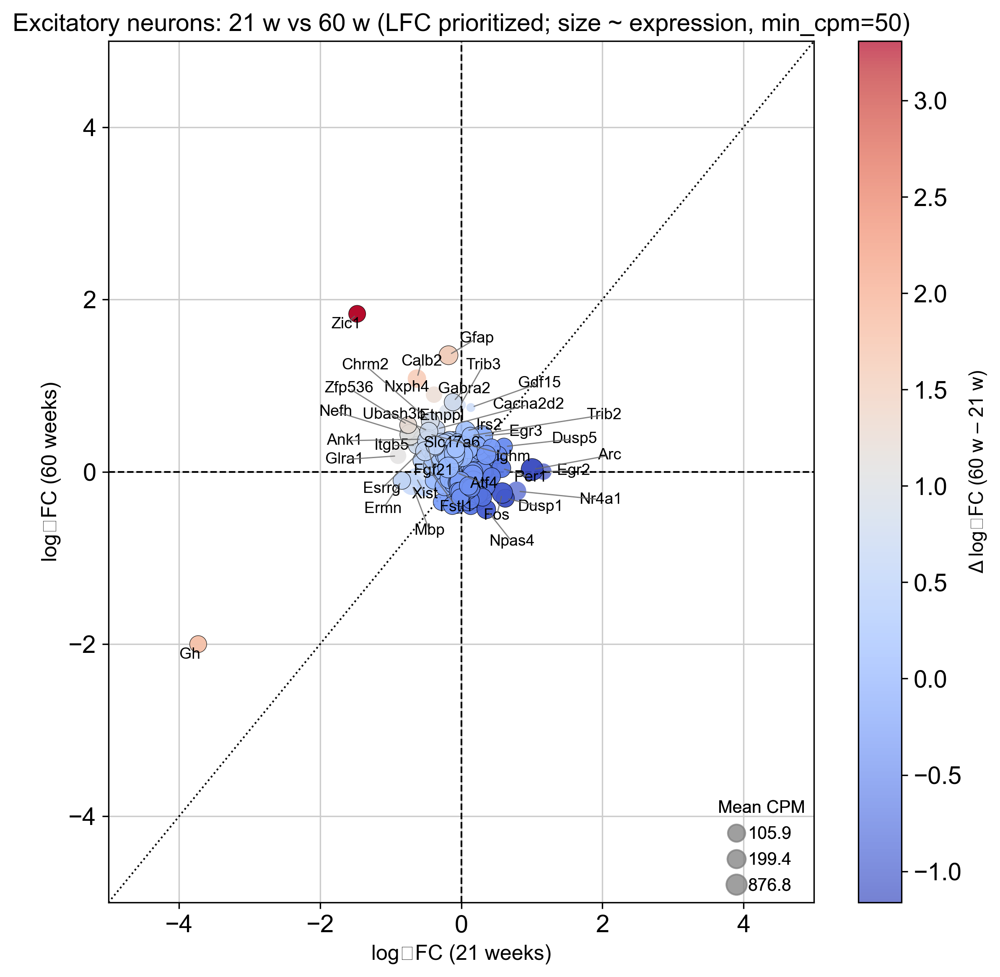

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Ank1,2049.544,-0.549,0.278,-1.971,0.049,1.0,125.196,1.0,128.627,121.765,124.332,126.059
Arc,12675.818,1.004,0.400,2.511,0.012,1.0,1494.279,1.0,1354.436,1634.122,766.589,2221.969
Calb2,4423.003,-0.628,0.542,-1.159,0.247,1.0,236.036,1.0,228.115,243.956,268.324,203.747
Dusp1,1048.591,0.624,0.269,2.315,0.021,1.0,106.906,1.0,107.991,105.820,63.461,150.350
Dusp5,722.920,0.605,0.228,2.648,0.008,1.0,60.611,1.0,52.050,69.172,43.775,77.447
Egr2,468.059,1.164,0.696,1.672,0.094,1.0,64.334,1.0,58.784,69.885,28.247,100.421
Ermn,1256.734,-0.842,0.285,-2.956,0.003,1.0,76.301,1.0,88.530,64.073,76.305,76.298
Esrrg,1264.176,-0.536,0.246,-2.179,0.029,1.0,74.265,1.0,77.891,70.639,76.658,71.871
Fos,4439.776,0.582,0.258,2.252,0.024,1.0,558.689,1.0,567.509,549.868,268.324,849.054
Fstl1,2521.293,-0.553,0.244,-2.271,0.023,1.0,143.098,1.0,154.454,131.743,152.793,133.404


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cacna2d2,1743.258,0.494,0.151,3.264,0.001,0.104,105.160,1.0,104.109,106.212,114.940,95.381
Calb2,3705.890,1.082,0.599,1.806,0.071,0.580,236.036,1.0,228.115,243.956,268.324,203.747
Chrm2,1653.549,0.585,0.132,4.424,0.000,0.005,94.188,1.0,92.318,96.059,97.770,90.607
Egr3,17790.818,0.415,0.127,3.275,0.001,0.103,883.219,1.0,770.863,995.575,792.395,974.042
Etnppl,1570.504,0.692,0.361,1.916,0.055,0.550,76.061,1.0,68.187,83.934,66.276,85.845
Gabra2,1351.974,0.809,0.082,9.803,0.000,0.000,73.088,1.0,64.255,81.921,72.133,74.043
Gdf15,15.900,0.746,0.626,1.192,0.233,NaN,0.903,1.0,0.776,1.031,0.932,0.874
Gfap,3910.211,1.353,0.205,6.592,0.000,0.000,184.180,1.0,142.384,225.975,154.024,214.335
Gh,15.006,-2.000,0.998,-2.003,0.045,NaN,54.456,1.0,101.289,7.623,108.084,0.829
Ighm,3013.643,0.441,0.715,0.617,0.537,0.926,134.522,1.0,130.390,138.655,104.727,164.318


2025-10-28 10:01:30 | [INFO] maxp pruned
2025-10-28 10:01:30 | [INFO] LTSH dropped
2025-10-28 10:01:30 | [INFO] cmap pruned
2025-10-28 10:01:30 | [INFO] kern dropped
2025-10-28 10:01:30 | [INFO] post pruned
2025-10-28 10:01:30 | [INFO] PCLT dropped
2025-10-28 10:01:30 | [INFO] JSTF dropped
2025-10-28 10:01:30 | [INFO] DSIG dropped
2025-10-28 10:01:30 | [INFO] GPOS pruned
2025-10-28 10:01:30 | [INFO] GSUB pruned
2025-10-28 10:01:30 | [INFO] glyf pruned
2025-10-28 10:01:30 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:30 | [INFO] Added gid0 to subset
2025-10-28 10:01:30 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:30 | [INFO] Closing glyph list over 'GSUB': 70 glyphs before
2025-10-28 10:01:30 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'J', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'fou

💾 Saved: ../results/figures/Telencephalon_astrocytes_21w_vs_60w.{png, svg, pdf}


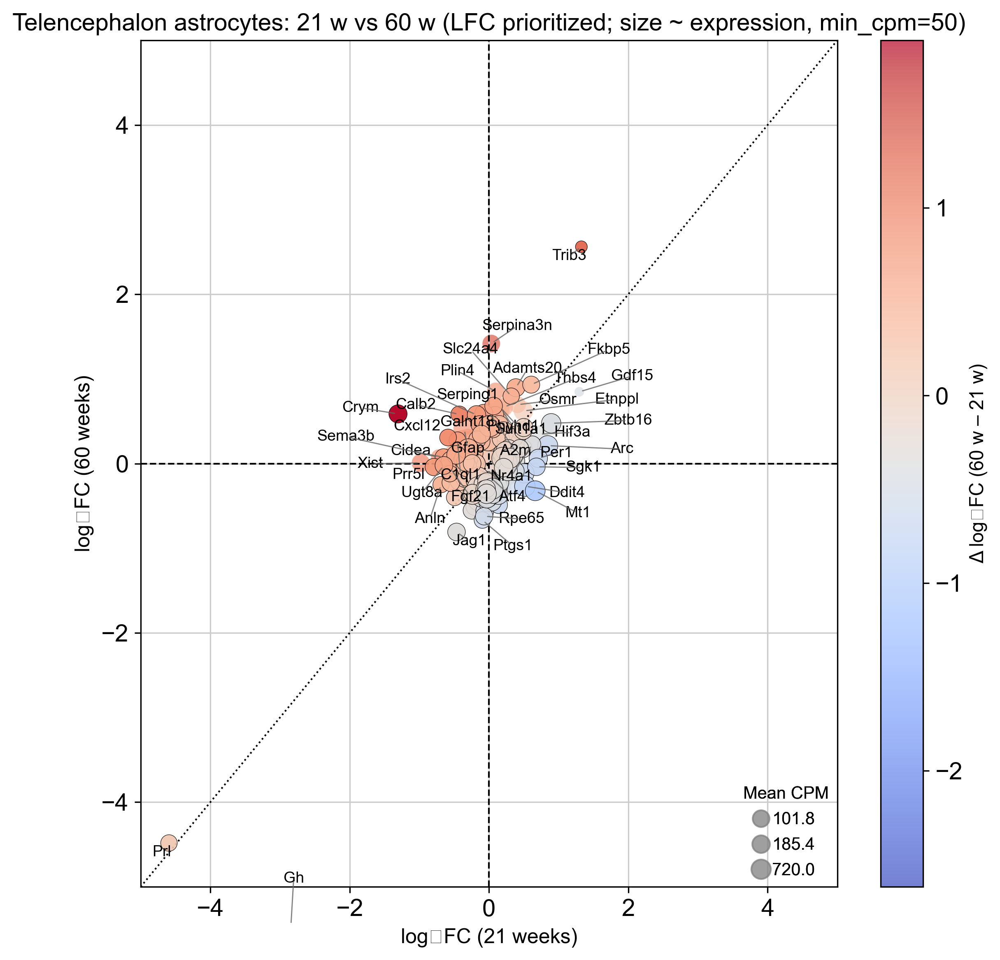

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Anln,227.026,-0.688,0.318,-2.160,0.031,1.000,50.002,1.000,59.249,40.755,68.367,31.637
Arc,901.275,0.844,0.412,2.045,0.041,1.000,571.608,1.000,500.454,642.761,272.296,870.919
Cidea,279.045,-0.653,0.256,-2.545,0.011,1.000,69.897,1.000,78.153,61.640,84.205,55.588
Crym,665.876,-1.306,0.851,-1.534,0.125,1.000,164.785,1.000,194.493,135.077,201.063,128.507
Cxcl12,210.164,-0.588,0.151,-3.895,0.000,0.083,67.280,1.000,69.817,64.742,63.376,71.183
Fkbp5,245.708,0.607,0.577,1.052,0.293,1.000,77.470,1.000,57.005,97.935,74.098,80.842
Gdf15,4.336,1.297,1.135,1.142,0.253,1.000,1.411,0.917,0.895,1.928,1.317,1.505
Gh,656.723,-2.843,1.691,-1.681,0.093,1.000,100.734,0.917,177.116,24.353,197.095,4.374
Hif3a,733.706,0.718,0.484,1.484,0.138,1.000,229.611,1.000,188.018,271.204,221.616,237.606
Mt1,1700.694,0.664,0.162,4.099,0.000,0.052,513.935,1.000,482.945,544.925,513.733,514.137


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
A2m,913.620,0.609,0.489,1.246,0.213,1.000,250.903,1.000,226.136,275.670,272.081,229.725
Adamts20,559.359,0.896,0.237,3.782,0.000,0.099,139.243,1.000,108.534,169.953,138.256,140.231
Etnppl,3579.542,0.622,0.479,1.299,0.194,1.000,812.005,1.000,653.869,970.141,727.242,896.768
Fkbp5,322.971,0.932,0.270,3.448,0.001,0.191,77.470,1.000,57.005,97.935,74.098,80.842
Galnt18,502.523,0.595,0.199,2.991,0.003,0.471,136.765,1.000,125.503,148.027,147.630,125.900
Gdf15,6.004,0.848,0.826,1.027,0.304,1.000,1.411,0.917,0.895,1.928,1.317,1.505
Gh,17.337,-5.461,1.707,-3.200,0.001,0.327,100.734,0.917,177.116,24.353,197.095,4.374
Jag1,353.633,-0.808,0.186,-4.350,0.000,0.018,111.522,1.000,134.145,88.900,134.426,88.619
Osmr,426.107,0.696,0.553,1.258,0.208,1.000,110.033,1.000,89.016,131.050,112.776,107.290
Phyhd1,411.847,0.637,0.547,1.165,0.244,1.000,100.986,1.000,86.498,115.474,98.861,103.112


2025-10-28 10:01:31 | [INFO] maxp pruned
2025-10-28 10:01:31 | [INFO] LTSH dropped
2025-10-28 10:01:31 | [INFO] cmap pruned
2025-10-28 10:01:31 | [INFO] kern dropped
2025-10-28 10:01:31 | [INFO] post pruned
2025-10-28 10:01:31 | [INFO] PCLT dropped
2025-10-28 10:01:31 | [INFO] JSTF dropped
2025-10-28 10:01:31 | [INFO] DSIG dropped
2025-10-28 10:01:31 | [INFO] GPOS pruned
2025-10-28 10:01:31 | [INFO] GSUB pruned
2025-10-28 10:01:31 | [INFO] glyf pruned
2025-10-28 10:01:31 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:31 | [INFO] Added gid0 to subset
2025-10-28 10:01:31 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:31 | [INFO] Closing glyph list over 'GSUB': 64 glyphs before
2025-10-28 10:01:31 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'F', 'G', 'H', 'K', 'L', 'M', 'N', 'P', 'S', 'T', 'V', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'hyphen', 'i', 'j', '

💾 Saved: ../results/figures/Microglia_21w_vs_60w.{png, svg, pdf}


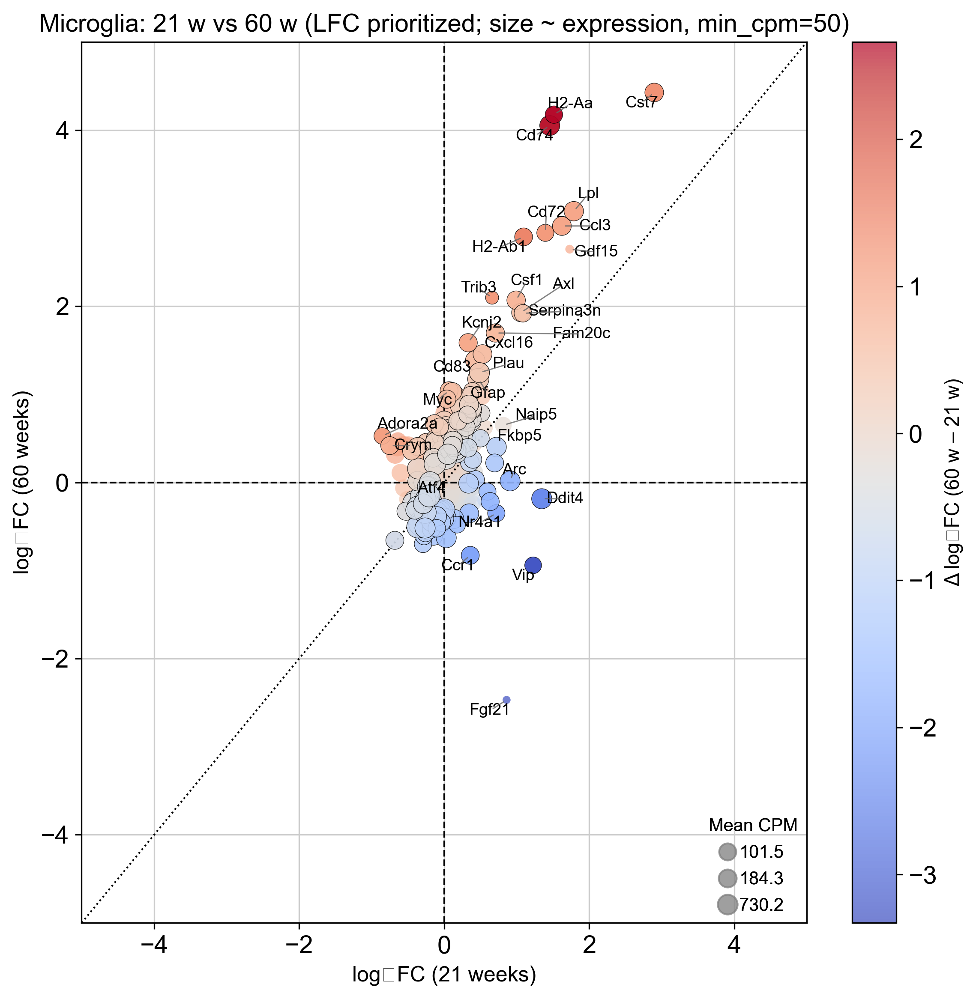

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adora2a,87.391,-0.854,0.361,-2.367,0.018,1.000,50.643,1.000,55.292,45.994,59.639,41.647
Arc,332.164,0.909,0.261,3.478,0.001,0.420,437.412,1.000,400.920,473.905,228.219,646.606
Axl,158.079,1.056,0.621,1.701,0.089,1.000,146.308,1.000,73.406,219.211,108.321,184.296
Ccl3,218.245,1.622,0.978,1.659,0.097,1.000,202.881,1.000,66.463,339.299,149.532,256.231
Cd72,70.250,1.394,0.983,1.418,0.156,1.000,65.296,1.000,23.332,107.260,48.127,82.466
Crym,192.173,-0.752,0.278,-2.702,0.007,1.000,116.525,1.000,125.481,107.570,131.186,101.865
Csf1,181.310,0.992,0.677,1.465,0.143,1.000,164.075,1.000,80.683,247.468,124.167,203.984
Cst7,135.383,2.896,1.086,2.666,0.008,1.000,185.679,1.000,23.343,348.015,92.955,278.404
Ddit4,627.402,1.344,0.221,6.089,0.000,0.000,491.392,1.000,414.670,568.114,431.714,551.070
Fam20c,159.743,0.705,0.304,2.319,0.020,1.000,144.543,1.000,83.796,205.289,109.385,179.700


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Axl,337.023,1.928,0.689,2.797,0.005,0.441,146.308,1.000,73.406,219.211,108.321,184.296
Ccl3,469.745,2.911,1.287,2.263,0.024,0.910,202.881,1.000,66.463,339.299,149.532,256.231
Cd72,151.105,2.833,1.025,2.763,0.006,0.474,65.296,1.000,23.332,107.260,48.127,82.466
Cd74,1206.373,4.051,1.160,3.492,0.000,0.242,448.250,1.000,100.903,795.596,238.628,657.871
Cd83,660.265,1.385,0.539,2.567,0.010,0.616,306.900,1.000,207.282,406.518,252.360,361.440
Csf1,373.231,2.068,0.826,2.504,0.012,0.710,164.075,1.000,80.683,247.468,124.167,203.984
Cst7,510.649,4.426,1.254,3.530,0.000,0.239,185.679,1.000,23.343,348.015,92.955,278.404
Cxcl16,457.586,1.457,0.631,2.308,0.021,0.877,209.351,1.000,135.516,283.185,168.298,250.403
Fam20c,328.596,1.696,0.693,2.448,0.014,0.772,144.543,1.000,83.796,205.289,109.385,179.700
Fgf21,0.995,-2.469,2.219,-1.113,0.266,0.999,0.324,0.417,0.447,0.202,0.100,0.548


2025-10-28 10:01:33 | [INFO] maxp pruned
2025-10-28 10:01:33 | [INFO] LTSH dropped
2025-10-28 10:01:33 | [INFO] cmap pruned
2025-10-28 10:01:33 | [INFO] kern dropped
2025-10-28 10:01:33 | [INFO] post pruned
2025-10-28 10:01:33 | [INFO] PCLT dropped
2025-10-28 10:01:33 | [INFO] JSTF dropped
2025-10-28 10:01:33 | [INFO] DSIG dropped
2025-10-28 10:01:33 | [INFO] GPOS pruned
2025-10-28 10:01:33 | [INFO] GSUB pruned
2025-10-28 10:01:33 | [INFO] glyf pruned
2025-10-28 10:01:33 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:33 | [INFO] Added gid0 to subset
2025-10-28 10:01:33 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:33 | [INFO] Closing glyph list over 'GSUB': 68 glyphs before
2025-10-28 10:01:33 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'V', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Vascular_leptomeningeal_cells_21w_vs_60w.{png, svg, pdf}


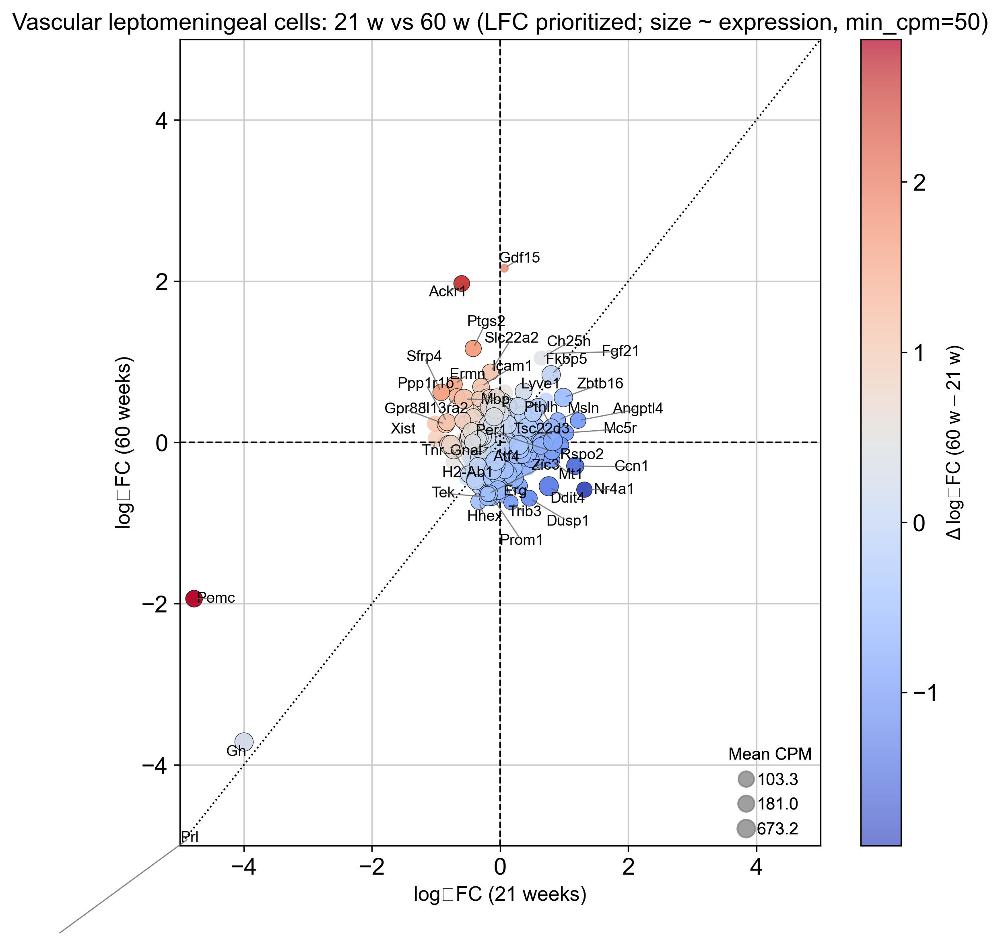

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Angptl4,164.703,1.217,0.393,3.096,0.002,0.427,69.604,1.000,50.984,88.224,78.393,60.814
Ccn1,399.064,1.171,0.304,3.849,0.000,0.077,230.660,1.000,208.508,252.812,189.418,271.902
Fgf21,0.174,0.777,4.430,0.175,0.861,1.000,0.088,0.167,0.000,0.175,0.083,0.092
Fkbp5,1267.278,0.796,0.531,1.499,0.134,1.000,603.973,1.000,437.645,770.301,602.244,605.702
Gh,2160.065,-3.997,1.596,-2.505,0.012,1.000,578.712,1.000,1087.340,70.085,1021.559,135.866
Gnal,267.994,-0.854,0.694,-1.231,0.218,1.000,116.143,1.000,134.630,97.656,127.713,104.572
Gpr88,468.172,-0.850,0.323,-2.633,0.008,0.903,204.837,1.000,229.758,179.916,222.602,187.072
H2-Ab1,1352.383,-0.799,0.303,-2.637,0.008,0.903,628.548,1.000,717.638,539.458,637.865,619.231
Mc5r,97.131,1.029,0.268,3.840,0.000,0.077,64.107,1.000,54.585,73.629,46.129,82.084
Msln,132.788,0.901,0.406,2.220,0.026,1.000,62.029,1.000,49.423,74.634,63.171,60.887


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Ackr1,290.897,1.971,0.994,1.982,0.047,0.999,83.567,1.000,49.655,117.479,38.590,128.544
Ch25h,230.692,1.046,0.594,1.762,0.078,0.999,69.612,1.000,48.062,91.162,36.948,102.276
Dusp1,242.445,-0.692,0.307,-2.249,0.025,0.999,88.832,1.000,96.181,81.483,69.256,108.408
Erg,105.752,-0.657,0.230,-2.850,0.004,0.563,50.534,1.000,55.369,45.699,53.868,47.200
Ermn,156.196,0.721,0.637,1.132,0.258,0.999,71.342,1.000,71.397,71.287,72.933,69.751
Fgf21,0.205,1.105,4.352,0.254,0.800,0.999,0.088,0.167,0.000,0.175,0.083,0.092
Fkbp5,1359.177,0.839,0.390,2.149,0.032,0.999,603.973,1.000,437.645,770.301,602.244,605.702
Gdf15,1.165,2.160,2.164,0.998,0.318,0.999,0.815,0.750,0.632,0.998,1.116,0.514
Gh,301.766,-3.715,1.591,-2.335,0.020,0.999,578.712,1.000,1087.340,70.085,1021.559,135.866
Hhex,147.117,-0.735,0.226,-3.246,0.001,0.368,69.902,1.000,82.547,57.258,74.026,65.779


2025-10-28 10:01:35 | [INFO] maxp pruned
2025-10-28 10:01:35 | [INFO] LTSH dropped
2025-10-28 10:01:35 | [INFO] cmap pruned
2025-10-28 10:01:35 | [INFO] kern dropped
2025-10-28 10:01:35 | [INFO] post pruned
2025-10-28 10:01:35 | [INFO] PCLT dropped
2025-10-28 10:01:35 | [INFO] JSTF dropped
2025-10-28 10:01:35 | [INFO] DSIG dropped
2025-10-28 10:01:35 | [INFO] GPOS pruned
2025-10-28 10:01:35 | [INFO] GSUB pruned
2025-10-28 10:01:35 | [INFO] glyf pruned
2025-10-28 10:01:35 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:35 | [INFO] Added gid0 to subset
2025-10-28 10:01:35 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:35 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-28 10:01:35 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'Delta', 'E', 'F', 'G', 'I', 'K', 'L', 'M', 'N', 'P', 'S', 'T', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', '

💾 Saved: ../results/figures/Inhibitory_neurons_21w_vs_60w.{png, svg, pdf}


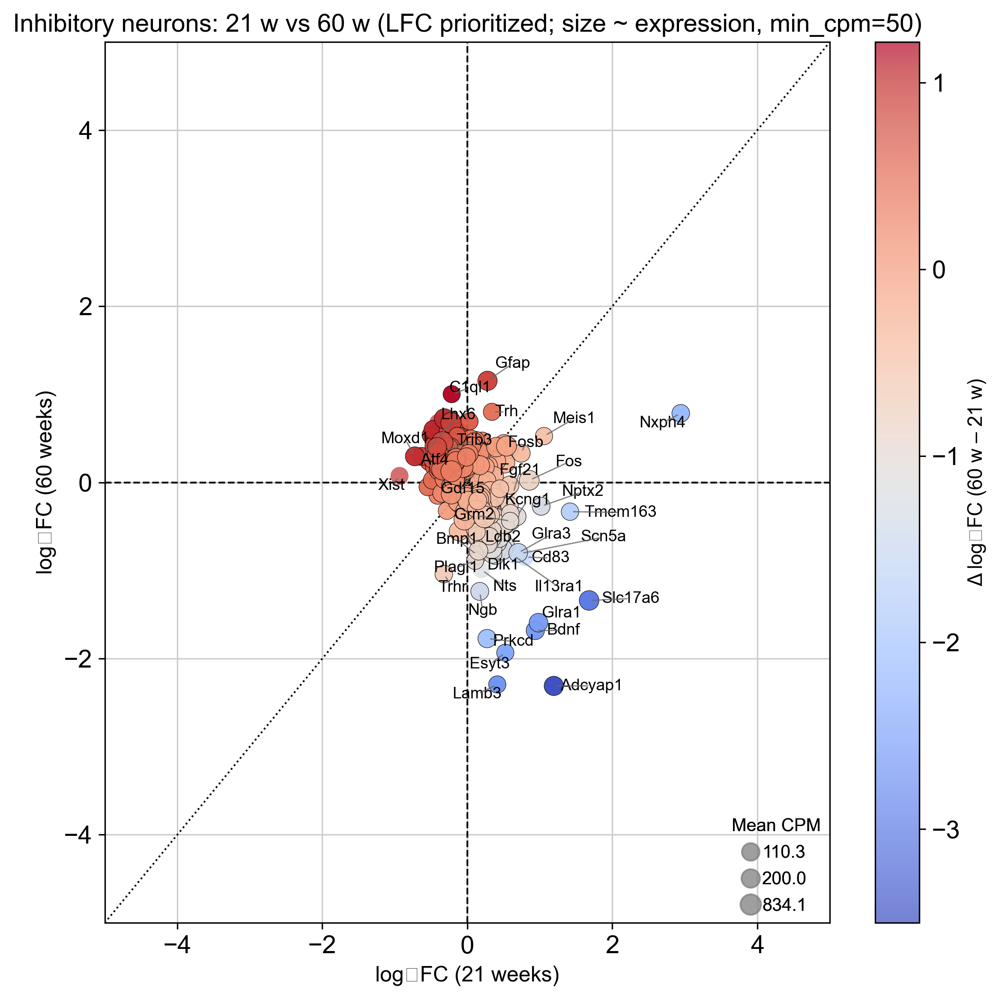

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcyap1,1603.018,1.192,1.043,1.143,0.253,0.999,198.639,1.000,220.856,176.423,206.307,190.971
Bdnf,788.565,0.937,0.689,1.361,0.174,0.999,107.457,1.000,120.852,94.061,101.635,113.279
Cd83,928.687,0.799,0.538,1.486,0.137,0.999,119.559,1.000,120.118,118.999,119.779,119.338
Fgf21,2.359,0.630,1.414,0.446,0.656,0.999,0.345,0.917,0.328,0.362,0.306,0.384
Fos,1323.054,0.854,0.210,4.059,0.000,0.017,280.217,1.000,253.526,306.909,170.873,389.562
Fosb,478.572,0.743,0.238,3.118,0.002,0.165,86.856,1.000,72.561,101.151,61.805,111.907
Glra1,1154.172,0.981,0.853,1.150,0.250,0.999,137.132,1.000,143.890,130.374,148.770,125.493
Glra3,1177.379,0.701,0.225,3.115,0.002,0.165,141.591,1.000,140.840,142.342,151.818,131.364
Grm2,628.304,0.604,0.221,2.738,0.006,0.324,79.957,1.000,77.265,82.648,81.007,78.906
Il13ra1,505.675,0.635,0.495,1.282,0.200,0.999,64.624,1.000,66.362,62.885,65.191,64.056


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcyap1,1430.949,-2.310,0.391,-5.915,0.000,0.000,198.639,1.0,220.856,176.423,206.307,190.971
Bdnf,850.303,-1.681,0.180,-9.357,0.000,0.000,107.457,1.0,120.852,94.061,101.635,113.279
Bmp1,897.912,-0.824,0.155,-5.302,0.000,0.000,122.594,1.0,136.039,109.148,125.573,119.615
C1ql1,449.695,1.002,0.170,5.899,0.000,0.000,57.979,1.0,50.164,65.793,56.062,59.896
Cd83,895.150,-0.848,0.476,-1.781,0.075,0.406,119.559,1.0,120.118,118.999,119.779,119.338
Dlk1,548.322,-0.832,0.415,-2.005,0.045,0.319,81.020,1.0,85.072,76.968,88.919,73.122
Esyt3,419.488,-1.933,0.642,-3.011,0.003,0.061,58.019,1.0,68.831,47.207,60.119,55.920
Gfap,1862.374,1.153,0.386,2.984,0.003,0.064,203.443,1.0,148.494,258.392,158.458,248.429
Glra1,941.246,-1.592,0.639,-2.490,0.013,0.165,137.132,1.0,143.890,130.374,148.770,125.493
Il13ra1,480.549,-0.828,0.473,-1.751,0.080,0.421,64.624,1.0,66.362,62.885,65.191,64.056


2025-10-28 10:01:37 | [INFO] maxp pruned
2025-10-28 10:01:37 | [INFO] LTSH dropped
2025-10-28 10:01:37 | [INFO] cmap pruned
2025-10-28 10:01:37 | [INFO] kern dropped
2025-10-28 10:01:37 | [INFO] post pruned
2025-10-28 10:01:37 | [INFO] PCLT dropped
2025-10-28 10:01:37 | [INFO] JSTF dropped
2025-10-28 10:01:37 | [INFO] DSIG dropped
2025-10-28 10:01:37 | [INFO] GPOS pruned
2025-10-28 10:01:37 | [INFO] GSUB pruned
2025-10-28 10:01:37 | [INFO] glyf pruned
2025-10-28 10:01:37 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:37 | [INFO] Added gid0 to subset
2025-10-28 10:01:37 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:37 | [INFO] Closing glyph list over 'GSUB': 69 glyphs before
2025-10-28 10:01:37 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'Delta', 'E', 'F', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'X', 'Y', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Mature_oligodendrocytes_(mic)_21w_vs_60w.{png, svg, pdf}


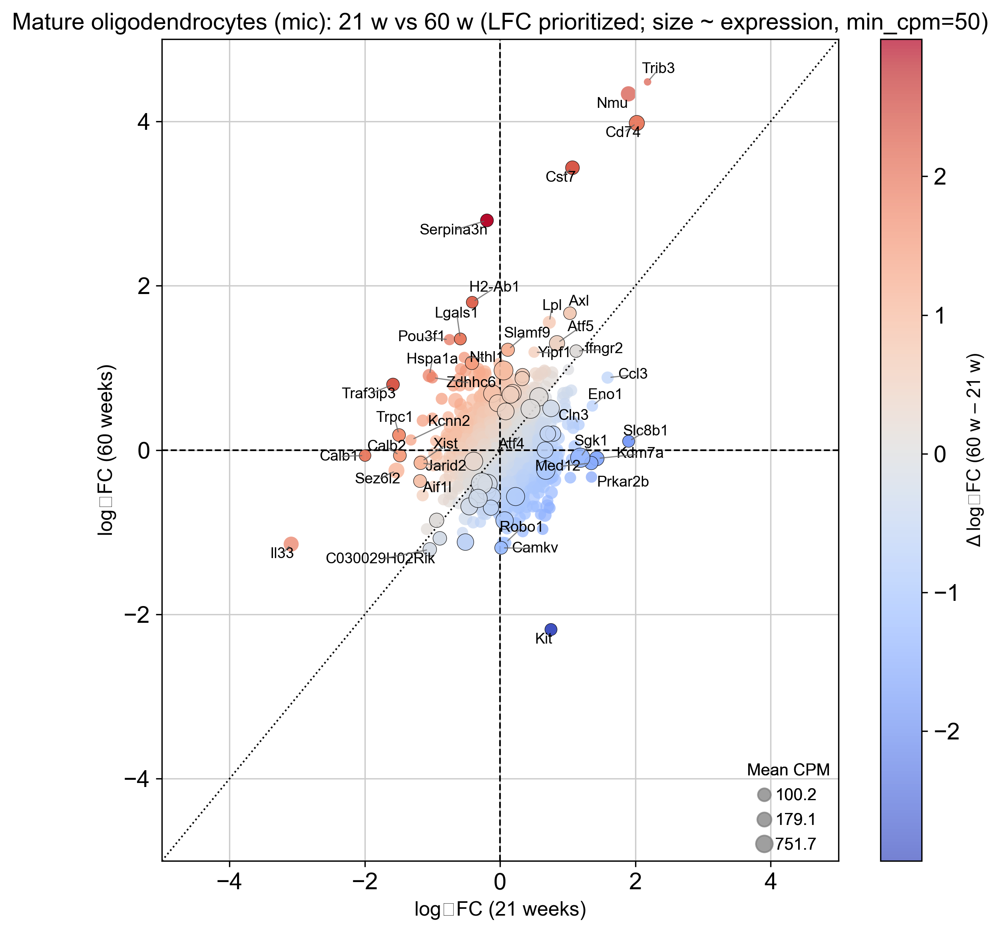

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Aif1l,10.941,-1.183,0.594,-1.992,0.046,1.0,81.441,1.000,101.409,61.473,91.189,71.693
Calb1,6.690,-1.996,0.820,-2.435,0.015,1.0,50.211,0.917,66.790,33.632,55.574,44.849
Calb2,11.801,-1.481,0.661,-2.242,0.025,1.0,79.554,1.000,102.863,56.246,96.825,62.283
Ccl3,6.217,1.590,1.840,0.864,0.388,1.0,77.182,0.833,47.726,106.639,53.550,100.814
Cd74,15.978,2.021,0.645,3.133,0.002,1.0,228.058,1.000,43.889,412.226,136.391,319.724
Cln3,6.496,1.165,0.725,1.608,0.108,1.0,53.599,1.000,38.826,68.372,54.899,52.299
Eno1,7.042,1.363,0.725,1.880,0.060,1.0,55.784,1.000,36.454,75.113,59.565,52.002
Jarid2,12.263,-1.175,0.565,-2.079,0.038,1.0,93.880,1.000,115.996,71.764,101.355,86.406
Kcnn2,6.932,-1.319,0.772,-1.708,0.088,1.0,50.964,1.000,63.663,38.266,57.424,44.505
Kdm7a,18.111,1.429,0.469,3.049,0.002,1.0,171.102,1.000,136.157,206.046,153.341,188.862


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Atf5,37.969,1.300,0.423,3.073,0.002,1.0,237.081,1.000,144.635,329.527,197.829,276.333
Axl,12.018,1.665,0.677,2.459,0.014,1.0,73.601,1.000,38.065,109.137,58.710,88.493
C030029H02Rik,6.753,-1.208,0.841,-1.436,0.151,1.0,106.620,0.917,142.857,70.383,165.476,47.764
Camkv,11.532,-1.190,0.586,-2.031,0.042,1.0,80.236,1.000,97.705,62.768,77.047,83.425
Cd74,42.971,3.980,1.165,3.416,0.001,1.0,228.058,1.000,43.889,412.226,136.391,319.724
Cst7,26.702,3.435,1.525,2.253,0.024,1.0,117.523,1.000,27.115,207.931,34.963,200.082
H2-Ab1,10.035,1.799,0.734,2.450,0.014,1.0,51.548,1.000,30.726,72.370,29.191,73.904
Ifngr2,11.885,1.204,0.576,2.089,0.037,1.0,70.799,1.000,41.185,100.413,54.489,87.108
Il33,9.775,-1.145,0.676,-1.693,0.090,1.0,294.186,1.000,509.190,79.182,518.545,69.828
Kit,5.170,-2.184,0.922,-2.369,0.018,1.0,58.933,1.000,59.176,58.691,80.431,37.436


2025-10-28 10:01:39 | [INFO] maxp pruned
2025-10-28 10:01:39 | [INFO] LTSH dropped
2025-10-28 10:01:39 | [INFO] cmap pruned
2025-10-28 10:01:39 | [INFO] kern dropped
2025-10-28 10:01:39 | [INFO] post pruned
2025-10-28 10:01:39 | [INFO] PCLT dropped
2025-10-28 10:01:39 | [INFO] JSTF dropped
2025-10-28 10:01:39 | [INFO] DSIG dropped
2025-10-28 10:01:39 | [INFO] GPOS pruned
2025-10-28 10:01:39 | [INFO] GSUB pruned
2025-10-28 10:01:39 | [INFO] glyf pruned
2025-10-28 10:01:39 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:39 | [INFO] Added gid0 to subset
2025-10-28 10:01:39 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:39 | [INFO] Closing glyph list over 'GSUB': 69 glyphs before
2025-10-28 10:01:39 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'W', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', '

💾 Saved: ../results/figures/Excitatory_neurons_(cortex)_21w_vs_60w.{png, svg, pdf}


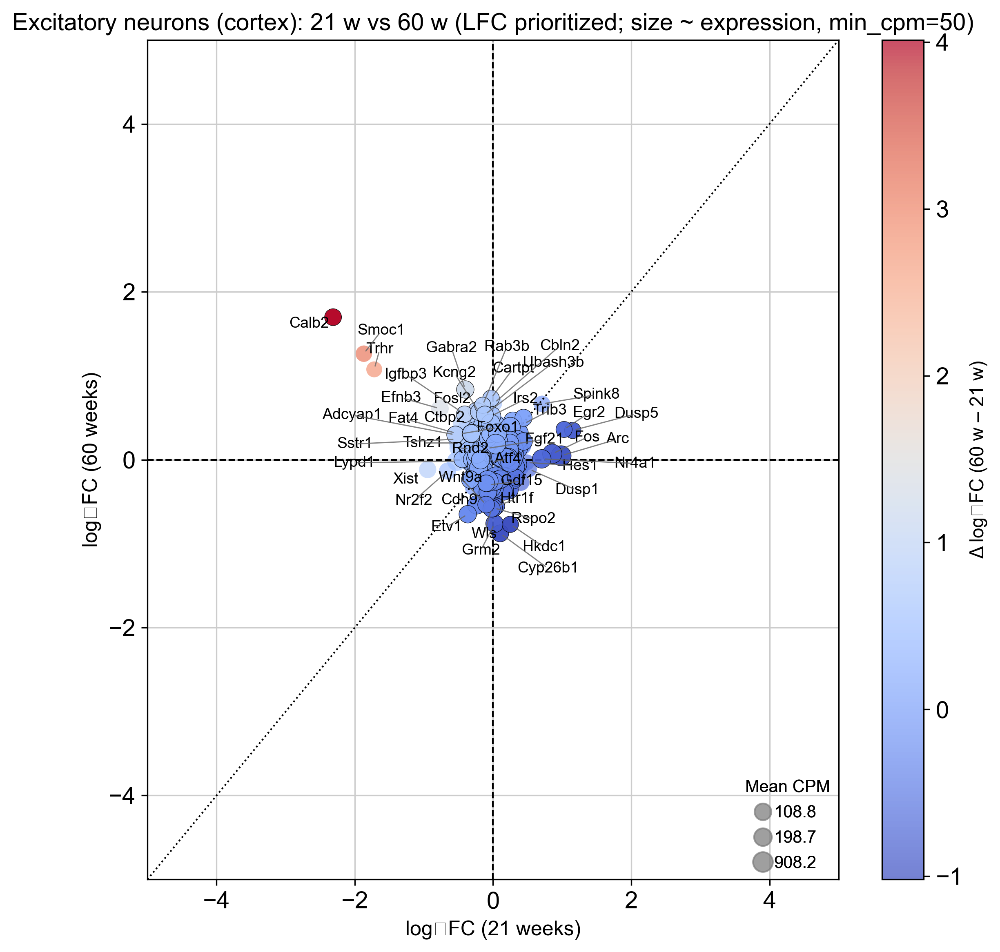

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcyap1,1013.883,-0.544,0.186,-2.929,0.003,0.904,101.192,1.0,106.414,95.969,105.478,96.905
Arc,3706.032,0.985,0.338,2.916,0.004,0.904,591.406,1.0,524.761,658.051,384.786,798.026
Calb2,816.862,-2.314,1.151,-2.010,0.044,1.000,77.816,1.0,88.358,67.274,86.071,69.561
Dusp1,480.412,0.520,0.289,1.795,0.073,1.000,68.242,1.0,65.800,70.685,49.941,86.543
Dusp5,391.266,1.153,0.359,3.209,0.001,0.565,56.905,1.0,45.219,68.591,40.642,73.168
Efnb3,2077.153,-0.768,0.588,-1.306,0.192,1.000,197.407,1.0,207.833,186.980,216.886,177.927
Egr2,294.356,1.028,0.308,3.338,0.001,0.493,50.130,1.0,40.707,59.553,30.552,69.708
Fat4,984.943,-0.530,0.339,-1.562,0.118,1.000,100.396,1.0,104.772,96.020,102.707,98.086
Fos,2040.789,0.857,0.339,2.530,0.011,1.000,352.269,1.0,317.221,387.317,211.989,492.548
Foxo1,830.269,-0.494,0.366,-1.350,0.177,1.000,84.243,1.0,87.616,80.871,86.650,81.837


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cartpt,628.857,0.730,0.238,3.069,0.002,0.405,70.803,1.0,62.926,78.680,72.654,68.951
Cbln2,672.165,0.674,0.526,1.280,0.201,1.000,74.281,1.0,65.819,82.743,74.694,73.868
Cdh9,1820.652,-0.537,0.213,-2.529,0.011,0.726,212.171,1.0,240.640,183.702,223.053,201.288
Cyp26b1,841.336,-0.878,0.258,-3.403,0.001,0.236,84.732,1.0,97.428,72.036,76.519,92.945
Efnb3,1612.265,0.609,0.693,0.879,0.379,1.000,197.407,1.0,207.833,186.980,216.886,177.927
Etv1,1023.607,-0.649,0.245,-2.648,0.008,0.703,112.390,1.0,132.261,92.519,111.764,113.016
Fosl2,864.147,0.584,0.159,3.668,0.000,0.150,76.930,1.0,70.146,83.714,58.908,94.952
Gabra2,1044.912,0.837,0.220,3.796,0.000,0.125,108.842,1.0,100.066,117.617,102.694,114.989
Grm2,1159.351,-0.762,0.162,-4.696,0.000,0.003,128.835,1.0,144.896,112.773,129.754,127.915
Hkdc1,483.726,-0.770,0.139,-5.545,0.000,0.000,55.938,1.0,60.513,51.363,58.515,53.361


2025-10-28 10:01:41 | [INFO] maxp pruned
2025-10-28 10:01:41 | [INFO] LTSH dropped
2025-10-28 10:01:41 | [INFO] cmap pruned
2025-10-28 10:01:41 | [INFO] kern dropped
2025-10-28 10:01:41 | [INFO] post pruned
2025-10-28 10:01:41 | [INFO] PCLT dropped
2025-10-28 10:01:41 | [INFO] JSTF dropped
2025-10-28 10:01:41 | [INFO] DSIG dropped
2025-10-28 10:01:41 | [INFO] GPOS pruned
2025-10-28 10:01:41 | [INFO] GSUB pruned
2025-10-28 10:01:41 | [INFO] glyf pruned
2025-10-28 10:01:41 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:41 | [INFO] Added gid0 to subset
2025-10-28 10:01:41 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:41 | [INFO] Closing glyph list over 'GSUB': 69 glyphs before
2025-10-28 10:01:41 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'V', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', '

💾 Saved: ../results/figures/Oligodendrocytes_precursor_cells_21w_vs_60w.{png, svg, pdf}


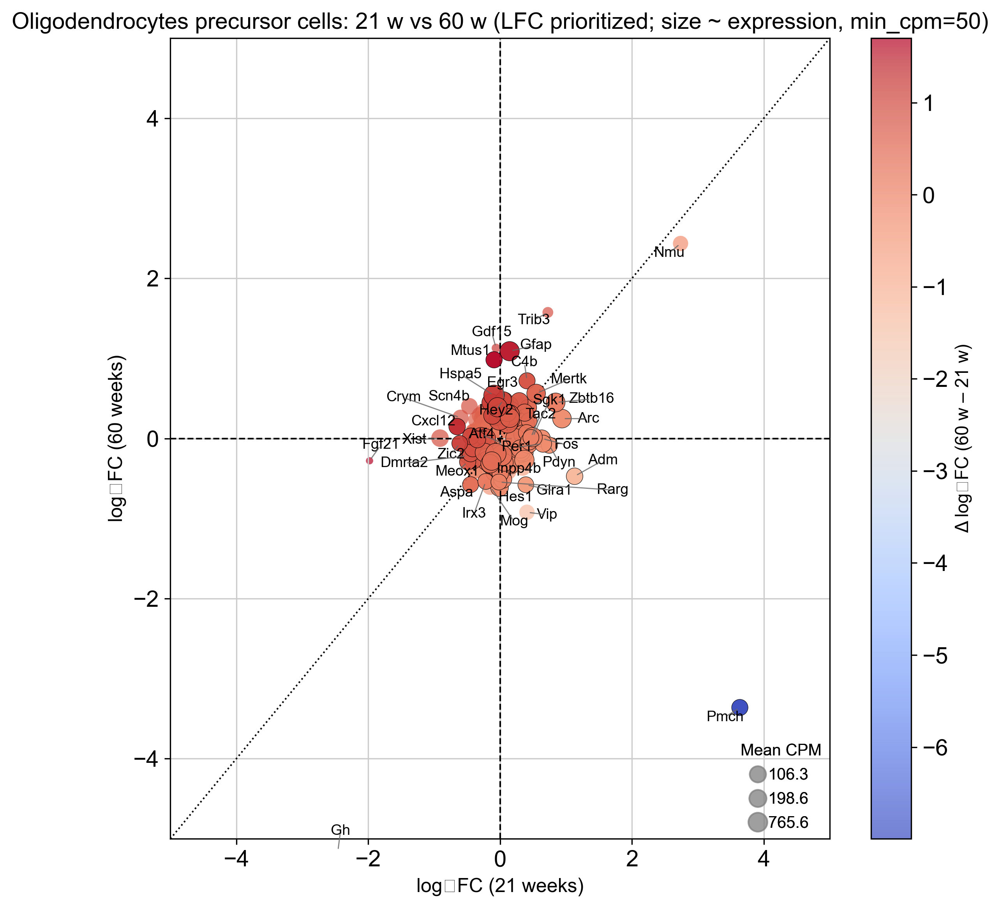

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adm,114.795,1.130,0.225,5.016,0.000,0.001,80.886,1.000,74.240,87.533,73.386,88.386
Arc,286.422,0.938,0.345,2.719,0.007,1.000,334.932,1.000,285.861,384.004,183.039,486.826
Crym,171.159,-0.600,0.415,-1.446,0.148,1.000,101.273,1.000,108.224,94.323,109.158,93.389
Cxcl12,128.129,-0.651,0.195,-3.347,0.001,0.584,81.232,1.000,88.554,73.910,81.798,80.666
Dmrta2,81.085,-0.492,0.238,-2.068,0.039,1.000,53.232,1.000,59.614,46.849,51.785,54.679
Fgf21,0.369,-1.980,3.762,-0.526,0.599,1.000,0.234,0.250,0.347,0.120,0.234,0.233
Fos,115.012,0.631,0.260,2.427,0.015,1.000,125.334,1.000,117.474,133.194,73.453,177.216
Gh,179.005,-2.461,1.512,-1.628,0.104,1.000,59.116,0.750,100.512,17.719,114.537,3.694
Meox1,117.895,-0.492,0.243,-2.024,0.043,1.000,69.025,1.000,78.486,59.564,75.252,62.797
Mertk,444.300,0.546,0.132,4.141,0.000,0.029,327.727,1.000,265.569,389.885,283.971,371.483


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adm,141.112,-0.472,0.199,-2.366,0.018,1.000,80.886,1.000,74.240,87.533,73.386,88.386
Aspa,91.082,-0.577,0.242,-2.385,0.017,1.000,57.170,1.000,67.435,46.905,57.335,57.005
C4b,110.161,0.720,0.237,3.038,0.002,1.000,65.369,1.000,52.448,78.290,61.689,69.048
Egr3,297.725,0.469,0.146,3.210,0.001,0.742,177.514,1.000,160.761,194.268,168.761,186.267
Gdf15,1.151,1.129,1.806,0.625,0.532,1.000,1.107,0.833,1.000,1.214,1.496,0.718
Gfap,1030.120,1.090,0.365,2.983,0.003,1.000,550.098,1.000,421.688,678.508,454.445,645.751
Gh,5.859,-5.161,2.682,-1.924,0.054,1.000,59.116,0.750,100.512,17.719,114.537,3.694
Glra1,73.141,-0.578,0.265,-2.180,0.029,1.000,50.897,1.000,51.896,49.898,56.010,45.784
Hes1,261.210,-0.614,0.161,-3.804,0.000,0.143,168.905,1.000,186.200,151.610,174.158,163.652
Hey2,108.313,0.483,0.193,2.501,0.012,1.000,64.955,1.000,58.811,71.100,62.143,67.768


2025-10-28 10:01:43 | [INFO] maxp pruned
2025-10-28 10:01:43 | [INFO] LTSH dropped
2025-10-28 10:01:43 | [INFO] cmap pruned
2025-10-28 10:01:43 | [INFO] kern dropped
2025-10-28 10:01:43 | [INFO] post pruned
2025-10-28 10:01:43 | [INFO] PCLT dropped
2025-10-28 10:01:43 | [INFO] JSTF dropped
2025-10-28 10:01:43 | [INFO] DSIG dropped
2025-10-28 10:01:43 | [INFO] GPOS pruned
2025-10-28 10:01:43 | [INFO] GSUB pruned
2025-10-28 10:01:43 | [INFO] glyf pruned
2025-10-28 10:01:43 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:43 | [INFO] Added gid0 to subset
2025-10-28 10:01:43 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:43 | [INFO] Closing glyph list over 'GSUB': 68 glyphs before
2025-10-28 10:01:43 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'V', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Pericytes_21w_vs_60w.{png, svg, pdf}


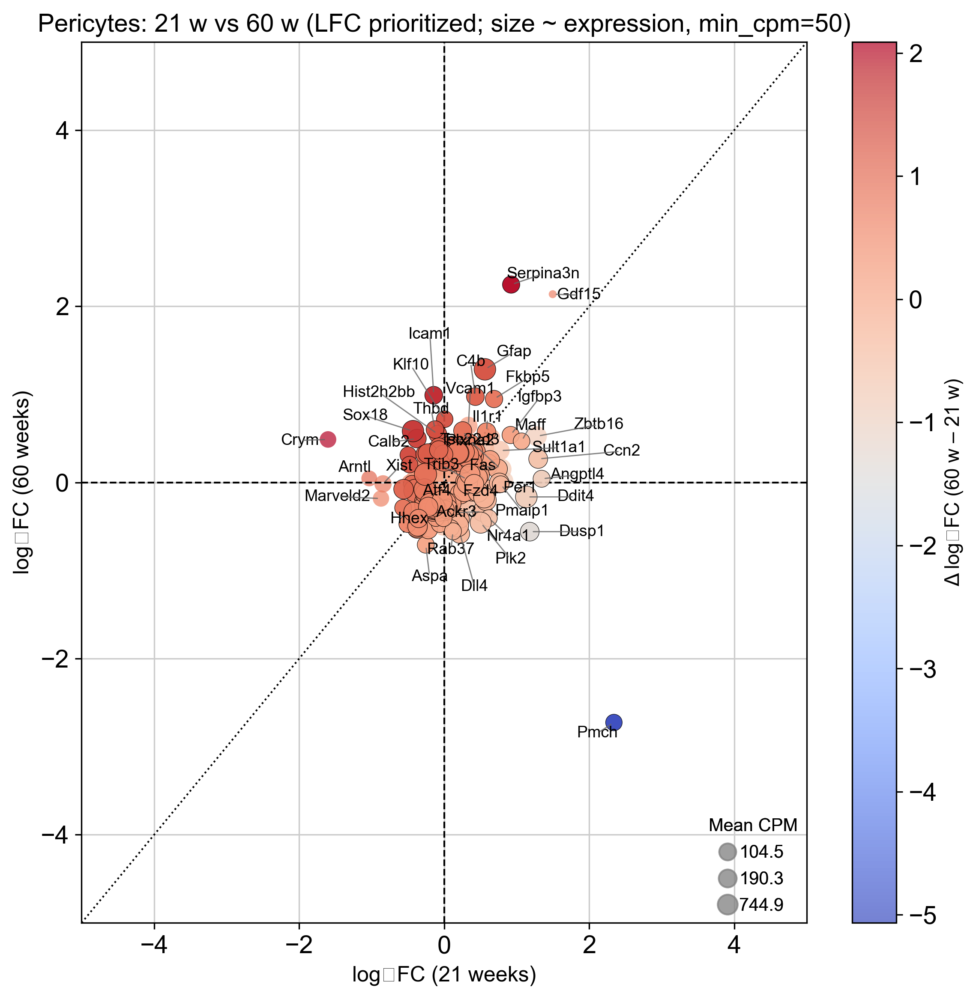

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Angptl4,154.650,1.343,0.257,5.233,0.000,0.000,69.000,1.000,51.288,86.712,80.151,57.850
Arntl,122.603,-1.034,0.646,-1.601,0.109,1.000,53.035,1.000,63.730,42.339,63.672,42.398
Ccn2,438.342,1.296,0.411,3.153,0.002,0.449,213.607,1.000,156.764,270.450,227.617,199.597
Crym,196.675,-1.602,0.928,-1.727,0.084,1.000,81.867,1.000,102.641,61.093,102.383,61.351
Ddit4,2268.084,1.132,0.143,7.922,0.000,0.000,1358.254,1.000,1183.380,1533.127,1177.095,1539.412
Dusp1,253.203,1.179,0.199,5.932,0.000,0.000,198.836,1.000,198.892,198.779,131.327,266.344
Fas,560.232,0.737,0.191,3.853,0.000,0.065,312.944,1.000,267.981,357.906,290.695,335.192
Fzd4,659.318,0.759,0.181,4.187,0.000,0.024,390.247,1.000,347.132,433.362,342.115,438.378
Gdf15,2.118,1.496,1.516,0.987,0.324,1.000,0.781,0.583,0.376,1.185,1.102,0.460
Igfbp3,163.201,0.916,0.208,4.406,0.000,0.013,77.766,1.000,58.357,97.174,84.656,70.875


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Aspa,152.395,-0.707,0.258,-2.744,0.006,0.936,66.932,1.000,78.120,55.744,66.965,66.899
C4b,274.249,0.974,0.478,2.038,0.042,1.000,107.323,1.000,80.847,133.798,94.368,120.277
Dll4,574.024,-0.582,0.150,-3.891,0.000,0.081,266.100,1.000,280.827,251.372,280.485,251.715
Dusp1,607.588,-0.559,0.385,-1.451,0.147,1.000,198.836,1.000,198.892,198.779,131.327,266.344
Fkbp5,210.880,0.947,0.231,4.105,0.000,0.041,86.901,1.000,62.892,110.909,81.533,92.268
Gdf15,1.056,2.137,2.226,0.960,0.337,1.000,0.781,0.583,0.376,1.185,1.102,0.460
Gfap,3484.621,1.284,0.494,2.596,0.009,1.000,1346.961,1.000,915.731,1778.192,1164.235,1529.688
Hhex,378.022,-0.535,0.144,-3.702,0.000,0.113,178.093,1.000,200.462,155.724,190.438,165.748
Hist2h2bb,221.974,0.548,0.176,3.110,0.002,0.552,114.143,1.000,107.146,121.139,130.950,97.335
Icam1,272.216,0.989,0.406,2.436,0.015,1.000,113.843,1.000,96.645,131.041,107.963,119.724


2025-10-28 10:01:45 | [INFO] maxp pruned
2025-10-28 10:01:45 | [INFO] LTSH dropped
2025-10-28 10:01:45 | [INFO] cmap pruned
2025-10-28 10:01:45 | [INFO] kern dropped
2025-10-28 10:01:45 | [INFO] post pruned
2025-10-28 10:01:45 | [INFO] PCLT dropped
2025-10-28 10:01:45 | [INFO] JSTF dropped
2025-10-28 10:01:45 | [INFO] DSIG dropped
2025-10-28 10:01:45 | [INFO] GPOS pruned
2025-10-28 10:01:45 | [INFO] GSUB pruned
2025-10-28 10:01:45 | [INFO] glyf pruned
2025-10-28 10:01:45 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:45 | [INFO] Added gid0 to subset
2025-10-28 10:01:45 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:45 | [INFO] Closing glyph list over 'GSUB': 67 glyphs before
2025-10-28 10:01:45 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'V', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', '

💾 Saved: ../results/figures/Vascular_endothelial_cells_21w_vs_60w.{png, svg, pdf}


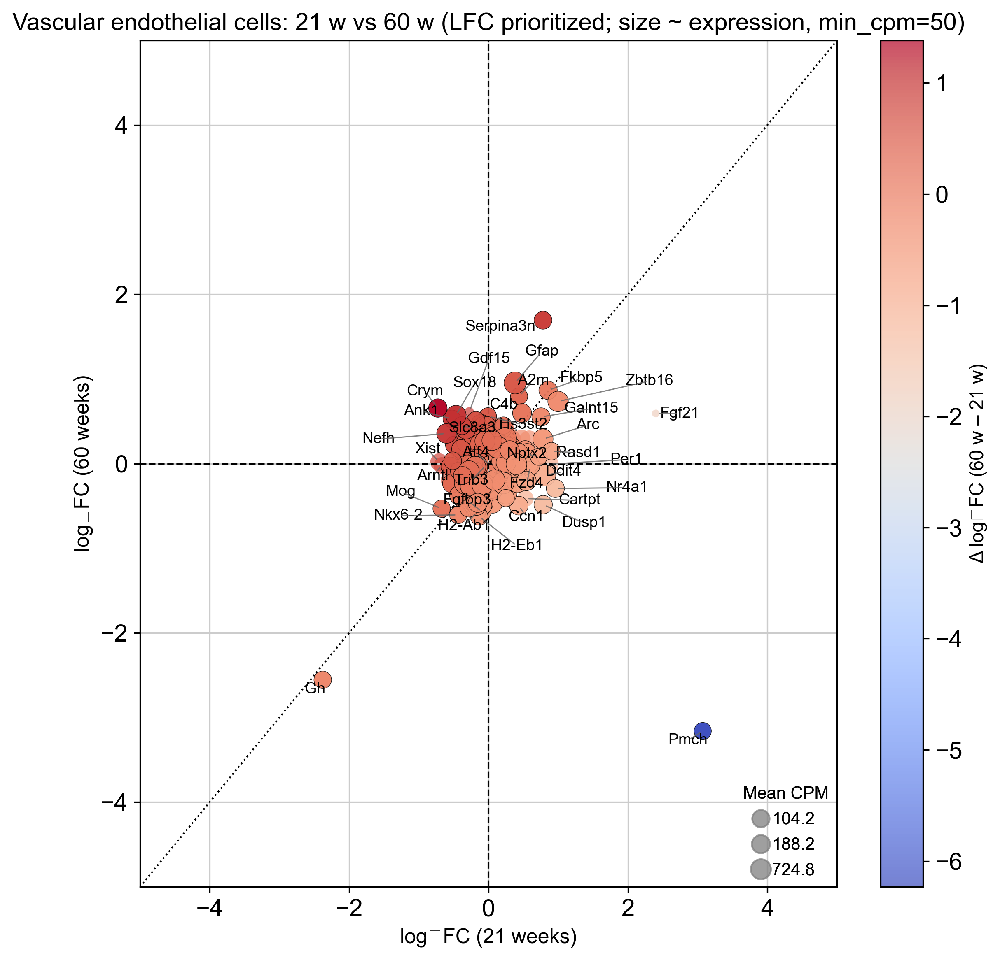

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Arc,378.081,0.781,0.201,3.885,0.000,0.057,417.810,1.000,358.643,476.977,203.100,632.519
Arntl,131.536,-0.670,0.624,-1.074,0.283,1.000,62.707,1.000,70.847,54.568,70.404,55.011
Crym,304.600,-0.727,0.693,-1.049,0.294,1.000,135.527,1.000,143.703,127.350,163.524,107.529
Ddit4,1374.166,0.812,0.113,7.180,0.000,0.000,835.103,1.000,754.224,915.983,738.032,932.175
Dusp1,168.567,0.784,0.217,3.613,0.000,0.108,123.461,1.000,124.083,122.839,90.442,156.480
Fgf21,0.497,2.399,3.390,0.708,0.479,1.000,0.181,0.250,0.000,0.362,0.266,0.096
Fkbp5,205.377,0.855,0.452,1.891,0.059,1.000,121.050,1.000,85.692,156.409,110.289,131.811
Fzd4,250.123,0.602,0.164,3.661,0.000,0.105,146.931,1.000,133.412,160.451,134.267,159.595
Galnt15,223.913,0.754,0.192,3.926,0.000,0.055,120.748,1.000,93.629,147.866,120.258,121.237
Gh,266.849,-2.378,1.652,-1.439,0.150,1.000,72.529,0.917,121.425,23.634,142.765,2.294


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
A2m,130.483,0.794,0.316,2.513,0.012,1.000,57.696,1.000,44.873,70.518,48.592,66.800
Ank1,164.444,0.528,0.167,3.169,0.002,0.479,77.227,1.000,75.943,78.511,70.375,84.079
C4b,390.712,0.596,0.221,2.704,0.007,1.000,186.550,1.000,151.299,221.801,173.073,200.027
Crym,210.406,0.656,0.229,2.863,0.004,0.975,135.527,1.000,143.703,127.350,163.524,107.529
Fgf21,0.187,0.592,4.429,0.134,0.894,1.000,0.181,0.250,0.000,0.362,0.266,0.096
Fgfbp3,142.092,-0.572,0.187,-3.060,0.002,0.653,77.102,1.000,85.325,68.878,81.584,72.619
Fkbp5,257.785,0.865,0.422,2.049,0.040,1.000,121.050,1.000,85.692,156.409,110.289,131.811
Galnt15,236.993,0.551,0.232,2.376,0.018,1.000,120.748,1.000,93.629,147.866,120.258,121.237
Gdf15,1.495,0.613,1.555,0.394,0.693,1.000,0.853,0.833,0.813,0.893,0.940,0.765
Gfap,3520.427,0.953,0.428,2.228,0.026,1.000,1589.421,1.000,1206.870,1971.972,1375.831,1803.011


2025-10-28 10:01:47 | [INFO] maxp pruned
2025-10-28 10:01:47 | [INFO] LTSH dropped
2025-10-28 10:01:47 | [INFO] cmap pruned
2025-10-28 10:01:47 | [INFO] kern dropped
2025-10-28 10:01:47 | [INFO] post pruned
2025-10-28 10:01:47 | [INFO] PCLT dropped
2025-10-28 10:01:47 | [INFO] JSTF dropped
2025-10-28 10:01:47 | [INFO] DSIG dropped
2025-10-28 10:01:47 | [INFO] GPOS pruned
2025-10-28 10:01:47 | [INFO] GSUB pruned
2025-10-28 10:01:47 | [INFO] glyf pruned
2025-10-28 10:01:47 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:47 | [INFO] Added gid0 to subset
2025-10-28 10:01:47 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:47 | [INFO] Closing glyph list over 'GSUB': 65 glyphs before
2025-10-28 10:01:47 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'hyphen', '

💾 Saved: ../results/figures/Endothelial_cells_21w_vs_60w.{png, svg, pdf}


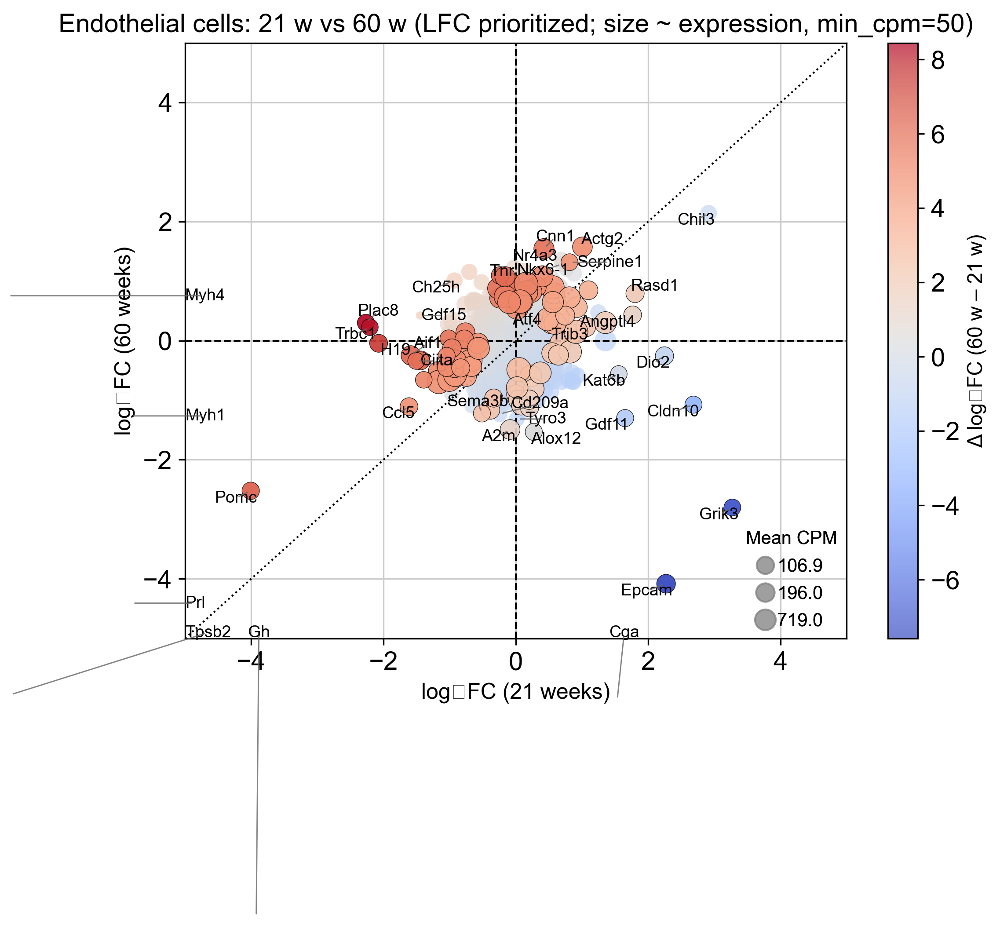

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Aif1,53.187,-1.587,0.476,-3.334,0.001,0.445,211.796,1.000,275.671,147.921,206.428,217.165
Angptl4,25.661,1.765,0.517,3.414,0.001,0.375,90.384,1.000,58.335,122.433,99.512,81.255
Ccl5,24.766,-1.614,0.644,-2.508,0.012,0.999,90.448,1.000,130.071,50.824,96.060,84.836
Cga,57.913,1.531,3.063,0.500,0.617,0.999,125.959,0.500,83.894,168.024,225.914,26.004
Chil3,34.843,2.912,2.585,1.127,0.260,0.999,76.439,0.667,19.818,133.059,133.821,19.056
Ciita,15.270,-1.504,0.609,-2.472,0.013,0.999,61.849,1.000,80.844,42.854,59.192,64.506
Cldn10,21.144,2.684,0.864,3.106,0.002,0.631,64.934,1.000,42.953,86.914,82.303,47.564
Dio2,35.377,2.246,0.725,3.096,0.002,0.631,114.437,1.000,73.649,155.226,137.696,91.179
Gdf11,21.351,1.651,0.689,2.397,0.017,0.999,66.899,1.000,56.695,77.103,82.878,50.919
Gdf15,0.709,-1.449,2.401,-0.603,0.546,0.999,2.421,0.583,3.274,1.568,2.760,2.081


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
A2m,42.506,-1.492,0.541,-2.758,0.006,1.0,248.833,1.000,308.433,189.234,288.531,209.135
Actg2,67.082,1.575,0.505,3.116,0.002,1.0,257.314,1.000,146.272,368.357,195.544,319.085
Alox12,9.224,-1.532,0.676,-2.266,0.023,1.0,66.037,1.000,74.685,57.389,86.832,45.242
Cd209a,14.444,-1.234,0.631,-1.954,0.051,1.0,54.938,1.000,71.794,38.082,39.758,70.117
Cga,5.405,-6.046,4.220,-1.433,0.152,1.0,125.959,0.500,83.894,168.024,225.914,26.004
Chil3,4.024,2.141,1.367,1.566,0.117,1.0,76.439,0.667,19.818,133.059,133.821,19.056
Cnn1,77.336,1.546,0.555,2.785,0.005,1.0,306.640,1.000,200.255,413.024,246.936,366.343
Epcam,14.129,-4.083,1.919,-2.127,0.033,1.0,147.734,0.833,103.291,192.176,227.500,67.968
Gdf11,10.469,-1.301,0.606,-2.146,0.032,1.0,66.899,1.000,56.695,77.103,82.878,50.919
Grik3,4.025,-2.802,1.127,-2.486,0.013,1.0,57.769,0.917,26.559,88.980,95.903,19.636


2025-10-28 10:01:49 | [INFO] maxp pruned
2025-10-28 10:01:49 | [INFO] LTSH dropped
2025-10-28 10:01:49 | [INFO] cmap pruned
2025-10-28 10:01:49 | [INFO] kern dropped
2025-10-28 10:01:49 | [INFO] post pruned
2025-10-28 10:01:49 | [INFO] PCLT dropped
2025-10-28 10:01:49 | [INFO] JSTF dropped
2025-10-28 10:01:49 | [INFO] DSIG dropped
2025-10-28 10:01:49 | [INFO] GPOS pruned
2025-10-28 10:01:49 | [INFO] GSUB pruned
2025-10-28 10:01:49 | [INFO] glyf pruned
2025-10-28 10:01:49 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:49 | [INFO] Added gid0 to subset
2025-10-28 10:01:49 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:49 | [INFO] Closing glyph list over 'GSUB': 64 glyphs before
2025-10-28 10:01:49 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'I', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', 'k', 'l', '

💾 Saved: ../results/figures/Neural_progenitors_21w_vs_60w.{png, svg, pdf}


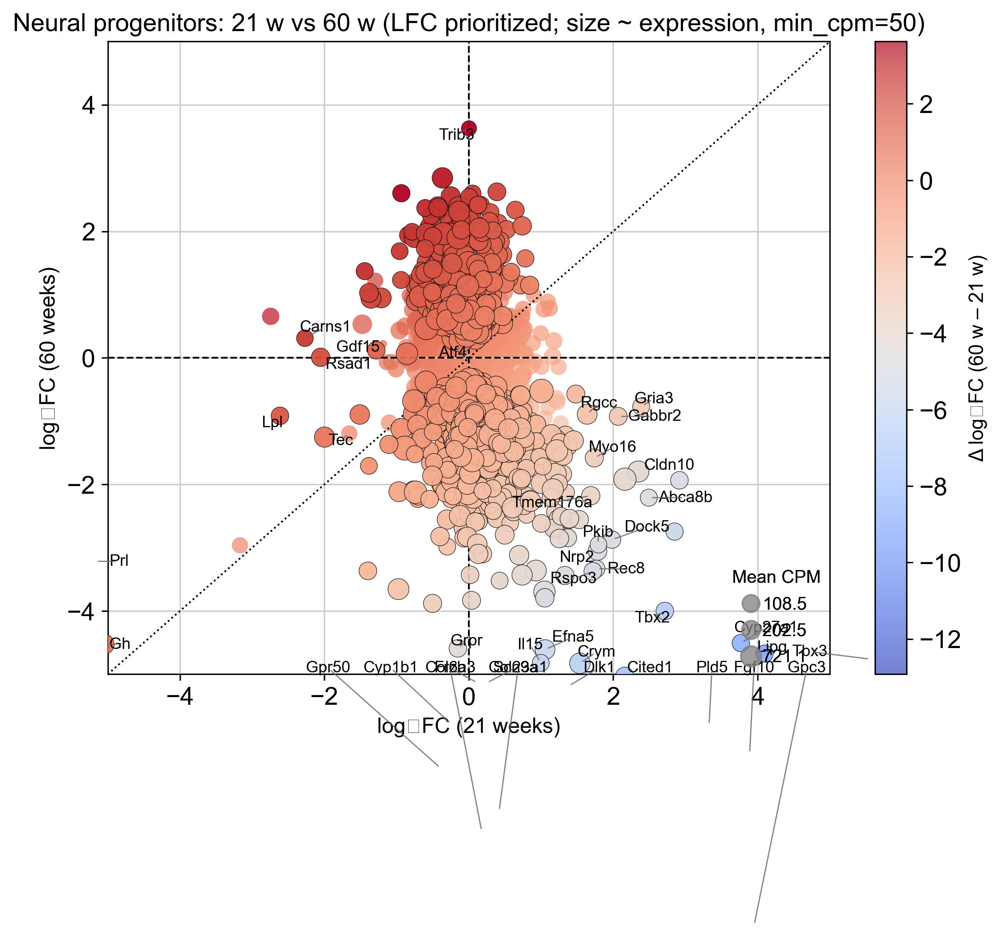

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Abca8b,17.206,2.493,1.301,1.916,0.055,1.000,64.428,0.917,45.618,83.239,90.231,38.625
Carns1,16.198,-2.270,0.984,-2.307,0.021,1.000,54.292,1.000,79.338,29.247,83.711,24.874
Cldn10,141.742,2.347,1.318,1.780,0.075,1.000,614.392,1.000,495.157,733.627,748.677,480.107
Cyp27a1,7.865,3.766,1.616,2.330,0.020,1.000,74.243,0.750,105.769,42.717,41.339,107.147
Dock5,17.243,1.983,2.639,0.752,0.452,1.000,76.437,0.750,74.169,78.704,90.041,62.833
Gabbr2,15.748,2.069,0.623,3.319,0.001,1.000,99.945,1.000,92.010,107.881,84.275,115.616
Gh,125.099,-5.051,2.133,-2.368,0.018,1.000,325.959,0.583,633.054,18.864,636.787,15.131
Gria3,14.152,2.387,1.047,2.281,0.023,1.000,61.812,1.000,42.643,80.980,74.764,48.860
Lipg,8.963,4.095,1.616,2.533,0.011,1.000,69.539,0.833,90.792,48.286,46.913,92.165
Lpl,29.715,-2.615,1.067,-2.451,0.014,1.000,86.760,0.917,145.301,28.219,152.688,20.833


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cited1,23.725,-5.031,0.931,-5.401,0.000,0.000,107.467,0.667,128.014,86.921,102.094,112.840
Col23a1,492.014,-7.179,0.412,-17.404,0.000,0.000,1886.320,1.000,2926.023,846.618,1429.881,2342.760
Col6a3,17.409,-5.143,1.513,-3.398,0.001,0.005,53.250,0.833,92.161,14.340,23.290,83.211
Crym,132.824,-4.827,0.383,-12.607,0.000,0.000,435.147,1.000,671.162,199.132,237.569,632.725
Cyp1b1,7.638,-5.792,2.007,-2.887,0.004,0.019,77.689,0.667,99.962,55.416,119.101,36.278
Cyp27a1,22.455,-4.508,0.817,-5.518,0.000,0.000,74.243,0.750,105.769,42.717,41.339,107.147
Dlk1,15.615,-5.191,1.793,-2.895,0.004,0.019,59.722,0.500,84.724,34.721,45.521,73.923
Efna5,67.512,-4.611,0.492,-9.375,0.000,0.000,280.026,1.000,383.876,176.176,238.131,321.920
Fgf10,20.760,-6.266,1.428,-4.389,0.000,0.000,76.572,0.583,101.170,51.974,54.477,98.666
Frzb,88.424,-7.497,1.075,-6.971,0.000,0.000,382.856,0.667,576.238,189.474,346.120,419.593


2025-10-28 10:01:51 | [INFO] maxp pruned
2025-10-28 10:01:51 | [INFO] LTSH dropped
2025-10-28 10:01:51 | [INFO] cmap pruned
2025-10-28 10:01:51 | [INFO] kern dropped
2025-10-28 10:01:51 | [INFO] post pruned
2025-10-28 10:01:51 | [INFO] PCLT dropped
2025-10-28 10:01:51 | [INFO] JSTF dropped
2025-10-28 10:01:51 | [INFO] DSIG dropped
2025-10-28 10:01:51 | [INFO] GPOS pruned
2025-10-28 10:01:51 | [INFO] GSUB pruned
2025-10-28 10:01:51 | [INFO] glyf pruned
2025-10-28 10:01:51 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:51 | [INFO] Added gid0 to subset
2025-10-28 10:01:51 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:51 | [INFO] Closing glyph list over 'GSUB': 69 glyphs before
2025-10-28 10:01:51 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'Delta', 'E', 'F', 'G', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'S', 'T', 'V', 'W', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'endash', 'equal', 'f', 'five', 'four', 'g', 

💾 Saved: ../results/figures/Ependymal_cells_21w_vs_60w.{png, svg, pdf}


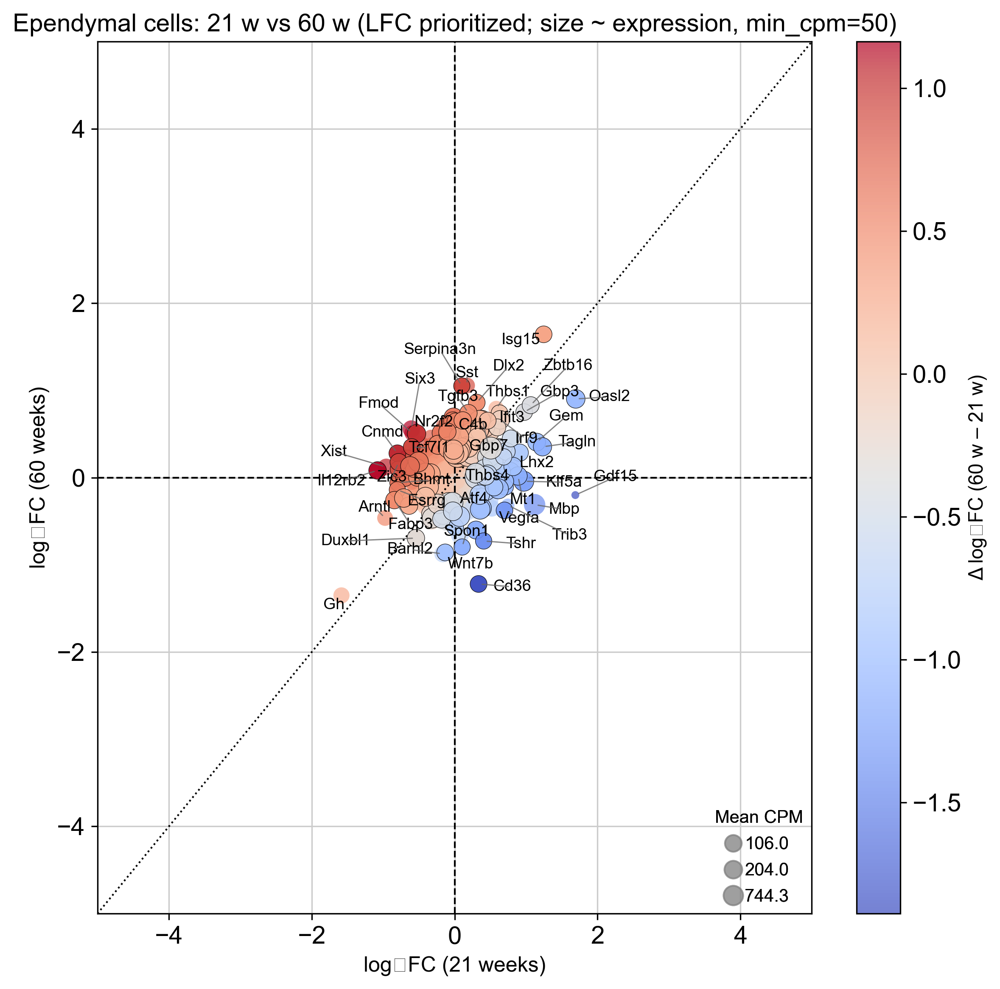

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Arntl,58.814,-0.974,0.976,-0.998,0.318,0.999,59.371,1.000,75.932,42.809,74.585,44.156
Bhmt,60.718,-0.793,0.361,-2.193,0.028,0.999,61.238,1.000,72.358,50.117,76.856,45.620
Cnmd,79.692,-0.802,0.359,-2.234,0.025,0.999,74.434,1.000,87.117,61.750,101.001,47.866
Esrrg,36.971,-0.803,0.361,-2.226,0.026,0.999,51.274,1.000,59.253,43.296,46.741,55.808
Fabp3,78.566,-0.844,0.404,-2.089,0.037,0.999,102.694,1.000,121.388,84.000,99.241,106.147
Gbp3,52.370,0.973,0.334,2.911,0.004,0.999,68.014,1.000,49.080,86.949,66.219,69.810
Gdf15,0.204,1.689,4.375,0.386,0.699,0.999,0.671,0.417,0.579,0.763,0.257,1.085
Gem,81.327,1.147,0.292,3.929,0.000,0.411,134.444,1.000,102.911,165.977,102.629,166.259
Gh,115.510,-1.585,1.676,-0.946,0.344,0.999,73.454,0.667,110.573,36.336,146.419,0.490
Il12rb2,107.025,-1.079,0.299,-3.609,0.000,0.494,116.021,1.000,140.546,91.495,135.618,96.423


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Barhl2,103.674,-0.874,0.573,-1.526,0.127,1.000,126.731,1.000,148.510,104.953,144.872,108.591
C4b,280.165,0.688,0.227,3.037,0.002,0.962,338.579,1.000,306.036,371.123,384.512,292.647
Cd36,76.220,-1.220,0.357,-3.417,0.001,0.523,74.120,1.000,86.424,61.815,68.600,79.639
Dlx2,56.748,0.860,0.376,2.288,0.022,1.000,67.019,1.000,53.871,80.167,74.704,59.334
Duxbl1,94.186,-0.694,0.227,-3.053,0.002,0.962,105.714,1.000,129.237,82.192,112.794,98.634
Gbp3,67.084,0.751,0.631,1.190,0.234,1.000,68.014,1.000,49.080,86.949,66.219,69.810
Gbp7,75.543,0.675,0.343,1.966,0.049,1.000,74.252,1.000,61.128,87.375,69.911,78.592
Gh,0.462,-1.351,3.203,-0.422,0.673,1.000,73.454,0.667,110.573,36.336,146.419,0.490
Ifit3,72.594,0.738,0.351,2.104,0.035,1.000,72.259,1.000,55.693,88.825,69.040,75.478
Irf9,249.850,0.663,0.538,1.231,0.218,1.000,216.585,1.000,170.320,262.850,173.576,259.594


2025-10-28 10:01:52 | [INFO] maxp pruned
2025-10-28 10:01:52 | [INFO] LTSH dropped
2025-10-28 10:01:52 | [INFO] cmap pruned
2025-10-28 10:01:52 | [INFO] kern dropped
2025-10-28 10:01:52 | [INFO] post pruned
2025-10-28 10:01:52 | [INFO] PCLT dropped
2025-10-28 10:01:52 | [INFO] JSTF dropped
2025-10-28 10:01:52 | [INFO] DSIG dropped
2025-10-28 10:01:52 | [INFO] GPOS pruned
2025-10-28 10:01:53 | [INFO] GSUB pruned
2025-10-28 10:01:53 | [INFO] glyf pruned
2025-10-28 10:01:53 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:53 | [INFO] Added gid0 to subset
2025-10-28 10:01:53 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:53 | [INFO] Closing glyph list over 'GSUB': 67 glyphs before
2025-10-28 10:01:53 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'Delta', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'W', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Cholinergic_neurons_21w_vs_60w.{png, svg, pdf}


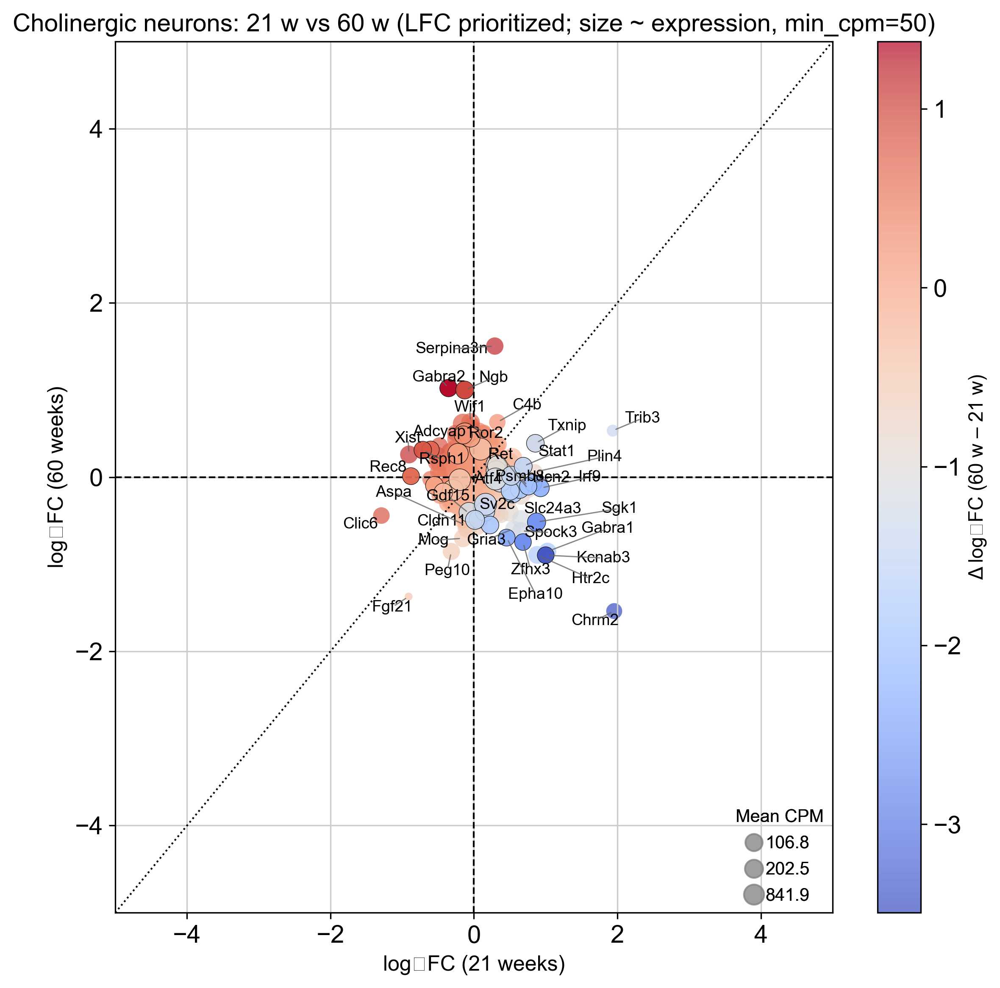

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Clic6,49.304,-1.290,1.325,-0.974,0.330,1.0,72.816,0.917,92.370,53.261,61.808,83.824
Fgf21,0.113,-0.911,4.450,-0.205,0.838,1.0,0.332,0.333,0.554,0.110,0.140,0.524
Gabra1,98.198,1.027,0.862,1.192,0.233,1.0,127.551,1.000,124.764,130.337,123.622,131.480
Hcn2,61.264,0.826,0.298,2.767,0.006,1.0,83.806,1.000,73.531,94.080,76.973,90.638
Htr2c,125.965,0.881,1.129,0.780,0.435,1.0,162.937,1.000,163.940,161.934,158.509,167.365
Irf9,52.434,0.929,0.304,3.056,0.002,1.0,73.098,1.000,64.816,81.380,65.818,80.378
Kcnab3,44.100,1.001,0.444,2.255,0.024,1.0,53.401,1.000,51.542,55.260,55.475,51.327
Plin4,50.234,0.846,0.842,1.004,0.315,1.0,56.740,1.000,46.833,66.647,63.221,50.259
Psmb8,52.113,0.757,0.340,2.223,0.026,1.0,69.342,1.000,61.389,77.296,65.379,73.306
Rec8,43.905,-0.877,0.349,-2.512,0.012,1.0,59.609,1.000,66.900,52.318,55.054,64.163


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcyap1,834.789,0.612,0.324,1.887,0.059,1.000,1008.423,1.000,941.113,1075.733,1112.622,904.224
Aspa,80.641,-0.555,0.312,-1.775,0.076,1.000,81.909,1.000,91.268,72.551,76.472,87.347
C4b,71.432,0.630,0.338,1.864,0.062,1.000,67.758,1.000,56.280,79.235,58.025,77.491
Chrm2,48.425,-1.538,1.205,-1.276,0.202,1.000,51.372,1.000,49.127,53.618,50.392,52.353
Cldn11,478.562,-0.584,0.331,-1.763,0.078,1.000,541.256,1.000,600.671,481.840,564.323,518.189
Epha10,52.524,-0.695,0.318,-2.182,0.029,1.000,57.039,1.000,59.096,54.983,57.131,56.948
Fgf21,0.484,-1.372,2.848,-0.482,0.630,1.000,0.332,0.333,0.554,0.110,0.140,0.524
Gabra1,121.364,-0.853,0.481,-1.773,0.076,1.000,127.551,1.000,124.764,130.337,123.622,131.480
Gabra2,76.721,1.022,0.254,4.020,0.000,0.287,84.080,1.000,75.818,92.342,84.957,83.203
Gria3,54.285,-0.593,0.325,-1.821,0.069,1.000,59.760,1.000,59.829,59.690,60.683,58.837


2025-10-28 10:01:54 | [INFO] maxp pruned
2025-10-28 10:01:54 | [INFO] LTSH dropped
2025-10-28 10:01:54 | [INFO] cmap pruned
2025-10-28 10:01:54 | [INFO] kern dropped
2025-10-28 10:01:54 | [INFO] post pruned
2025-10-28 10:01:54 | [INFO] PCLT dropped
2025-10-28 10:01:54 | [INFO] JSTF dropped
2025-10-28 10:01:54 | [INFO] DSIG dropped
2025-10-28 10:01:54 | [INFO] GPOS pruned
2025-10-28 10:01:54 | [INFO] GSUB pruned
2025-10-28 10:01:54 | [INFO] glyf pruned
2025-10-28 10:01:54 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:54 | [INFO] Added gid0 to subset
2025-10-28 10:01:54 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:54 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-28 10:01:54 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'Delta', 'E', 'F', 'G', 'I', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', '

💾 Saved: ../results/figures/Chorid_plexus_epithelial_cells_21w_vs_60w.{png, svg, pdf}


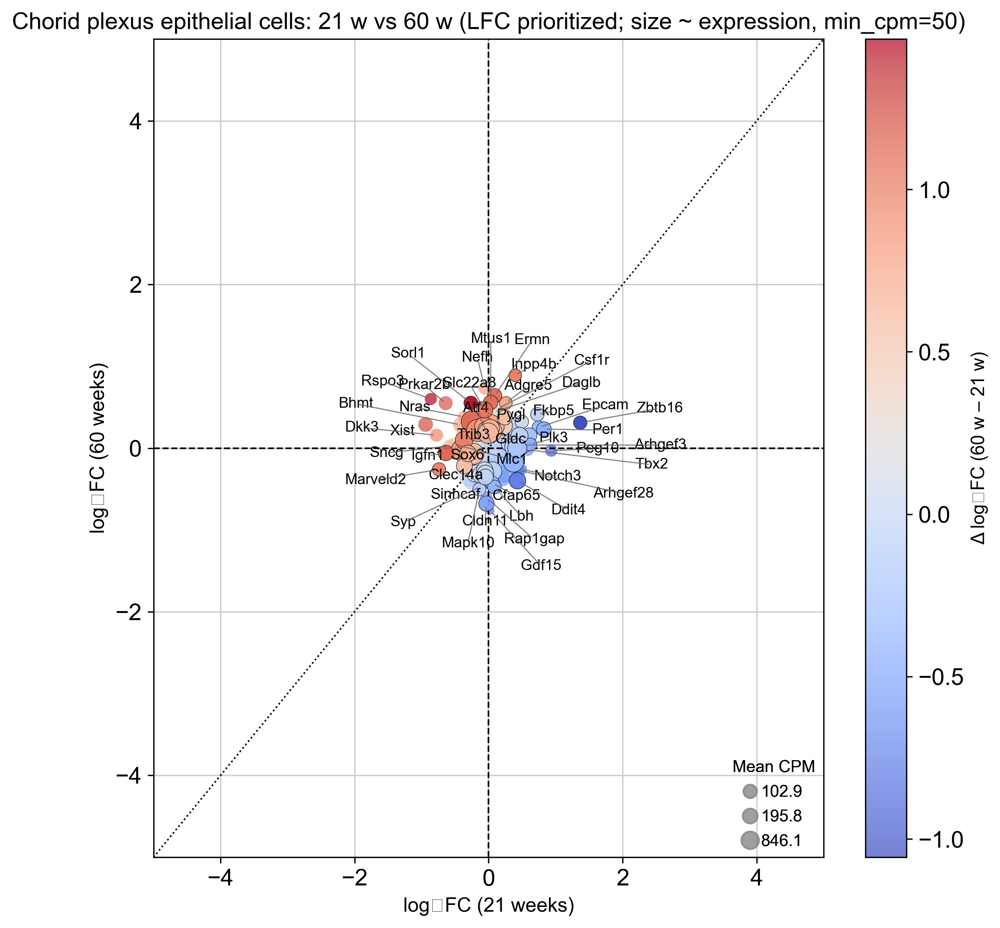

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Arhgef3,568.130,0.503,0.145,3.467,0.001,1.000,395.787,1.000,362.443,429.130,376.486,415.088
Dkk3,140.405,-0.778,0.682,-1.140,0.254,1.000,81.181,1.000,91.743,70.619,93.522,68.841
Epcam,112.171,0.749,0.294,2.551,0.011,1.000,65.965,1.000,53.998,77.932,74.225,57.705
Fkbp5,100.840,0.728,0.294,2.477,0.013,1.000,76.025,1.000,61.784,90.266,66.822,85.229
Gldc,198.536,0.611,0.206,2.959,0.003,1.000,127.482,1.000,109.804,145.160,131.466,123.498
Igfn1,307.474,-0.638,0.254,-2.509,0.012,1.000,178.055,1.000,203.008,153.101,204.499,151.611
Marveld2,114.357,-0.740,0.293,-2.522,0.012,1.000,71.827,1.000,84.661,58.993,75.958,67.696
Mlc1,85.389,-0.523,0.272,-1.921,0.055,1.000,53.959,1.000,59.470,48.448,56.808,51.110
Notch3,77.159,0.483,0.256,1.884,0.060,1.000,57.816,1.000,57.078,58.553,51.199,64.432
Peg10,98.492,0.934,0.971,0.962,0.336,1.000,61.555,1.000,51.797,71.313,65.661,57.450


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adgre5,85.126,0.552,0.248,2.231,0.026,1.000,55.794,1.0,47.811,63.777,49.781,61.806
Cfap65,113.305,-0.430,0.213,-2.022,0.043,1.000,96.362,1.0,102.426,90.299,110.428,82.297
Cldn11,226.749,-0.678,0.166,-4.084,0.000,0.219,176.259,1.0,197.749,154.770,187.747,164.771
Clec14a,130.670,-0.419,0.216,-1.935,0.053,1.000,107.695,1.0,116.970,98.420,120.389,95.001
Csf1r,115.134,0.477,0.503,0.947,0.343,1.000,79.984,1.0,71.739,88.230,76.217,83.752
Daglb,92.788,0.439,0.240,1.827,0.068,1.000,71.479,1.0,65.965,76.993,75.665,67.293
Ermn,128.565,0.641,0.230,2.793,0.005,1.000,108.461,1.0,96.923,120.000,123.812,93.110
Gdf15,19.458,-0.765,0.498,-1.537,0.124,1.000,14.164,1.0,16.426,11.901,14.207,14.120
Inpp4b,73.742,0.890,0.262,3.397,0.001,1.000,52.438,1.0,41.152,63.724,51.448,53.428
Lbh,108.770,-0.475,0.214,-2.222,0.026,1.000,84.360,1.0,90.055,78.666,89.638,79.083


2025-10-28 10:01:57 | [INFO] maxp pruned
2025-10-28 10:01:57 | [INFO] LTSH dropped
2025-10-28 10:01:57 | [INFO] cmap pruned
2025-10-28 10:01:57 | [INFO] kern dropped
2025-10-28 10:01:57 | [INFO] post pruned
2025-10-28 10:01:57 | [INFO] PCLT dropped
2025-10-28 10:01:57 | [INFO] JSTF dropped
2025-10-28 10:01:57 | [INFO] DSIG dropped
2025-10-28 10:01:57 | [INFO] GPOS pruned
2025-10-28 10:01:57 | [INFO] GSUB pruned
2025-10-28 10:01:57 | [INFO] glyf pruned
2025-10-28 10:01:57 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:57 | [INFO] Added gid0 to subset
2025-10-28 10:01:57 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:57 | [INFO] Closing glyph list over 'GSUB': 69 glyphs before
2025-10-28 10:01:57 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'U', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', '

💾 Saved: ../results/figures/Unknown_21w_vs_60w.{png, svg, pdf}


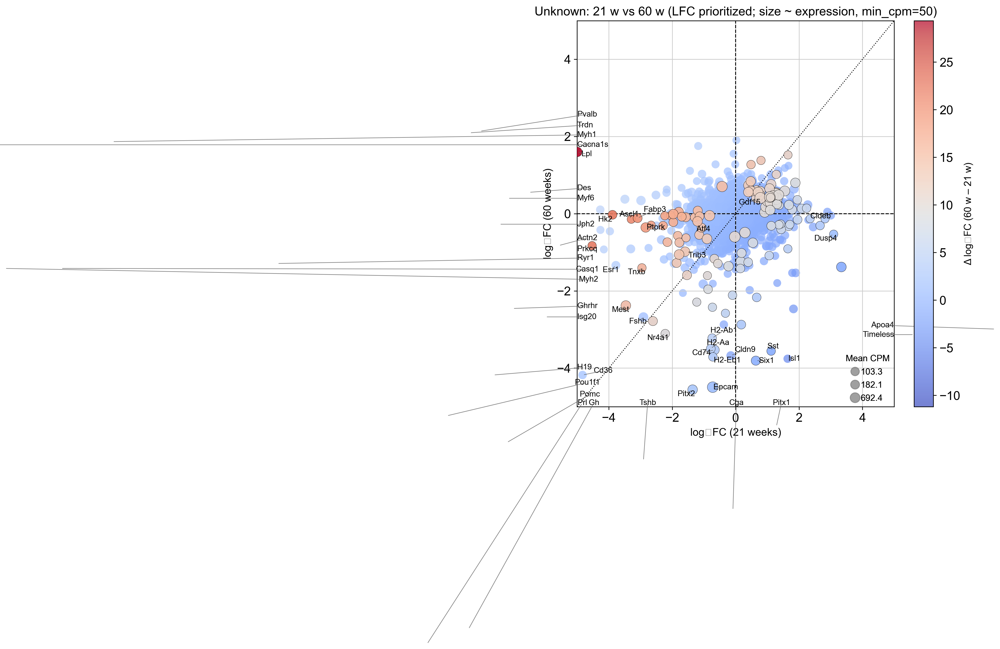

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Actn2,204.280,-5.586,1.965,-2.843,0.004,0.998,386.176,0.917,747.688,24.665,752.170,20.182
Ascl1,24.124,-3.292,1.520,-2.166,0.030,0.998,58.750,0.750,101.385,16.115,98.160,19.339
Cideb,17.475,2.893,1.544,1.874,0.061,0.998,93.647,1.000,69.431,117.864,65.656,121.639
Dusp4,22.423,3.091,1.246,2.480,0.013,0.998,66.796,0.917,35.585,98.006,93.182,40.409
Esr1,91.240,-3.778,2.595,-1.456,0.145,0.998,191.800,0.583,353.679,29.921,369.726,13.873
Fabp3,61.890,-3.092,1.414,-2.186,0.029,0.998,147.749,1.000,238.150,57.349,227.709,67.790
Fshb,325.854,-2.908,3.045,-0.955,0.340,0.998,666.671,0.333,1165.962,167.379,1328.907,4.434
Gh,2815.927,-8.430,2.373,-3.553,0.000,0.761,6140.151,0.500,12250.232,30.069,11162.349,1117.953
Ghrhr,33.795,-7.039,3.050,-2.308,0.021,0.998,70.067,0.333,140.134,0.000,136.503,3.631
Hk2,61.878,-3.885,1.682,-2.310,0.021,0.998,126.232,0.917,227.851,24.612,231.337,21.126


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Apoa4,2.172,-2.990,1.645,-1.818,0.069,0.998,90.208,0.583,15.954,164.462,163.136,17.280
Cd36,1.423,-4.180,3.878,-1.078,0.281,0.998,122.303,0.500,235.537,9.068,232.910,11.696
Cd74,15.824,-3.530,1.159,-3.046,0.002,0.974,257.724,0.667,344.296,171.153,387.809,127.639
Cga,15.998,-7.687,2.470,-3.112,0.002,0.974,1599.244,0.500,1632.831,1565.656,3068.778,129.710
Cldn9,1.016,-3.677,2.480,-1.482,0.138,0.998,175.271,0.583,181.687,168.856,342.280,8.262
Epcam,21.804,-4.495,1.436,-3.130,0.002,0.974,1541.133,1.000,1923.737,1158.529,2904.891,177.375
Gh,135.288,-10.769,4.224,-2.549,0.011,0.998,6140.151,0.500,12250.232,30.069,11162.349,1117.953
H19,1.423,-4.180,3.878,-1.078,0.281,0.998,119.529,0.333,239.059,0.000,227.363,11.696
H2-Aa,8.165,-3.498,0.991,-3.532,0.000,0.974,127.288,0.833,176.064,78.511,189.008,65.567
H2-Ab1,6.494,-3.224,1.002,-3.217,0.001,0.974,89.487,0.667,124.429,54.546,126.459,52.516


2025-10-28 10:01:59 | [INFO] maxp pruned
2025-10-28 10:01:59 | [INFO] LTSH dropped
2025-10-28 10:01:59 | [INFO] cmap pruned
2025-10-28 10:01:59 | [INFO] kern dropped
2025-10-28 10:01:59 | [INFO] post pruned
2025-10-28 10:01:59 | [INFO] PCLT dropped
2025-10-28 10:01:59 | [INFO] JSTF dropped
2025-10-28 10:01:59 | [INFO] DSIG dropped
2025-10-28 10:01:59 | [INFO] GPOS pruned
2025-10-28 10:01:59 | [INFO] GSUB pruned
2025-10-28 10:01:59 | [INFO] glyf pruned
2025-10-28 10:01:59 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:01:59 | [INFO] Added gid0 to subset
2025-10-28 10:01:59 | [INFO] Added first four glyphs to subset
2025-10-28 10:01:59 | [INFO] Closing glyph list over 'GSUB': 65 glyphs before
2025-10-28 10:01:59 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'Delta', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'P', 'S', 'T', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', 'k', 'l', '

💾 Saved: ../results/figures/Neurons_21w_vs_60w.{png, svg, pdf}


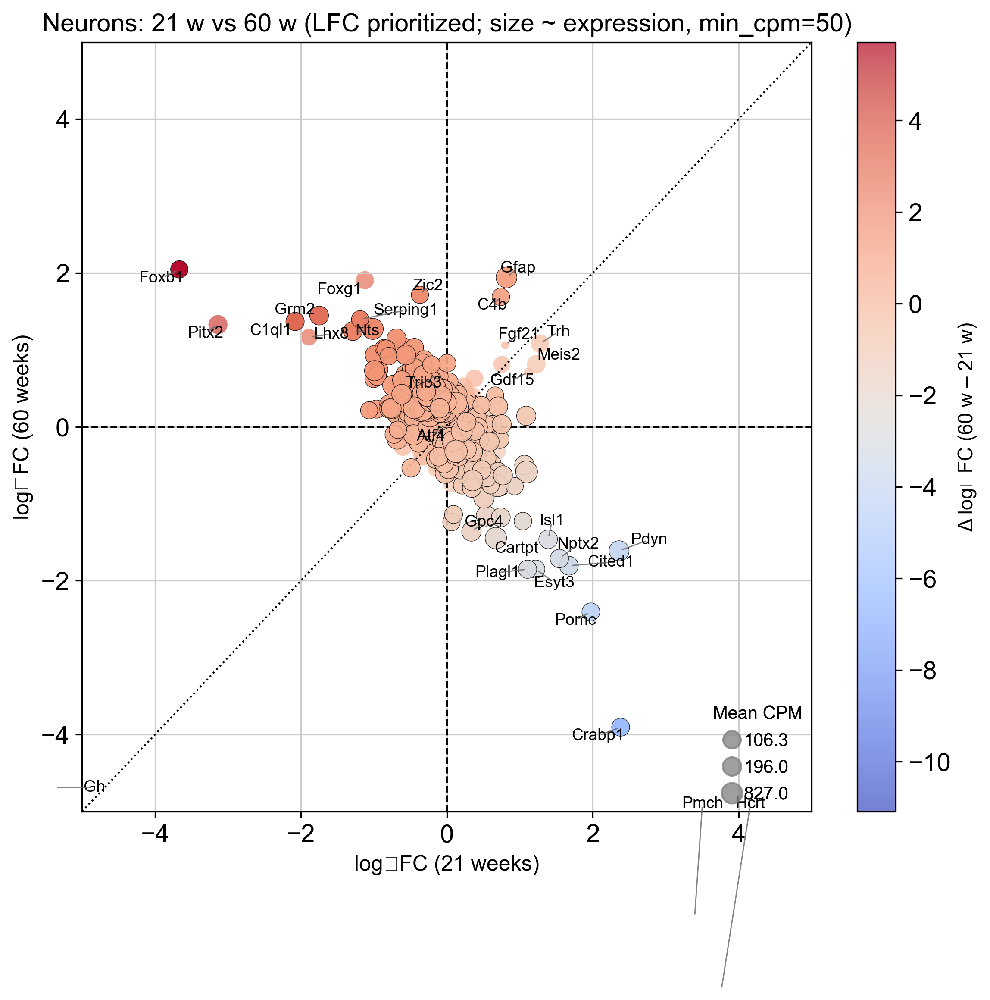

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
C1ql1,673.686,-2.081,0.340,-6.114,0.000,0.000,100.788,1.000,115.343,86.233,111.510,90.066
Cited1,641.753,1.673,0.800,2.090,0.037,0.836,124.384,1.000,135.832,112.937,107.037,141.731
Esyt3,497.335,1.219,0.921,1.323,0.186,0.999,83.385,1.000,90.687,76.082,82.698,84.071
Foxb1,400.790,-3.667,1.348,-2.721,0.007,0.431,58.117,1.000,69.852,46.382,64.662,51.572
Gdf15,6.111,1.119,0.815,1.372,0.170,0.999,0.907,1.000,0.611,1.202,1.013,0.800
Gh,1632.648,-5.386,1.641,-3.282,0.001,0.136,141.183,0.917,275.597,6.769,270.951,11.415
Grm2,849.485,-1.751,0.720,-2.430,0.015,0.634,136.309,1.000,142.430,130.188,138.805,133.813
Hcrt,1703.726,3.761,1.733,2.169,0.030,0.814,343.392,1.000,420.094,266.691,282.954,403.831
Isl1,654.779,1.388,0.480,2.890,0.004,0.331,122.574,1.000,130.040,115.107,108.810,136.337
Lhx8,456.686,-1.891,1.519,-1.245,0.213,0.999,56.693,1.000,71.367,42.018,75.666,37.720


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
C1ql1,595.956,1.368,0.750,1.823,0.068,0.567,100.788,1.000,115.343,86.233,111.510,90.066
C4b,523.456,1.688,0.333,5.065,0.000,0.000,64.910,1.000,37.730,92.090,50.657,79.164
Cartpt,5021.926,-1.447,0.583,-2.481,0.013,0.262,750.041,1.000,838.232,661.850,741.108,758.974
Cited1,937.277,-1.806,0.310,-5.828,0.000,0.000,124.384,1.000,135.832,112.937,107.037,141.731
Crabp1,721.665,-3.905,1.001,-3.903,0.000,0.008,77.666,1.000,110.190,45.142,45.710,109.622
Esyt3,556.365,-1.851,0.428,-4.325,0.000,0.002,83.385,1.000,90.687,76.082,82.698,84.071
Foxg1,917.717,1.904,1.058,1.800,0.072,0.583,142.704,1.000,131.213,154.195,148.913,136.494
Gfap,4067.952,1.940,0.395,4.913,0.000,0.000,487.305,1.000,256.853,717.757,357.945,616.664
Gh,74.833,-4.687,1.829,-2.563,0.010,0.233,141.183,0.917,275.597,6.769,270.951,11.415
Gpc4,1502.669,-1.361,0.358,-3.803,0.000,0.010,201.421,1.000,241.303,161.539,175.609,227.233


2025-10-28 10:02:00 | [INFO] maxp pruned
2025-10-28 10:02:00 | [INFO] LTSH dropped
2025-10-28 10:02:00 | [INFO] cmap pruned
2025-10-28 10:02:00 | [INFO] kern dropped
2025-10-28 10:02:00 | [INFO] post pruned
2025-10-28 10:02:00 | [INFO] PCLT dropped
2025-10-28 10:02:00 | [INFO] JSTF dropped
2025-10-28 10:02:00 | [INFO] DSIG dropped
2025-10-28 10:02:00 | [INFO] GPOS pruned
2025-10-28 10:02:00 | [INFO] GSUB pruned
2025-10-28 10:02:00 | [INFO] glyf pruned
2025-10-28 10:02:00 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:02:00 | [INFO] Added gid0 to subset
2025-10-28 10:02:00 | [INFO] Added first four glyphs to subset
2025-10-28 10:02:00 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-28 10:02:00 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'Delta', 'E', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'O', 'P', 'S', 'T', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', 'hyphen', 'i', 

💾 Saved: ../results/figures/Olfactory_astrocytes_21w_vs_60w.{png, svg, pdf}


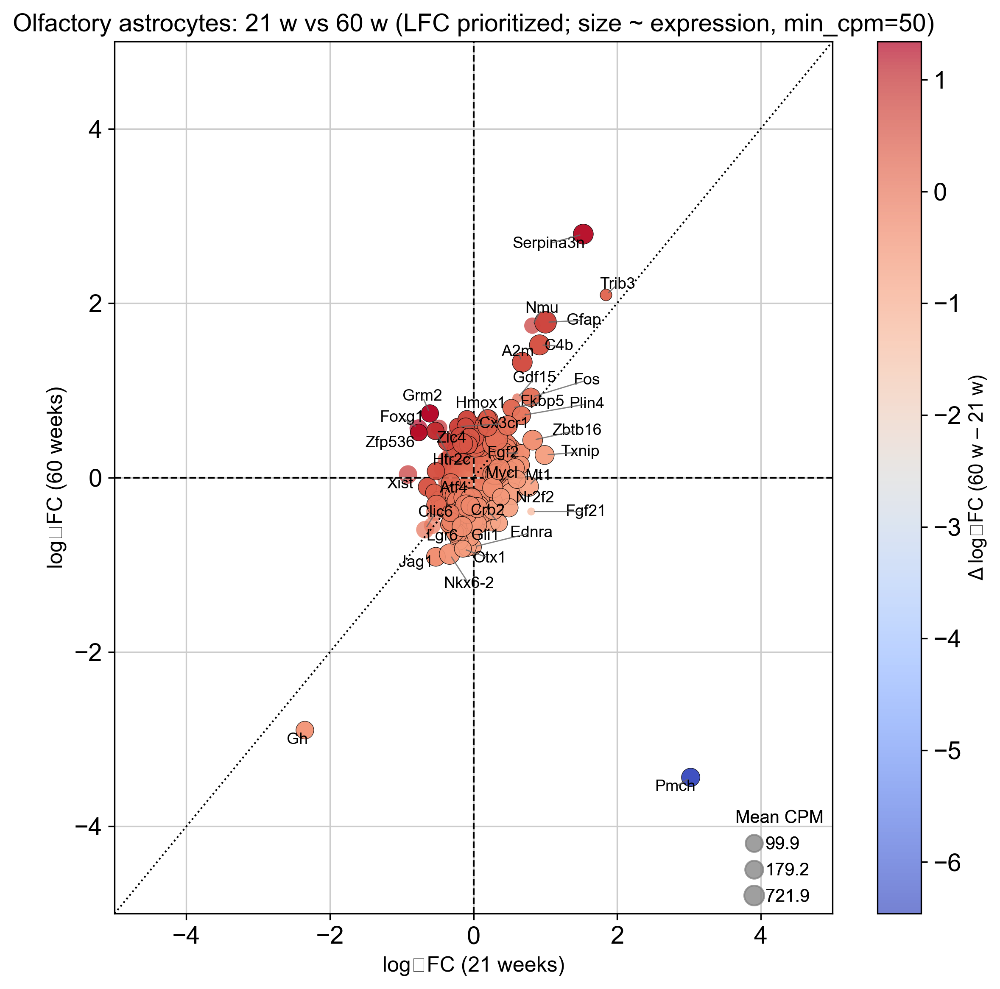

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
A2m,734.018,0.679,0.473,1.435,0.151,1.000,408.279,1.000,265.941,550.618,319.919,496.640
C4b,1000.136,0.920,0.616,1.493,0.135,1.000,491.204,1.000,293.323,689.085,437.558,544.850
Clic6,378.639,-0.676,0.706,-0.958,0.338,1.000,147.384,1.000,180.537,114.232,166.099,128.670
Fgf2,118.517,0.666,0.260,2.558,0.011,1.000,60.138,1.000,51.114,69.161,51.799,68.477
Fgf21,0.449,0.804,2.934,0.274,0.784,1.000,0.140,0.417,0.121,0.159,0.195,0.085
Fos,231.986,0.800,0.302,2.649,0.008,1.000,151.247,1.000,106.944,195.550,101.316,201.177
Foxg1,422.536,-0.768,0.970,-0.791,0.429,1.000,158.425,1.000,170.911,145.938,186.366,130.483
Gfap,3024.090,1.003,0.592,1.694,0.090,1.000,1632.657,1.000,880.487,2384.826,1321.317,1943.997
Gh,419.797,-2.349,1.646,-1.427,0.153,1.000,93.994,0.917,157.784,30.204,185.712,2.276
Mt1,865.020,0.767,0.156,4.901,0.000,0.005,385.162,1.000,344.441,425.883,377.434,392.889


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
A2m,1541.486,1.323,0.643,2.057,0.040,0.826,408.279,1.000,265.941,550.618,319.919,496.640
C4b,1689.531,1.522,0.639,2.380,0.017,0.552,491.204,1.000,293.323,689.085,437.558,544.850
Ednra,171.716,-0.797,0.285,-2.799,0.005,0.299,56.595,1.000,64.090,49.100,57.580,55.609
Fkbp5,214.061,0.798,0.312,2.557,0.011,0.440,67.873,1.000,52.893,82.853,66.689,69.057
Fos,622.582,0.921,0.241,3.813,0.000,0.051,151.247,1.000,106.944,195.550,101.316,201.177
Gdf15,3.270,0.909,1.108,0.821,0.412,NaN,1.096,0.917,0.822,1.370,1.139,1.053
Gfap,6023.509,1.781,0.684,2.604,0.009,0.418,1632.657,1.000,880.487,2384.826,1321.317,1943.997
Gh,7.009,-2.896,1.223,-2.367,0.018,0.567,93.994,0.917,157.784,30.204,185.712,2.276
Gli1,317.435,-0.800,0.245,-3.271,0.001,0.120,129.345,1.000,146.001,112.690,155.934,102.756
Grm2,275.391,0.735,0.370,1.986,0.047,0.907,76.600,1.000,72.580,80.620,64.024,89.176


2025-10-28 10:02:02 | [INFO] maxp pruned
2025-10-28 10:02:02 | [INFO] LTSH dropped
2025-10-28 10:02:02 | [INFO] cmap pruned
2025-10-28 10:02:02 | [INFO] kern dropped
2025-10-28 10:02:02 | [INFO] post pruned
2025-10-28 10:02:02 | [INFO] PCLT dropped
2025-10-28 10:02:02 | [INFO] JSTF dropped
2025-10-28 10:02:02 | [INFO] DSIG dropped
2025-10-28 10:02:02 | [INFO] GPOS pruned
2025-10-28 10:02:02 | [INFO] GSUB pruned
2025-10-28 10:02:02 | [INFO] glyf pruned
2025-10-28 10:02:02 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:02:02 | [INFO] Added gid0 to subset
2025-10-28 10:02:02 | [INFO] Added first four glyphs to subset
2025-10-28 10:02:02 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-28 10:02:02 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'Delta', 'E', 'F', 'G', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'X', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', '

💾 Saved: ../results/figures/Striatal_neurons_21w_vs_60w.{png, svg, pdf}


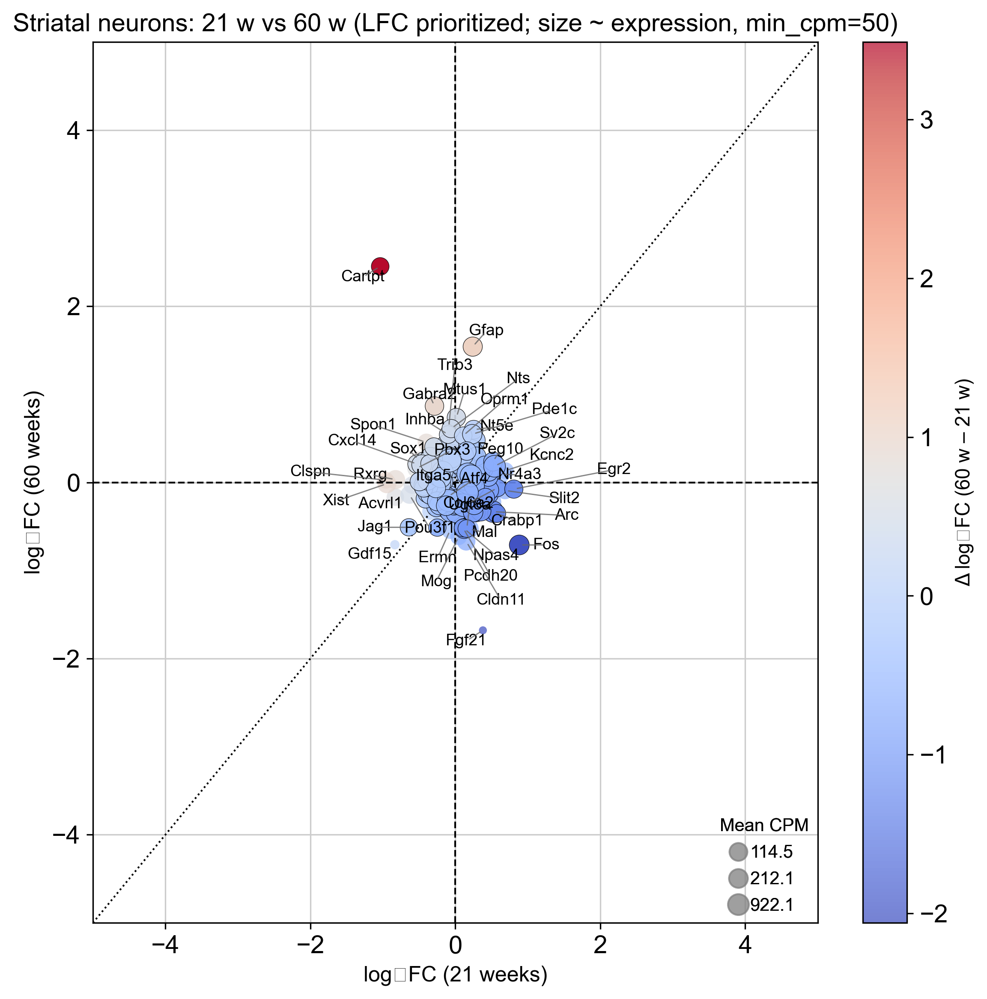

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Acvrl1,455.442,-0.828,0.803,-1.030,0.303,1.000,89.774,1.000,106.514,73.033,107.163,72.384
Arc,1665.995,0.519,0.139,3.739,0.000,0.236,660.175,1.000,675.320,645.031,395.009,925.341
Cartpt,333.654,-1.036,1.198,-0.865,0.387,1.000,66.040,1.000,60.896,71.184,78.925,53.155
Clspn,295.875,-0.959,0.543,-1.765,0.078,1.000,60.219,1.000,71.130,49.308,69.611,50.828
Col6a2,252.333,0.580,0.203,2.858,0.004,1.000,56.636,1.000,50.679,62.593,59.908,53.365
Crabp1,336.272,0.571,0.224,2.552,0.011,1.000,80.226,1.000,76.727,83.724,79.829,80.622
Cxcl14,484.002,-0.527,0.265,-1.983,0.047,1.000,117.637,1.000,123.219,112.056,114.478,120.797
Egr2,217.341,0.807,0.272,2.963,0.003,1.000,92.961,1.000,86.743,99.178,51.633,134.288
Fos,428.357,0.882,0.204,4.323,0.000,0.039,244.014,1.000,274.686,213.341,101.766,386.261
Gdf15,3.970,-0.834,1.035,-0.806,0.420,1.000,0.942,0.917,1.200,0.683,0.938,0.945


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cartpt,180.773,2.452,0.651,3.765,0.000,0.055,66.040,1.000,60.896,71.184,78.925,53.155
Cldn11,597.929,-0.669,0.420,-1.594,0.111,1.000,163.537,1.000,179.155,147.919,150.679,176.395
Ermn,406.371,-0.540,0.347,-1.556,0.120,1.000,116.280,1.000,128.355,104.205,112.643,119.917
Fgf21,1.187,-1.679,2.006,-0.837,0.403,NaN,0.276,0.500,0.389,0.164,0.202,0.351
Fos,1305.825,-0.710,0.345,-2.060,0.039,1.000,244.014,1.000,274.686,213.341,101.766,386.261
Gabra2,390.596,0.867,0.136,6.360,0.000,0.000,111.285,1.000,98.821,123.750,107.146,115.424
Gdf15,3.201,-0.707,1.095,-0.646,0.518,NaN,0.942,0.917,1.200,0.683,0.938,0.945
Gfap,757.719,1.541,0.756,2.039,0.041,1.000,165.354,1.000,105.536,225.171,106.561,224.146
Inhba,209.440,0.543,0.180,3.008,0.003,0.396,65.515,1.000,60.029,71.001,69.078,61.952
Mal,1125.973,-0.526,0.417,-1.262,0.207,1.000,305.428,1.000,325.295,285.562,278.752,332.104


2025-10-28 10:02:04 | [INFO] maxp pruned
2025-10-28 10:02:04 | [INFO] LTSH dropped
2025-10-28 10:02:04 | [INFO] cmap pruned
2025-10-28 10:02:04 | [INFO] kern dropped
2025-10-28 10:02:04 | [INFO] post pruned
2025-10-28 10:02:04 | [INFO] PCLT dropped
2025-10-28 10:02:04 | [INFO] JSTF dropped
2025-10-28 10:02:04 | [INFO] DSIG dropped
2025-10-28 10:02:04 | [INFO] GPOS pruned
2025-10-28 10:02:04 | [INFO] GSUB pruned
2025-10-28 10:02:04 | [INFO] glyf pruned
2025-10-28 10:02:04 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:02:04 | [INFO] Added gid0 to subset
2025-10-28 10:02:04 | [INFO] Added first four glyphs to subset
2025-10-28 10:02:04 | [INFO] Closing glyph list over 'GSUB': 66 glyphs before
2025-10-28 10:02:04 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'V', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'four', 'g', 'h', '

💾 Saved: ../results/figures/Excitatory_neurons_(thalamus)_21w_vs_60w.{png, svg, pdf}


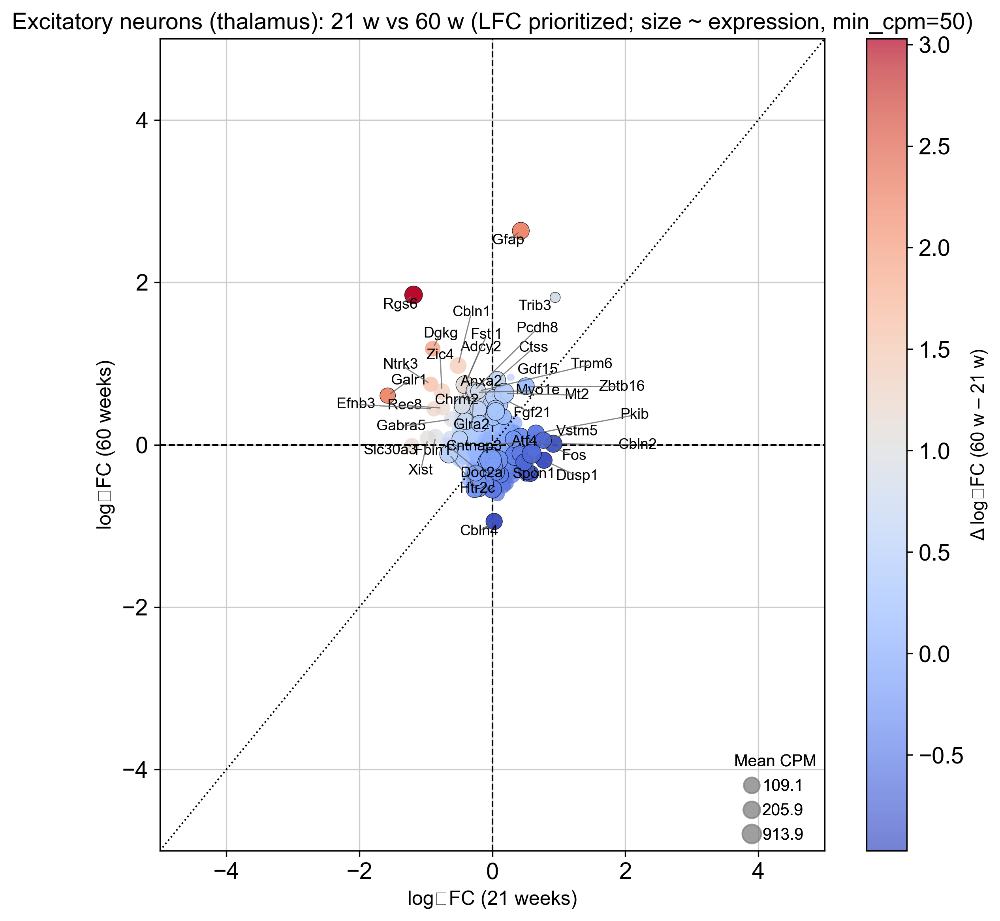

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Cbln2,1108.175,0.919,0.304,3.021,0.003,1.0,170.161,1.0,141.969,198.353,179.075,161.247
Cntnap3,640.182,-0.631,0.509,-1.239,0.215,1.0,103.832,1.0,114.206,93.458,105.072,102.591
Dgkg,482.403,-0.897,0.890,-1.008,0.313,1.0,85.492,1.0,79.971,91.014,79.639,91.345
Doc2a,402.559,-0.680,0.986,-0.689,0.491,1.0,67.599,1.0,75.422,59.776,66.162,69.037
Dusp1,394.950,0.778,0.238,3.262,0.001,1.0,91.530,1.0,86.746,96.314,63.729,119.331
Efnb3,483.397,-0.876,0.533,-1.643,0.100,1.0,70.401,1.0,77.800,63.001,79.479,61.322
Fbln1,449.414,-0.853,0.781,-1.093,0.274,1.0,71.401,1.0,80.948,61.854,73.751,69.050
Fos,1112.801,0.638,0.335,1.905,0.057,1.0,341.358,1.0,315.616,367.100,179.515,503.202
Gabra5,583.936,-0.610,0.532,-1.146,0.252,1.0,100.038,1.0,104.645,95.431,95.850,104.225
Galr1,307.182,-1.573,0.570,-2.759,0.006,1.0,55.720,1.0,62.142,49.299,50.707,60.734


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adcy2,508.491,0.733,0.473,1.551,0.121,1.000,88.736,1.0,83.679,93.793,86.201,91.272
Anxa2,343.307,0.728,0.544,1.337,0.181,1.000,60.275,1.0,56.114,64.436,58.897,61.653
Cbln1,1097.857,0.974,0.774,1.259,0.208,1.000,207.788,1.0,195.476,220.100,218.276,197.300
Cbln4,547.229,-0.944,0.417,-2.263,0.024,1.000,100.256,1.0,115.067,85.445,103.147,97.364
Chrm2,538.544,0.635,0.350,1.816,0.069,1.000,97.421,1.0,93.696,101.146,98.312,96.531
Ctss,854.153,0.799,0.308,2.592,0.010,0.927,119.395,1.0,97.114,141.677,85.649,153.142
Dgkg,507.434,1.183,0.972,1.217,0.224,1.000,85.492,1.0,79.971,91.014,79.639,91.345
Fstl1,1547.788,0.739,0.355,2.084,0.037,1.000,281.618,1.0,267.257,295.979,285.735,277.501
Gdf15,7.094,0.828,1.010,0.820,0.412,1.000,1.070,1.0,0.848,1.292,0.876,1.263
Gfap,1137.813,2.635,0.426,6.191,0.000,0.000,140.203,1.0,60.718,219.688,76.103,204.303


2025-10-28 10:02:06 | [INFO] maxp pruned
2025-10-28 10:02:06 | [INFO] LTSH dropped
2025-10-28 10:02:06 | [INFO] cmap pruned
2025-10-28 10:02:06 | [INFO] kern dropped
2025-10-28 10:02:06 | [INFO] post pruned
2025-10-28 10:02:06 | [INFO] PCLT dropped
2025-10-28 10:02:06 | [INFO] JSTF dropped
2025-10-28 10:02:06 | [INFO] DSIG dropped
2025-10-28 10:02:06 | [INFO] GPOS pruned
2025-10-28 10:02:06 | [INFO] GSUB pruned
2025-10-28 10:02:06 | [INFO] glyf pruned
2025-10-28 10:02:06 | [INFO] Missing glyphs for requested Unicodes: ['U+2082']
2025-10-28 10:02:06 | [INFO] Added gid0 to subset
2025-10-28 10:02:06 | [INFO] Added first four glyphs to subset
2025-10-28 10:02:06 | [INFO] Closing glyph list over 'GSUB': 69 glyphs before
2025-10-28 10:02:06 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'Delta', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'W', 'X', 'Z', 'a', 'asciitilde', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'endash', 'equal', 'f', 'five', 'fou

💾 Saved: ../results/figures/D1_medium_spiny_neurons_(striatum)_21w_vs_60w.{png, svg, pdf}


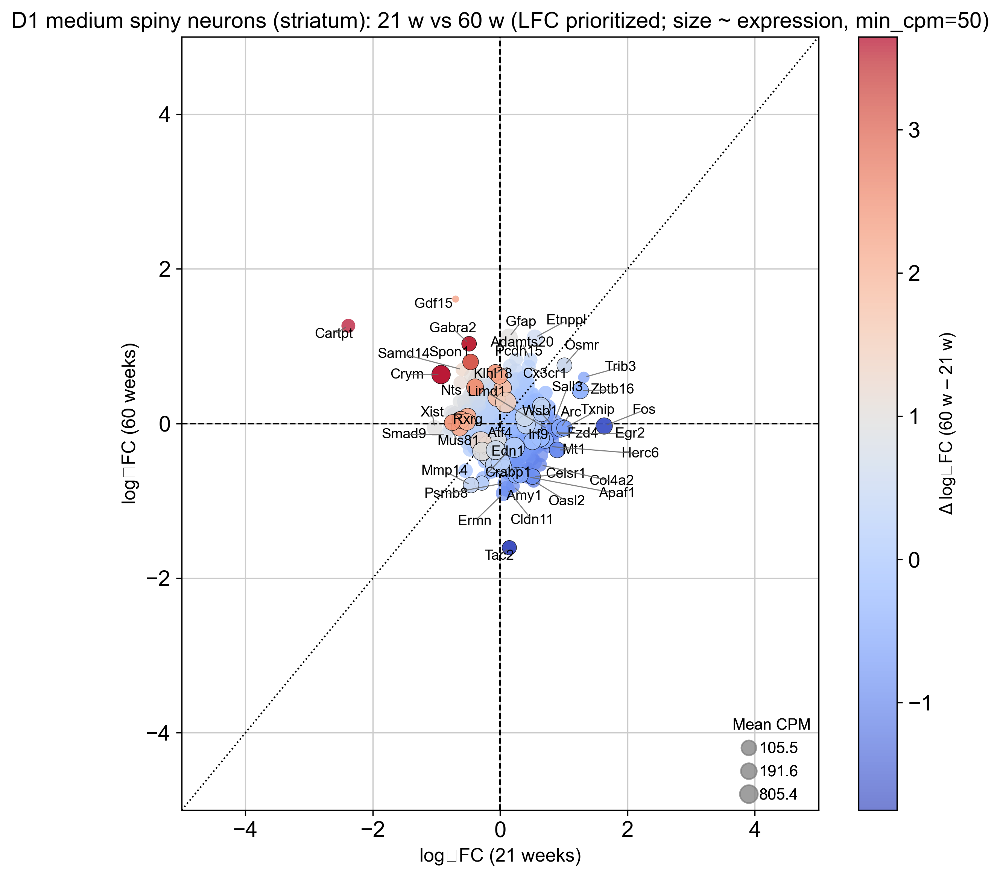

,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Arc,108.521,0.949,0.266,3.571,0.000,0.549,622.249,1.000,563.653,680.844,364.906,879.592
Cartpt,20.144,-2.384,1.472,-1.619,0.105,0.999,58.187,1.000,70.810,45.564,67.252,49.122
Crym,242.779,-0.928,0.770,-1.205,0.228,0.999,711.946,1.000,772.707,651.185,813.549,610.343
Egr2,9.250,0.845,0.654,1.291,0.197,0.999,59.758,1.000,53.794,65.723,31.171,88.346
Fos,31.074,1.634,0.397,4.119,0.000,0.176,182.845,1.000,152.553,213.137,105.006,260.684
Fzd4,22.063,0.839,0.433,1.938,0.053,0.999,72.559,1.000,62.776,82.343,74.384,70.735
Herc6,16.493,0.769,0.506,1.520,0.129,0.999,54.017,1.000,48.486,59.549,55.537,52.498
Irf9,27.667,0.809,0.432,1.872,0.061,0.999,84.924,1.000,72.829,97.019,93.521,76.328
Limd1,18.956,0.752,0.495,1.519,0.129,0.999,61.323,1.000,53.581,69.064,64.030,58.616
Mt1,40.319,0.896,0.369,2.427,0.015,0.999,130.393,1.000,112.471,148.316,136.577,124.210


,baseMean,log2FC_mtDSB_vs_control,lfcSE_mtDSB_vs_control,stat,pvalue_mtDSB_vs_control,padj_mtDSB_vs_control,mean_cpm_all,detect_rate_all,mean_cpm_cond_control,mean_cpm_cond_mtDSB,mean_cpm_age_21,mean_cpm_age_60
Adamts20,27.981,0.822,0.468,1.759,0.079,1.0,62.022,1.000,45.695,78.348,58.633,65.410
Amy1,23.127,-0.809,0.442,-1.831,0.067,1.0,55.584,1.000,60.827,50.341,57.626,53.542
Cartpt,21.426,1.264,1.164,1.085,0.278,1.0,58.187,1.000,70.810,45.564,67.252,49.122
Cldn11,81.886,-0.844,0.563,-1.499,0.134,1.0,195.707,1.000,217.813,173.600,202.343,189.070
Crabp1,25.791,-0.771,0.379,-2.033,0.042,1.0,55.670,1.000,66.284,45.056,51.705,59.635
Cx3cr1,28.658,0.736,0.394,1.870,0.061,1.0,63.916,1.000,50.598,77.234,61.537,66.295
Edn1,19.364,-0.706,0.459,-1.540,0.124,1.0,56.642,1.000,64.795,48.488,68.344,44.940
Ermn,64.539,-0.902,0.609,-1.481,0.139,1.0,145.287,1.000,165.072,125.501,141.542,149.031
Etnppl,120.576,1.110,0.746,1.487,0.137,1.0,269.916,1.000,188.768,351.064,257.320,282.512
Gabra2,29.788,1.031,0.379,2.723,0.006,1.0,69.109,1.000,62.353,75.865,69.233,68.986


In [21]:
# === Main loop ===
forced = ['Trib3', 'Gdf15','Fgf21','Atf4']
MIN_CPM = 50  # <-- tweak threshold here

for cell, pack in results.items():
    se = pack.get("simple_effects", {})
    if "21" not in se or "60" not in se or se["21"] is None or se["60"] is None:
        print(f"Skipping {cell}: missing 21/60 results.")
        continue

    res21 = se["21"]
    res60 = se["60"]

    gstats = pack.get("gene_stats", None)
    expr_series = gstats["mean_cpm_all"] if (gstats is not None and "mean_cpm_all" in gstats.columns) else None
    if expr_series is not None and not isinstance(expr_series, pd.Series):
        # if it's a column from a DF, make sure it's a Series with gene index
        expr_series = expr_series.squeeze()

    # --- NEW: expression filter (keeps 'forced' regardless of CPM)
    res21_f, res60_f, expr_f = apply_expr_filter(res21, res60, expr_series, min_cpm=MIN_CPM, forced=forced)
    if cell=='Mature oligodendrocytes':
        top_n_each = 30
    else: 
        top_n_each = 20
    # pick tops on the FILTERED sets
    picks, top21, top60 = pick_top_per_age(
        res21_f, res60_f,
        lfc_col='log2FC_mtDSB_vs_control',
        padj_col='pvalue_mtDSB_vs_control',
        q=0.25, top_n_each=top_n_each,
        alpha_lfc=1.0, beta_p=0.0,
        force_lfc_min=0.0, max_labels=100
    )

    # labels = selected + forced (dedup) but only for genes that survived filter
    labels = [g for g in dict.fromkeys(list(picks) + forced) if g in res21_f.index]

    safe_name = cell.replace(" ", "_").replace("/", "_")
    save_base = os.path.join(outdir, f"{safe_name}_21w_vs_60w")

    _ = compare_lfc_scatter_colored_labels(
        res21_f, res60_f,
        highlight_genes=labels,
        expr=expr_f,  # sized points reflect filtered mean CPM
        title=f"{cell}: 21 w vs 60 w (LFC prioritized; size ~ expression, min_cpm={MIN_CPM})",
        xlim=(-5, 5), ylim=(-5, 5),
        save_base=save_base
    )

    _display_top_table(res21_f, top21, cell, "21 w")
    _display_top_table(res60_f, top60, cell, "60 w")

## mitokine expression

In [54]:
mitokine_like = [
    "Gdf15", "Adm", "Cst7", "Igfbp3", "Serpina3n",
    "Cdkn1a", "Maff", "Eif4ebp1", "Aldh1l2"
]

In [55]:
import pandas as pd

records = []
for cell, pack in results.items():
    se = pack.get("simple_effects", {})
    for age in ("21", "60"):
        if age in se and isinstance(se[age], pd.DataFrame):
            res = se[age]
            for gene in mitokine_like:
                if gene in res.index:
                    r = res.loc[gene]
                    records.append({
                        "cell_class": cell,
                        "age": age,
                        "gene": gene,
                        "log2FC": r.get("log2FC_mtDSB_vs_control", None),
                        "padj": r.get("pvalue_mtDSB_vs_control", None),
                        "mean_cpm": r.get("mean_cpm_all", None)
                    })
df = pd.DataFrame(records)

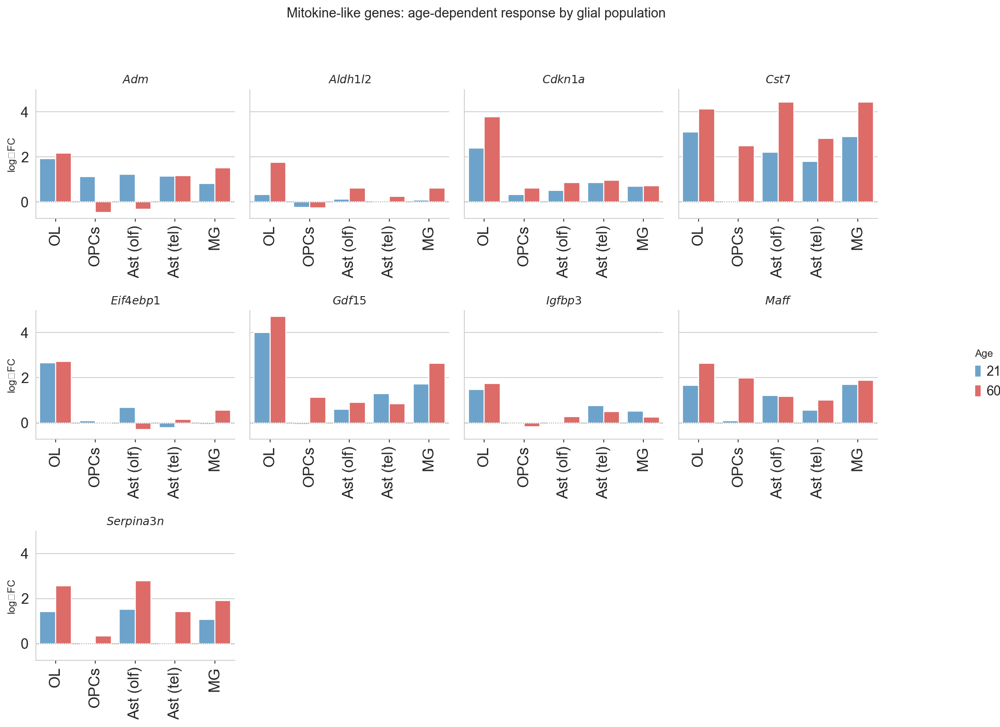

In [57]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# --- Abbreviations for cell class labels ---
cell_abbrev = {
    "Mature oligodendrocytes": "OL",
    "Oligodendrocytes precursor cells": "OPCs",
    "Olfactory astrocytes": "Ast (olf)",
    "Telencephalon astrocytes": "Ast (tel)",
    "Microglia": "MG",
}

# --- Prepare data ---
bars = (
    df[df["gene"].isin(mitokine_like)]
      .pivot_table(index=["gene", "cell_class", "age"], values="log2FC")
      .reset_index()
)

# Map abbreviations
bars["cell_class"] = bars["cell_class"].map(cell_abbrev).fillna(bars["cell_class"])

# Define consistent order
x_order_full = ["OL", "OPCs", "Ast (olf)", "Ast (tel)", "MG"]
x_order = [x for x in x_order_full if x in bars["cell_class"].unique()]

# --- Plot ---
sns.set_style("whitegrid")
g = sns.catplot(
    data=bars, kind="bar",
    x="cell_class", y="log2FC", hue="age",
    col="gene", col_wrap=4,
    order=x_order,
    palette=["#5DA5DA", "#F15854"],
    height=3.2,
    sharex=False, sharey=True
)

# --- Force draw so ticks exist ---
plt.draw()

# --- Customize each facet ---
for ax in g.axes.flat:
    ax.axhline(0, ls=":", c="0.6", lw=0.8)
    ax.set_xlabel("")
    ax.set_ylabel("log₂FC", fontsize=10)
    ax.set_xticks(np.arange(len(x_order)))
    ax.set_xticklabels(x_order, rotation=90, fontsize=15, fontweight="medium")
    ax.tick_params(axis='x', which='both', bottom=True, top=False, length=3, width=0.8)

    # Italicize gene titles
    title = ax.get_title()
    gene = title.split(" = ", 1)[-1] if " = " in title else title
    ax.set_title(rf"$\it{{{gene}}}$", fontsize=11)

# --- Move legend fully outside ---
g._legend.set_bbox_to_anchor((1.04, 0.5))
g._legend.set_title("Age")
g._legend._legend_box.align = "left"

# --- Figure title & layout ---
g.fig.suptitle(
    "Mitokine-like genes: age-dependent response by glial population",
    y=1.03,
    fontsize=13
)
plt.tight_layout(rect=[0, 0, 0.93, 1])  # extra room for legend

# --- Optional: SVG export (editable text in Illustrator) ---
g.fig.savefig("../results/figures/mitokine_bars_facets.png", bbox_inches="tight", format="png")

plt.show()

## Save results

In [58]:
import os

def save_all_results(results, outdir="../../results"):
    """
    Save all DE results from the nested `results` dict into organized subfolders.
    Structure:
        outdir/
          └── <cell_type>/
                ├── simple_effect_age_<age>.csv
                ├── deltaLFC_<ageA>_vs_<ageB>.csv
    """
    os.makedirs(outdir, exist_ok=True)

    for ct, rdict in results.items():
        ct_dir = os.path.join(outdir, ct.replace(" ", "_"))
        os.makedirs(ct_dir, exist_ok=True)

        # --- Simple effects (mtDSB vs control per age) ---
        for age, df in rdict.get("simple_effects", {}).items():
            if df is not None:
                fname = f"simple_effect_age_{age}.csv"
                df.to_csv(os.path.join(ct_dir, fname))

        # --- Delta-LFC (interaction proxy between ages) ---
        for (a1, a2), df in rdict.get("deltas", {}).items():
            if df is not None:
                fname = f"deltaLFC_{a1}_vs_{a2}.csv"
                df.to_csv(os.path.join(ct_dir, fname))

        print(f"✅ Saved {ct} results to {ct_dir}")

In [59]:
save_all_results(results, outdir="../results/age")

✅ Saved Mature oligodendrocytes results to ../results/age/Mature_oligodendrocytes
✅ Saved Telencephalon astrocytes results to ../results/age/Telencephalon_astrocytes
✅ Saved Microglia results to ../results/age/Microglia
✅ Saved Oligodendrocytes precursor cells results to ../results/age/Oligodendrocytes_precursor_cells
✅ Saved Olfactory astrocytes results to ../results/age/Olfactory_astrocytes


In [60]:
import scanpy as sc

In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import scipy.sparse as sp

def plot_spatial_grid_by_condition_age(
    adata,
    gene,
    *,
    layer=None,           # e.g. "log1p", "counts"; None -> .X
    use_raw=False,        # use adata.raw
    spot_size=30,
    cmap="coolwarm",
    percentile=99,        # global vmax percentile across ALL cells
    conditions=None,      # optional subset/list to order conditions (rows)
    ages=None,            # optional subset/list to order ages (cols)
    sample_index=0,       # which sample to show if multiple per (cond, age)
    condition_col="condition",
    age_col="age",
    sample_col="sample_id",
    title_fmt="{cond} | {age} | {sid}",
    vmin=0.0,
    figsize_scale=5.0,    # figure size scaling per row/col
    tight=True,
):
    """
    Plot a grid of spatial maps: rows = condition, cols = age.
    Uses a shared color scale computed from the chosen matrix/layer (or .raw).

    Returns
    -------
    fig, axes : matplotlib Figure and 2D axes array
    """
    # ---- helpers ----
    def _to_dense(x):
        return x.toarray() if sp.issparse(x) else np.asarray(x)

    def _get_gene_values(adata, gene, layer=None, use_raw=False):
        if use_raw:
            if adata.raw is None:
                raise ValueError("use_raw=True but adata.raw is None.")
            if gene not in adata.raw.var_names:
                raise ValueError(f"{gene} not in adata.raw.var_names.")
            mat = adata.raw[:, gene].X
            return _to_dense(mat).ravel()
        if gene not in adata.var_names:
            raise ValueError(f"{gene} not in adata.var_names.")
        if layer is None:
            mat = adata[:, gene].X
        else:
            if layer not in adata.layers:
                raise ValueError(f"Layer '{layer}' not in adata.layers: {list(adata.layers.keys())}")
            mat = adata[:, gene].layers[layer]
        return _to_dense(mat).ravel()

    # ---- basic sanity ----
    if sample_col not in adata.obs.columns:
        raise ValueError(f"'{sample_col}' not found in adata.obs.")
    if condition_col not in adata.obs.columns:
        raise ValueError(f"'{condition_col}' not found in adata.obs.")
    if age_col not in adata.obs.columns:
        raise ValueError(f"'{age_col}' not found in adata.obs.")

    # ---- labels & ordering ----
    cond_series = adata.obs[condition_col].astype(str)
    age_series  = adata.obs[age_col].astype(str)

    # ages: try numeric sort if possible
    if ages is None:
        try:
            uniq_ages = sorted(pd.to_numeric(age_series.unique()))
            ages = list(map(str, uniq_ages))
        except Exception:
            ages = sorted(age_series.unique(), key=lambda x: (len(x), x))
    else:
        ages = list(map(str, ages))

    # conditions: simple sorted unless user supplied
    if conditions is None:
        conditions = sorted(cond_series.unique(), key=lambda x: (len(x), x))
    else:
        conditions = list(map(str, conditions))

    # ---- map (cond, age) -> list of sample_ids
    df_keys = adata.obs[[sample_col, condition_col, age_col]].copy()
    df_keys[condition_col] = df_keys[condition_col].astype(str)
    df_keys[age_col]       = df_keys[age_col].astype(str)

    comb2samples = {}
    for sid, grp in df_keys.groupby(sample_col):
        c = grp[condition_col].iloc[0]
        a = grp[age_col].iloc[0]
        comb2samples.setdefault((c, a), []).append(sid)

    # ---- shared color scale from matrix values ----
    vals = _get_gene_values(adata, gene, layer=layer, use_raw=use_raw)
    vals = vals[np.isfinite(vals)]
    if vals.size == 0:
        raise ValueError(f"No finite values for {gene} in selected matrix/layer.")
    vmax = np.percentile(vals, percentile)

    # ---- figure grid ----
    n_rows, n_cols = len(conditions), len(ages)
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_scale * n_cols, figsize_scale * n_rows),
        squeeze=False
    )

    mappable = None
    for i, cond in enumerate(conditions):
        for j, age in enumerate(ages):
            ax = axes[i, j]
            sids = comb2samples.get((cond, age), [])
            if not sids:
                ax.axis("off")
                ax.set_title(f"{cond} | {age}\n(no sample)", fontsize=10)
                continue

            # choose sample
            idx = min(sample_index, len(sids) - 1)
            sid = sids[idx]
            ad_int = adata[adata.obs[sample_col] == sid]

            sc.pl.spatial(
                ad_int,
                color=gene,
                layer=layer,
                spot_size=spot_size,
                vmin=vmin,
                vmax=vmax,
                cmap=cmap,
                show=False,
                ax=ax,
            )
            ax.set_title(title_fmt.format(cond=cond, age=age, sid=sid), fontsize=10)

            if mappable is None:
                ims = ax.get_images()
                if ims:
                    mappable = ims[0]

    # ---- single global colorbar ----
    if mappable is not None:
        cbar = fig.colorbar(mappable, ax=axes, fraction=0.02, pad=0.02)
        cbar.set_label(gene)

    if tight:
        plt.tight_layout()
    plt.show()
    return fig, axes

In [466]:
sc.pp.normalize_total(adata, target_sum=1000)
sc.pp.log1p(adata)

Index(['Cst7', 'Gdf15', 'Hcrt', 'Mbp', 'Mog', 'Myrf', 'Pmch', 'Prl',
       'Serpina3n', 'Sox10', 'Trib3'],
      dtype='object')

In [736]:
mitokine_like = [
    "Gdf15",
]

Gdf15


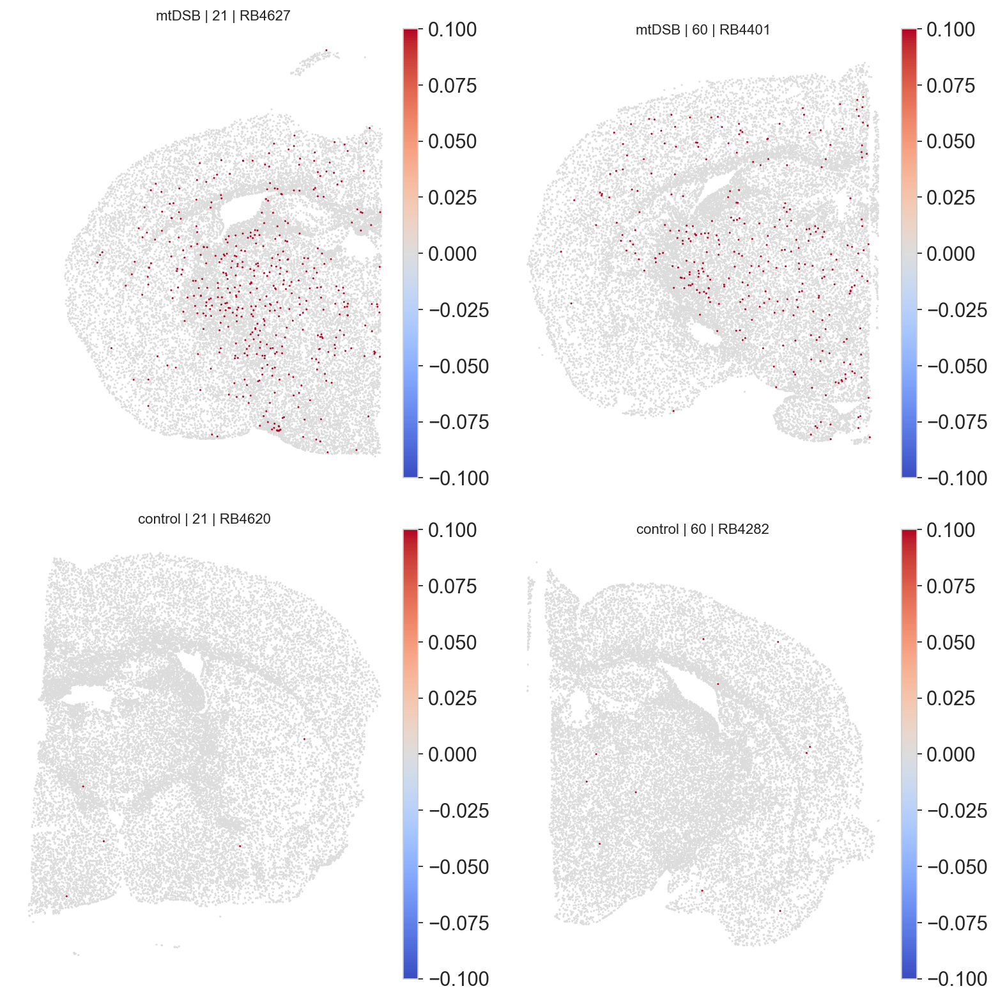

In [737]:
for gene in mitokine_like:
    print(gene)
    fig, axes = plot_spatial_grid_by_condition_age(
        adata,
        gene=gene,
        layer=None,        # or "log1p"/"counts"
        use_raw=False,
        cmap="coolwarm",
        percentile=99,
        spot_size=30,
        condition_col="condition",
        age_col="age",
        sample_col="sample_id",
    )

In [501]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_spatial_grid_basic(
    adata,
    *,
    condition_col="condition",
    age_col="age",
    sample_col="sample_id",
    conditions=None,
    ages=None,
    sample_index=0,
    figsize_scale=5.0,
    spot_size=30,
    # highlight mode
    highlight_col=None,        # e.g. "celltype_merged"
    highlight_value=None,      # e.g. "Microglia"
    highlight_color="tab:red",
    background_grey="#B0B0B0", # darker grey so it shows
    background_alpha=1.0,      # 1.0 = fully opaque background
    title_fmt="{cond} | {age} | {sid}",
    invert_y=True,             # Visium-style orientation
):
    # --- sanity
    for col in (condition_col, age_col, sample_col):
        if col not in adata.obs.columns:
            raise ValueError(f"'{col}' not found in adata.obs.")
    if "spatial" not in adata.obsm_keys():
        raise ValueError("No 'spatial' coordinates in adata.obsm.")

    # order axes
    cond_series = adata.obs[condition_col].astype(str)
    age_series  = adata.obs[age_col].astype(str)

    if ages is None:
        try:
            uniq_ages = sorted(pd.to_numeric(age_series.unique()))
            ages = list(map(str, uniq_ages))
        except Exception:
            ages = sorted(age_series.unique(), key=lambda x: (len(x), x))
    else:
        ages = list(map(str, ages))

    if conditions is None:
        conditions = sorted(cond_series.unique(), key=lambda x: (len(x), x))

    # map (cond, age) -> sample_ids
    key_df = adata.obs[[sample_col, condition_col, age_col]].astype(str)
    comb2samples = {}
    for sid, grp in key_df.groupby(sample_col):
        c = grp[condition_col].iloc[0]; a = grp[age_col].iloc[0]
        comb2samples.setdefault((c, a), []).append(sid)

    # figure
    n_rows, n_cols = len(conditions), len(ages)
    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(figsize_scale * n_cols, figsize_scale * n_rows),
        squeeze=False
    )

    for i, cond in enumerate(conditions):
        for j, age in enumerate(ages):
            ax = axes[i, j]
            sids = comb2samples.get((cond, age), [])
            if not sids:
                ax.axis("off"); ax.set_title(f"{cond} | {age}\n(no sample)", fontsize=10)
                continue

            sid = sids[min(sample_index, len(sids) - 1)]
            ad_sub = adata[adata.obs[sample_col] == sid]
            xy = ad_sub.obsm["spatial"]
            if xy is None or len(xy) == 0:
                ax.axis("off"); ax.set_title(f"{cond} | {age} | {sid}\n(no coords)", fontsize=10)
                continue

            # --- background: ALL cells in grey (opaque unless you change background_alpha)
            ax.scatter(
                xy[:, 0], xy[:, 1],
                s=spot_size,
                c=background_grey,
                alpha=background_alpha,
                edgecolors="none",
                zorder=1,
            )

            # --- overlay highlight (optional)
            if highlight_col is not None and highlight_value is not None:
                if highlight_col not in ad_sub.obs.columns:
                    ax.set_title(f"{cond} | {age} | {sid}\n(no '{highlight_col}')", fontsize=10)
                else:
                    mask = ad_sub.obs[highlight_col].astype(str).values == str(highlight_value)
                    if mask.any():
                        ax.scatter(
                            xy[mask, 0], xy[mask, 1],
                            s=spot_size,
                            c=highlight_color,
                            edgecolors="black",  # thin outline helps pop
                            linewidths=0.2,
                            zorder=2,
                        )

            ax.set_title(title_fmt.format(cond=cond, age=age, sid=sid), fontsize=10)
            ax.set_aspect("equal")
            ax.axis("off")
            if invert_y:
                ax.invert_yaxis()  # match Scanpy/Visium orientation

    plt.tight_layout()
    plt.show()
    return fig, axes

In [505]:
to_keep = ['Telencephalon astrocytes',
 'Olfactory astrocytes',
 'Mature oligodendrocytes',
 'Oligodendrocytes precursor cells']

In [ ]:
for cell in to_keep:
    print(cell)
    fig, axes = plot_spatial_grid_basic(
        adata,
        condition_col="condition",
        age_col="age",
        sample_col="sample_id",
        highlight_col="cell_class",
        highlight_value=cell,
        highlight_color="tab:red",
        spot_size=5,
        background_alpha=0.1,
    
    )

In [630]:
adata.X.max()

np.float32(6.1789427)